# Image Preprocessing Pipeline v3.0

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm import tqdm
import pandas as pd
import time
import warnings
from skimage.metrics import structural_similarity as ssim
from sklearn.metrics import mean_squared_error
import seaborn as sns
from datetime import datetime
import json

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')

# Project Configuration
BASE_DIR = Path(r"c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix")
RAW_DATASET_PATH = BASE_DIR / "Dataset" / "Raw Dataset" / "SipakMed Dataset"
OUTPUT_DIR = BASE_DIR / "Dataset" / "Preprocessing Analysis v3.0"

# Create output directory structure
OUTPUT_DIR.mkdir(exist_ok=True)
(OUTPUT_DIR / "visualizations").mkdir(exist_ok=True)
(OUTPUT_DIR / "processed_samples").mkdir(exist_ok=True)
(OUTPUT_DIR / "metrics").mkdir(exist_ok=True)

# Processing Configuration
TARGET_SIZE = (256, 256)  # Optimized size for cropped cells
SAMPLES_PER_CLASS = 4

# Cell Categories
CLASS_NAMES = [
    'im_Dyskeratotic',
    'im_Koilocytotic', 
    'im_Metaplastic',
    'im_Parabasal',
    'im_Superficial-Intermediate'
]

# Set up matplotlib for better visualizations
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 100

print("Configuration Setup Complete")
print(f"Base Directory: {BASE_DIR}")
print(f"Dataset Path: {RAW_DATASET_PATH}")
print(f"Output Directory: {OUTPUT_DIR}")
print(f"Target Image Size: {TARGET_SIZE}")
print(f"Samples per Class: {SAMPLES_PER_CLASS}")
print(f"Total Classes: {len(CLASS_NAMES)}")
print(f"Analysis Timestamp: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

def load_cropped_sample_images():
    """
    Load sample images from the CROPPED folders for each cell category.
    
    Returns:
        dict: Dictionary mapping class names to lists of cropped image data
    """
    sample_images = {}
    
    print("Loading cropped sample images...")
    for class_name in CLASS_NAMES:
        cropped_path = RAW_DATASET_PATH / class_name / class_name / "CROPPED"
        
        if not cropped_path.exists():
            print(f"Warning: CROPPED path {cropped_path} does not exist")
            continue
        
        # Get all .bmp files from CROPPED folder
        image_files = list(cropped_path.glob('*.bmp'))
        
        if len(image_files) < SAMPLES_PER_CLASS:
            print(f"Warning: Only {len(image_files)} cropped images found in {class_name}")
            selected_files = image_files
        else:
            # Select evenly distributed samples
            step = len(image_files) // SAMPLES_PER_CLASS
            selected_files = [image_files[i * step] for i in range(SAMPLES_PER_CLASS)]
        
        sample_images[class_name] = []
        
        for img_file in selected_files:
            try:
                image = cv2.imread(str(img_file))
                if image is not None:
                    # Resize with aspect ratio preservation using mirroring
                    image_resized, scale_factor, padding_info = resize_with_aspect_ratio_mirroring(image, TARGET_SIZE)
                    sample_images[class_name].append({
                        'image': image_resized,
                        'original_image': image,
                        'filename': img_file.name,
                        'path': str(img_file),
                        'original_size': image.shape[:2],
                        'scale_factor': scale_factor,
                        'padding_info': padding_info
                    })
                    print(f"  ✓ Loaded: {class_name}/{img_file.name} (Original: {image.shape[:2]}, Resized: {TARGET_SIZE}, Scale: {scale_factor:.3f})")
                else:
                    print(f"  ✗ Failed to load: {img_file}")
            except Exception as e:
                print(f"  ✗ Error loading {img_file}: {e}")
    
    return sample_images

# Example implementation of the image loading function
cropped_samples = load_cropped_sample_images()
#Visualize the cropped samples


### Function to resize the image without changing the aspect ratio of cellular morphology

In [ ]:
def resize_with_aspect_ratio_mirroring(image, target_size=(256, 256)):
    """
    Resize image to target size while preserving aspect ratio using mirroring for padding.
    
    Args:
        image: Input image (numpy array)
        target_size: Tuple of (width, height) for target size
        
    Returns:
        resized_image: Image resized to target size with aspect ratio preserved
        scale_factor: The scaling factor applied
        padding_info: Dictionary containing padding information
    """
    h, w = image.shape[:2]
    target_w, target_h = target_size
    
    # Calculate scaling factor to fit the image within target size
    scale_w = target_w / w
    scale_h = target_h / h
    scale = min(scale_w, scale_h)  # Use smaller scale to maintain aspect ratio
    
    # Calculate new dimensions after scaling
    new_w = int(w * scale)
    new_h = int(h * scale)
    
    # Resize the image with the calculated scale
    resized = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_LANCZOS4)
    
    # Calculate padding needed
    pad_w = target_w - new_w
    pad_h = target_h - new_h
    
    # Calculate padding for each side
    pad_left = pad_w // 2
    pad_right = pad_w - pad_left
    pad_top = pad_h // 2
    pad_bottom = pad_h - pad_top
    
    # Create the final image with mirroring
    if len(image.shape) == 3:  # Color image
        final_image = np.zeros((target_h, target_w, image.shape[2]), dtype=image.dtype)
    else:  # Grayscale image
        final_image = np.zeros((target_h, target_w), dtype=image.dtype)
    
    # Place the resized image in the center
    final_image[pad_top:pad_top+new_h, pad_left:pad_left+new_w] = resized
    
    # Apply mirroring for padding
    if pad_top > 0:
        # Top padding - mirror the top edge
        mirror_height = min(pad_top, new_h)
        final_image[pad_top-mirror_height:pad_top, pad_left:pad_left+new_w] = \
            resized[:mirror_height, :][::-1, :]
    
    if pad_bottom > 0:
        # Bottom padding - mirror the bottom edge
        mirror_height = min(pad_bottom, new_h)
        final_image[pad_top+new_h:pad_top+new_h+mirror_height, pad_left:pad_left+new_w] = \
            resized[-mirror_height:, :][::-1, :]
    
    if pad_left > 0:
        # Left padding - mirror the left edge
        mirror_width = min(pad_left, new_w)
        final_image[pad_top:pad_top+new_h, pad_left-mirror_width:pad_left] = \
            resized[:, :mirror_width][:, ::-1]
    
    if pad_right > 0:
        # Right padding - mirror the right edge
        mirror_width = min(pad_right, new_w)
        final_image[pad_top:pad_top+new_h, pad_left+new_w:pad_left+new_w+mirror_width] = \
            resized[:, -mirror_width:][:, ::-1]
    
    # Handle corner padding by extending the edge mirroring
    if pad_top > 0 and pad_left > 0:
        # Top-left corner
        corner_h = min(pad_top, new_h)
        corner_w = min(pad_left, new_w)
        final_image[pad_top-corner_h:pad_top, pad_left-corner_w:pad_left] = \
            resized[:corner_h, :corner_w][::-1, ::-1]
    
    if pad_top > 0 and pad_right > 0:
        # Top-right corner
        corner_h = min(pad_top, new_h)
        corner_w = min(pad_right, new_w)
        final_image[pad_top-corner_h:pad_top, pad_left+new_w:pad_left+new_w+corner_w] = \
            resized[:corner_h, -corner_w:][::-1, ::-1]
    
    if pad_bottom > 0 and pad_left > 0:
        # Bottom-left corner
        corner_h = min(pad_bottom, new_h)
        corner_w = min(pad_left, new_w)
        final_image[pad_top+new_h:pad_top+new_h+corner_h, pad_left-corner_w:pad_left] = \
            resized[-corner_h:, :corner_w][::-1, ::-1]
    
    if pad_bottom > 0 and pad_right > 0:
        # Bottom-right corner
        corner_h = min(pad_bottom, new_h)
        corner_w = min(pad_right, new_w)
        final_image[pad_top+new_h:pad_top+new_h+corner_h, pad_left+new_w:pad_left+new_w+corner_w] = \
            resized[-corner_h:, -corner_w:][::-1, ::-1]
    
    padding_info = {
        'original_size': (w, h),
        'scaled_size': (new_w, new_h),
        'padding': {'top': pad_top, 'bottom': pad_bottom, 'left': pad_left, 'right': pad_right},
        'scale_factor': scale
    }
    
    return final_image, scale, padding_info

def visualize_resize_comparison(original, resized, padding_info, title="Resize Comparison"):
    """
    Visualize the original and resized images side by side with information.
    """
    fig, axes = plt.subplots(1, 2, figsize=(15, 7))
    
    # Convert BGR to RGB for matplotlib
    if len(original.shape) == 3:
        original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
        resized_rgb = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
    else:
        original_rgb = original
        resized_rgb = resized
    
    # Display original image
    axes[0].imshow(original_rgb, cmap='gray' if len(original.shape) == 2 else None)
    axes[0].set_title(f'Original Image\nSize: {padding_info["original_size"]}')
    axes[0].axis('off')
    
    # Display resized image
    axes[1].imshow(resized_rgb, cmap='gray' if len(resized.shape) == 2 else None)
    axes[1].set_title(f'Resized with Mirroring\nSize: {resized.shape[:2][::-1]}\nScale: {padding_info["scale_factor"]:.3f}')
    axes[1].axis('off')
    
    # Add padding information
    pad_info = padding_info['padding']
    info_text = f"Padding - Top: {pad_info['top']}, Bottom: {pad_info['bottom']}, Left: {pad_info['left']}, Right: {pad_info['right']}"
    fig.suptitle(f'{title}\n{info_text}', fontsize=12)
    
    plt.tight_layout()
    return fig

print("✓ Aspect ratio preserving resize function with mirroring implemented")

### Visualizing Image Resizing 

- Resized the images to a standard size of 256*256
- Padded the images by mirroring the components of the images without changing the aspect ratios of cellular morphology 

In [ ]:
# Load and visualize the cropped samples with aspect ratio preserving resize
cropped_samples = load_cropped_sample_images()

# Visualize comparison for each class
def create_comprehensive_visualization():
    """
    Create a comprehensive visualization showing original vs resized images for all classes.
    """
    fig, axes = plt.subplots(len(CLASS_NAMES), 4, figsize=(20, 5 * len(CLASS_NAMES)))
    fig.suptitle('Original vs Aspect Ratio Preserving Resize with Mirroring\n(First 2 samples per class)', fontsize=16)
    
    for class_idx, class_name in enumerate(CLASS_NAMES):
        if class_name in cropped_samples and len(cropped_samples[class_name]) > 0:
            # Show first 2 samples for each class
            for sample_idx in range(min(2, len(cropped_samples[class_name]))):
                sample = cropped_samples[class_name][sample_idx]
                
                # Original image
                original = sample['original_image']
                resized = sample['image']
                padding_info = sample['padding_info']
                
                # Convert BGR to RGB for matplotlib
                if len(original.shape) == 3:
                    original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
                    resized_rgb = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
                else:
                    original_rgb = original
                    resized_rgb = resized
                
                # Plot original
                col_idx = sample_idx * 2
                axes[class_idx, col_idx].imshow(original_rgb, cmap='gray' if len(original.shape) == 2 else None)
                axes[class_idx, col_idx].set_title(f'Original\n{padding_info["original_size"]}')
                axes[class_idx, col_idx].axis('off')
                
                # Plot resized
                axes[class_idx, col_idx + 1].imshow(resized_rgb, cmap='gray' if len(resized.shape) == 2 else None)
                axes[class_idx, col_idx + 1].set_title(f'Resized (Scale: {padding_info["scale_factor"]:.3f})\n{TARGET_SIZE}')
                axes[class_idx, col_idx + 1].axis('off')
                
                # Add class label on the left
                if sample_idx == 0:
                    axes[class_idx, 0].text(-0.15, 0.5, class_name.replace('im_', ''), 
                                          transform=axes[class_idx, 0].transAxes, 
                                          rotation=90, verticalalignment='center',
                                          fontsize=12, fontweight='bold')
        else:
            # If no samples, show empty plots
            for col_idx in range(4):
                axes[class_idx, col_idx].text(0.5, 0.5, 'No samples\navailable', 
                                            ha='center', va='center', transform=axes[class_idx, col_idx].transAxes)
                axes[class_idx, col_idx].axis('off')
    
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'visualizations' / 'aspect_ratio_resize_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    return fig

# Create the visualization
comparison_fig = create_comprehensive_visualization()

## Implementing PMD 

In [ ]:
import numpy as np

def perona_malik_diffusion(img, niter=20, kappa=30, gamma=0.1, option=1):
    """
    Perona-Malik anisotropic diffusion.
    
    Args:
        img (np.array): Input grayscale image (H, W).
        niter (int): Number of iterations.
        kappa (float): Conduction coefficient.
        gamma (float): Time step (<=0.25).
        option (int): 1 = exponential, 2 = reciprocal conduction.
        
    Returns:
        np.array: Diffused image.
    """
    img = img.astype(np.float32)
    diffused = img.copy()

    for _ in range(niter):
        # Shifted images
        north = np.roll(diffused, -1, axis=0)
        south = np.roll(diffused, 1, axis=0)
        east = np.roll(diffused, -1, axis=1)
        west = np.roll(diffused, 1, axis=1)

        # Gradients
        deltaN = north - diffused
        deltaS = south - diffused
        deltaE = east - diffused
        deltaW = west - diffused

        if option == 1:
            cN = np.exp(-(deltaN/kappa)**2)
            cS = np.exp(-(deltaS/kappa)**2)
            cE = np.exp(-(deltaE/kappa)**2)
            cW = np.exp(-(deltaW/kappa)**2)
        elif option == 2:
            cN = 1.0 / (1.0 + (deltaN/kappa)**2)
            cS = 1.0 / (1.0 + (deltaS/kappa)**2)
            cE = 1.0 / (1.0 + (deltaE/kappa)**2)
            cW = 1.0 / (1.0 + (deltaW/kappa)**2)

        # Update
        diffused += gamma * (cN*deltaN + cS*deltaS + cE*deltaE + cW*deltaW)

    return np.clip(diffused, 0, 255).astype(np.uint8)


### Helper Funcitons to determine Image Quality 

- Implementing PSNR (Peak Signal to Noise Ratio), SSIM (Structural Similarity Index) and EPI (Edge Preservation Index)

In [ ]:
def calculate_psnr(original, processed):
    """
    Calculate Peak Signal-to-Noise Ratio (PSNR) between two images.
    
    Args:
        original: Original image
        processed: Processed image
        
    Returns:
        float: PSNR value in dB
    """
    mse = np.mean((original.astype(np.float64) - processed.astype(np.float64)) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

def calculate_ssim(original, processed):
    """
    Calculate Structural Similarity Index (SSIM) between two images.
    
    Args:
        original: Original image
        processed: Processed image
        
    Returns:
        float: SSIM value between -1 and 1
    """
    # Convert to grayscale if needed
    if len(original.shape) == 3:
        original_gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
    else:
        original_gray = original
        
    if len(processed.shape) == 3:
        processed_gray = cv2.cvtColor(processed, cv2.COLOR_BGR2GRAY)
    else:
        processed_gray = processed
    
    return ssim(original_gray, processed_gray, data_range=255)

def calculate_epi(image):
    """
    Calculate Edge Preservation Index (EPI) - measure of edge preservation.
    Higher values indicate better edge preservation.
    
    Args:
        image: Input image
        
    Returns:
        float: EPI value
    """
    # Convert to grayscale if needed
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    
    # Calculate gradients using Sobel operator
    grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    
    # Calculate gradient magnitude
    gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)
    
    # EPI is the mean of gradient magnitude
    epi = np.mean(gradient_magnitude)
    
    return epi

def calculate_edge_preservation_ratio(original, processed):
    """
    Calculate the ratio of edge preservation between original and processed images.
    
    Args:
        original: Original image
        processed: Processed image
        
    Returns:
        float: Edge preservation ratio
    """
    epi_original = calculate_epi(original)
    epi_processed = calculate_epi(processed)
    
    if epi_original == 0:
        return 0
    
    return epi_processed / epi_original

def assess_image_quality(original, processed, title="Image Quality Assessment"):
    """
    Comprehensive image quality assessment.
    
    Args:
        original: Original image
        processed: Processed image
        title: Title for the assessment
        
    Returns:
        dict: Dictionary containing all quality metrics
    """
    metrics = {
        'psnr': calculate_psnr(original, processed),
        'ssim': calculate_ssim(original, processed),
        'epi_original': calculate_epi(original),
        'epi_processed': calculate_epi(processed),
        'edge_preservation_ratio': calculate_edge_preservation_ratio(original, processed)
    }
    
    return metrics

print("✓ Image quality assessment functions implemented")
print("  - PSNR: Peak Signal-to-Noise Ratio")
print("  - SSIM: Structural Similarity Index")
print("  - EPI: Edge Preservation Index")
print("  - Edge Preservation Ratio")

In [ ]:
def apply_pmd_to_image(image, niter=20, kappa=30, gamma=0.1, option=1):
    """
    Apply Perona-Malik Diffusion to an image (handles both color and grayscale).
    
    Args:
        image: Input image (color or grayscale)
        niter: Number of iterations
        kappa: Conduction coefficient
        gamma: Time step
        option: Conduction function option (1 or 2)
        
    Returns:
        Processed image
    """
    if len(image.shape) == 3:
        # Color image - process each channel separately
        processed = np.zeros_like(image)
        for channel in range(3):
            processed[:, :, channel] = perona_malik_diffusion(
                image[:, :, channel], niter=niter, kappa=kappa, gamma=gamma, option=option
            )
        return processed
    else:
        # Grayscale image
        return perona_malik_diffusion(image, niter=niter, kappa=kappa, gamma=gamma, option=option)

def test_pmd_hyperparameters(sample_images, hyperparameter_sets):
    """
    Test different hyperparameter combinations for PMD on sample images.
    
    Args:
        sample_images: Dictionary of sample images by class
        hyperparameter_sets: List of hyperparameter dictionaries
        
    Returns:
        Dictionary containing results for each hyperparameter set
    """
    results = {}
    
    print("Testing PMD hyperparameters...")
    print("-" * 50)
    
    for i, params in enumerate(hyperparameter_sets):
        param_key = f"Set_{i+1}_{params['niter']}_{params['kappa']}_{params['gamma']}_{params['option']}"
        results[param_key] = {
            'parameters': params,
            'class_results': {},
            'overall_metrics': {
                'avg_psnr': 0,
                'avg_ssim': 0,
                'avg_edge_preservation': 0,
                'processing_time': 0
            }
        }
        
        print(f"\nTesting Parameter Set {i+1}:")
        print(f"  niter={params['niter']}, kappa={params['kappa']}, gamma={params['gamma']}, option={params['option']}")
        
        total_psnr = 0
        total_ssim = 0
        total_edge_preservation = 0
        total_processing_time = 0
        sample_count = 0
        
        for class_name, samples in sample_images.items():
            if not samples:
                continue
                
            class_metrics = []
            
            for sample in samples:
                start_time = time.time()
                
                # Apply PMD
                processed_image = apply_pmd_to_image(
                    sample['image'],
                    niter=params['niter'],
                    kappa=params['kappa'],
                    gamma=params['gamma'],
                    option=params['option']
                )
                
                processing_time = time.time() - start_time
                
                # Calculate quality metrics
                metrics = assess_image_quality(sample['image'], processed_image)
                metrics['processing_time'] = processing_time
                metrics['processed_image'] = processed_image
                
                class_metrics.append(metrics)
                
                # Update totals
                total_psnr += metrics['psnr']
                total_ssim += metrics['ssim']
                total_edge_preservation += metrics['edge_preservation_ratio']
                total_processing_time += processing_time
                sample_count += 1
            
            results[param_key]['class_results'][class_name] = class_metrics
            
            # Print class summary
            if class_metrics:
                avg_psnr = np.mean([m['psnr'] for m in class_metrics])
                avg_ssim = np.mean([m['ssim'] for m in class_metrics])
                avg_edge = np.mean([m['edge_preservation_ratio'] for m in class_metrics])
                print(f"    {class_name}: PSNR={avg_psnr:.2f}, SSIM={avg_ssim:.3f}, Edge={avg_edge:.3f}")
        
        # Calculate overall averages
        if sample_count > 0:
            results[param_key]['overall_metrics']['avg_psnr'] = total_psnr / sample_count
            results[param_key]['overall_metrics']['avg_ssim'] = total_ssim / sample_count
            results[param_key]['overall_metrics']['avg_edge_preservation'] = total_edge_preservation / sample_count
            results[param_key]['overall_metrics']['processing_time'] = total_processing_time / sample_count
            
            print(f"  Overall Averages: PSNR={total_psnr/sample_count:.2f}, " +
                  f"SSIM={total_ssim/sample_count:.3f}, " +
                  f"Edge={total_edge_preservation/sample_count:.3f}, " +
                  f"Time={total_processing_time/sample_count:.3f}s")
    
    return results

# Define hyperparameter sets to test
hyperparameter_sets = [
    # Base set as suggested
    {'niter': 15, 'kappa': 3, 'gamma': 0.15, 'option': 1},
    {'niter': 20, 'kappa': 3, 'gamma': 0.15, 'option': 1},
    
    # Vary kappa
    {'niter': 15, 'kappa': 5, 'gamma': 0.15, 'option': 1},
    {'niter': 15, 'kappa': 10, 'gamma': 0.15, 'option': 1},
    {'niter': 15, 'kappa': 15, 'gamma': 0.15, 'option': 1},
    
    # Vary gamma
    {'niter': 15, 'kappa': 3, 'gamma': 0.1, 'option': 1},
    {'niter': 15, 'kappa': 3, 'gamma': 0.2, 'option': 1},
    {'niter': 15, 'kappa': 3, 'gamma': 0.25, 'option': 1},
    
    # Test option 2 (reciprocal conduction)
    {'niter': 15, 'kappa': 3, 'gamma': 0.15, 'option': 2},
    {'niter': 20, 'kappa': 5, 'gamma': 0.15, 'option': 2},
    
    # Optimized combinations
    {'niter': 18, 'kappa': 5, 'gamma': 0.12, 'option': 1},
    {'niter': 12, 'kappa': 8, 'gamma': 0.18, 'option': 1},
]

print("✓ PMD hyperparameter testing framework implemented")
print(f"✓ {len(hyperparameter_sets)} hyperparameter sets defined for testing")

In [ ]:
def visualize_pmd_comparison(original, processed_results, class_name, sample_idx):
    """
    Visualize PMD results for different parameter sets.
    
    Args:
        original: Original image
        processed_results: Dictionary of processed images with different parameters
        class_name: Name of the cell class
        sample_idx: Sample index
    """
    n_sets = len(processed_results)
    cols = min(4, n_sets + 1)  # +1 for original
    rows = (n_sets + cols) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    # Convert BGR to RGB for matplotlib if needed
    if len(original.shape) == 3:
        original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    else:
        original_rgb = original
    
    # Show original image
    axes[0, 0].imshow(original_rgb, cmap='gray' if len(original.shape) == 2 else None)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    
    # Show processed images
    for idx, (param_key, result_data) in enumerate(processed_results.items()):
        if idx >= n_sets:
            break
            
        row = (idx + 1) // cols
        col = (idx + 1) % cols
        
        processed_img = result_data['processed_image']
        metrics = result_data['metrics']
        
        if len(processed_img.shape) == 3:
            processed_rgb = cv2.cvtColor(processed_img, cv2.COLOR_BGR2RGB)
        else:
            processed_rgb = processed_img
        
        axes[row, col].imshow(processed_rgb, cmap='gray' if len(processed_img.shape) == 2 else None)
        
        # Create title with parameters and metrics
        params = result_data['parameters']
        title = f"niter={params['niter']}, κ={params['kappa']}\nγ={params['gamma']}, opt={params['option']}\n"
        title += f"PSNR={metrics['psnr']:.1f}, SSIM={metrics['ssim']:.3f}\nEdge={metrics['edge_preservation_ratio']:.3f}"
        
        axes[row, col].set_title(title, fontsize=9)
        axes[row, col].axis('off')
    
    # Hide unused subplots
    total_plots = n_sets + 1
    for idx in range(total_plots, rows * cols):
        row = idx // cols
        col = idx % cols
        axes[row, col].axis('off')
    
    fig.suptitle(f'PMD Parameter Comparison - {class_name} (Sample {sample_idx + 1})', fontsize=14)
    plt.tight_layout()
    return fig

def create_metrics_comparison_plot(test_results):
    """
    Create comprehensive comparison plots of all metrics across parameter sets.
    
    Args:
        test_results: Results from test_pmd_hyperparameters function
    """
    # Extract data for plotting
    param_labels = []
    psnr_values = []
    ssim_values = []
    edge_values = []
    time_values = []
    
    for param_key, result in test_results.items():
        # Create short label
        params = result['parameters']
        label = f"n{params['niter']}_k{params['kappa']}_g{params['gamma']}_o{params['option']}"
        param_labels.append(label)
        
        metrics = result['overall_metrics']
        psnr_values.append(metrics['avg_psnr'])
        ssim_values.append(metrics['avg_ssim'])
        edge_values.append(metrics['avg_edge_preservation'])
        time_values.append(metrics['processing_time'])
    
    # Create subplots
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # PSNR plot
    axes[0, 0].bar(range(len(param_labels)), psnr_values, color='skyblue', alpha=0.7)
    axes[0, 0].set_title('Peak Signal-to-Noise Ratio (PSNR)', fontsize=12, fontweight='bold')
    axes[0, 0].set_ylabel('PSNR (dB)')
    axes[0, 0].set_xticks(range(len(param_labels)))
    axes[0, 0].set_xticklabels(param_labels, rotation=45, ha='right')
    axes[0, 0].grid(True, alpha=0.3)
    
    # Add value labels on bars
    for i, v in enumerate(psnr_values):
        axes[0, 0].text(i, v + max(psnr_values) * 0.01, f'{v:.1f}', ha='center', va='bottom', fontsize=8)
    
    # SSIM plot
    axes[0, 1].bar(range(len(param_labels)), ssim_values, color='lightgreen', alpha=0.7)
    axes[0, 1].set_title('Structural Similarity Index (SSIM)', fontsize=12, fontweight='bold')
    axes[0, 1].set_ylabel('SSIM')
    axes[0, 1].set_xticks(range(len(param_labels)))
    axes[0, 1].set_xticklabels(param_labels, rotation=45, ha='right')
    axes[0, 1].grid(True, alpha=0.3)
    
    for i, v in enumerate(ssim_values):
        axes[0, 1].text(i, v + max(ssim_values) * 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=8)
    
    # Edge Preservation plot
    axes[1, 0].bar(range(len(param_labels)), edge_values, color='salmon', alpha=0.7)
    axes[1, 0].set_title('Edge Preservation Ratio', fontsize=12, fontweight='bold')
    axes[1, 0].set_ylabel('Edge Preservation Ratio')
    axes[1, 0].set_xticks(range(len(param_labels)))
    axes[1, 0].set_xticklabels(param_labels, rotation=45, ha='right')
    axes[1, 0].grid(True, alpha=0.3)
    
    for i, v in enumerate(edge_values):
        axes[1, 0].text(i, v + max(edge_values) * 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=8)
    
    # Processing Time plot
    axes[1, 1].bar(range(len(param_labels)), time_values, color='gold', alpha=0.7)
    axes[1, 1].set_title('Processing Time per Image', fontsize=12, fontweight='bold')
    axes[1, 1].set_ylabel('Time (seconds)')
    axes[1, 1].set_xticks(range(len(param_labels)))
    axes[1, 1].set_xticklabels(param_labels, rotation=45, ha='right')
    axes[1, 1].grid(True, alpha=0.3)
    
    for i, v in enumerate(time_values):
        axes[1, 1].text(i, v + max(time_values) * 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    return fig

def create_detailed_results_table(test_results):
    """
    Create a detailed results table for analysis.
    
    Args:
        test_results: Results from test_pmd_hyperparameters function
        
    Returns:
        pandas.DataFrame: Detailed results table
    """
    rows = []
    
    for param_key, result in test_results.items():
        params = result['parameters']
        metrics = result['overall_metrics']
        
        row = {
            'Parameter_Set': param_key,
            'niter': params['niter'],
            'kappa': params['kappa'],
            'gamma': params['gamma'],
            'option': params['option'],
            'PSNR': metrics['avg_psnr'],
            'SSIM': metrics['avg_ssim'],
            'Edge_Preservation': metrics['avg_edge_preservation'],
            'Processing_Time': metrics['processing_time'],
            'Quality_Score': (metrics['avg_psnr'] / 100 + metrics['avg_ssim'] + metrics['avg_edge_preservation']) / 3  # Composite score
        }
        rows.append(row)
    
    df = pd.DataFrame(rows)
    
    # Sort by quality score
    df = df.sort_values('Quality_Score', ascending=False)
    
    return df

print("✓ PMD visualization and analysis functions implemented")
print("  - visualize_pmd_comparison: Compare different parameter sets visually")
print("  - create_metrics_comparison_plot: Bar plots for all metrics")
print("  - create_detailed_results_table: Detailed results analysis")

In [ ]:
# Run comprehensive PMD hyperparameter testing
print("=" * 60)
print("PERONA-MALIK DIFFUSION HYPERPARAMETER OPTIMIZATION")
print("=" * 60)

# Test all hyperparameter combinations
pmd_test_results = test_pmd_hyperparameters(cropped_samples, hyperparameter_sets)

print("\n" + "=" * 60)
print("ANALYSIS COMPLETE - GENERATING VISUALIZATIONS")
print("=" * 60)

# Create comprehensive metrics comparison
print("\nCreating metrics comparison plots...")
metrics_fig = create_metrics_comparison_plot(pmd_test_results)
plt.savefig(OUTPUT_DIR / 'visualizations' / 'pmd_metrics_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

# Create detailed results table
print("\nGenerating detailed results table...")
results_df = create_detailed_results_table(pmd_test_results)

print("\n📊 TOP 5 PARAMETER COMBINATIONS (by Quality Score):")
print("-" * 80)
top_5 = results_df.head(5)
for idx, row in top_5.iterrows():
    print(f"{row['Parameter_Set']}")
    print(f"  Parameters: niter={row['niter']}, kappa={row['kappa']}, gamma={row['gamma']}, option={row['option']}")
    print(f"  Metrics: PSNR={row['PSNR']:.2f}, SSIM={row['SSIM']:.3f}, Edge={row['Edge_Preservation']:.3f}")
    print(f"  Quality Score: {row['Quality_Score']:.3f}, Processing Time: {row['Processing_Time']:.3f}s")
    print()

# Save detailed results
results_df.to_csv(OUTPUT_DIR / 'metrics' / 'pmd_hyperparameter_results.csv', index=False)
print(f"✓ Detailed results saved to: {OUTPUT_DIR / 'metrics' / 'pmd_hyperparameter_results.csv'}")

# Find the best parameter set
best_params = results_df.iloc[0]
print(f"\n🏆 BEST PARAMETER SET: {best_params['Parameter_Set']}")
print(f"   niter={best_params['niter']}, kappa={best_params['kappa']}, gamma={best_params['gamma']}, option={best_params['option']}")
print(f"   Quality Score: {best_params['Quality_Score']:.3f}")

# Store best parameters for later use
BEST_PMD_PARAMS = {
    'niter': int(best_params['niter']),
    'kappa': best_params['kappa'],
    'gamma': best_params['gamma'],
    'option': int(best_params['option'])
}

print(f"\n✓ Best PMD parameters stored in BEST_PMD_PARAMS variable")

In [ ]:
# Create visual comparisons for each class with best parameters
print("\n" + "=" * 60)
print("VISUAL COMPARISON OF PMD RESULTS")
print("=" * 60)

def create_pmd_before_after_comparison(sample_images, best_params, num_samples=2):
    """
    Create before/after comparison using the best PMD parameters.
    """
    for class_name, samples in sample_images.items():
        if not samples or len(samples) == 0:
            continue
            
        print(f"\nProcessing {class_name} samples...")
        
        # Limit to specified number of samples
        samples_to_process = samples[:num_samples]
        
        for sample_idx, sample in enumerate(samples_to_process):
            # Apply best PMD parameters
            processed_image = apply_pmd_to_image(
                sample['image'],
                niter=best_params['niter'],
                kappa=best_params['kappa'],
                gamma=best_params['gamma'],
                option=best_params['option']
            )
            
            # Calculate metrics
            metrics = assess_image_quality(sample['image'], processed_image)
            
            # Create comparison visualization
            fig, axes = plt.subplots(1, 3, figsize=(18, 6))
            
            # Original image
            if len(sample['image'].shape) == 3:
                original_rgb = cv2.cvtColor(sample['image'], cv2.COLOR_BGR2RGB)
                processed_rgb = cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB)
            else:
                original_rgb = sample['image']
                processed_rgb = processed_image
            
            # Display images
            axes[0].imshow(original_rgb, cmap='gray' if len(sample['image'].shape) == 2 else None)
            axes[0].set_title(f'Original Image\n{sample["filename"]}', fontsize=12)
            axes[0].axis('off')
            
            axes[1].imshow(processed_rgb, cmap='gray' if len(processed_image.shape) == 2 else None)
            axes[1].set_title(f'PMD Processed\nniter={best_params["niter"]}, κ={best_params["kappa"]}, γ={best_params["gamma"]}', fontsize=12)
            axes[1].axis('off')
            
            # Difference image
            diff_image = np.abs(sample['image'].astype(np.float32) - processed_image.astype(np.float32))
            if len(diff_image.shape) == 3:
                diff_gray = cv2.cvtColor(diff_image.astype(np.uint8), cv2.COLOR_BGR2GRAY)
            else:
                diff_gray = diff_image.astype(np.uint8)
            
            axes[2].imshow(diff_gray, cmap='hot')
            axes[2].set_title(f'Difference Map\n(Noise Reduction Visualization)', fontsize=12)
            axes[2].axis('off')
            
            # Add metrics as text
            metrics_text = f"""Quality Metrics:
PSNR: {metrics['psnr']:.2f} dB
SSIM: {metrics['ssim']:.3f}
Edge Preservation: {metrics['edge_preservation_ratio']:.3f}
Original EPI: {metrics['epi_original']:.1f}
Processed EPI: {metrics['epi_processed']:.1f}"""
            
            fig.text(0.02, 0.02, metrics_text, fontsize=10, verticalalignment='bottom',
                    bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
            
            plt.suptitle(f'{class_name.replace("im_", "")} - Sample {sample_idx + 1}: PMD Enhancement Results', 
                        fontsize=16, fontweight='bold')
            plt.tight_layout()
            
            # Save individual comparisons
            save_name = f'pmd_comparison_{class_name}_sample_{sample_idx + 1}.png'
            plt.savefig(OUTPUT_DIR / 'visualizations' / save_name, dpi=300, bbox_inches='tight')
            plt.show()
            
            print(f"  ✓ {class_name} Sample {sample_idx + 1}: PSNR={metrics['psnr']:.2f}, SSIM={metrics['ssim']:.3f}, Edge={metrics['edge_preservation_ratio']:.3f}")

# Create the before/after comparisons
create_pmd_before_after_comparison(cropped_samples, BEST_PMD_PARAMS, num_samples=2)

print(f"\n✅ PMD analysis complete!")
print(f"📁 All visualizations saved to: {OUTPUT_DIR / 'visualizations'}")
print(f"📊 Metrics data saved to: {OUTPUT_DIR / 'metrics'}")
print(f"\n🎯 Recommended PMD Parameters:")
print(f"   niter = {BEST_PMD_PARAMS['niter']}")
print(f"   kappa = {BEST_PMD_PARAMS['kappa']}")
print(f"   gamma = {BEST_PMD_PARAMS['gamma']}")
print(f"   option = {BEST_PMD_PARAMS['option']}")

In [ ]:
# Define more aggressive hyperparameter sets to achieve SSIM < 0.95
# These parameters are designed to produce more noticeable preprocessing effects

print("=" * 70)
print("AGGRESSIVE PMD HYPERPARAMETER TESTING FOR SIGNIFICANT PREPROCESSING")
print("Target: SSIM < 0.95 with useful image quality improvement")
print("=" * 70)

aggressive_hyperparameter_sets = [
    # Increase iterations significantly for more diffusion
    {'niter': 30, 'kappa': 3, 'gamma': 0.2, 'option': 1},
    {'niter': 40, 'kappa': 3, 'gamma': 0.2, 'option': 1},
    {'niter': 50, 'kappa': 3, 'gamma': 0.2, 'option': 1},
    
    # Higher gamma values for stronger diffusion per iteration
    {'niter': 20, 'kappa': 3, 'gamma': 0.3, 'option': 1},
    {'niter': 25, 'kappa': 3, 'gamma': 0.35, 'option': 1},
    {'niter': 30, 'kappa': 3, 'gamma': 0.4, 'option': 1},
    
    # Lower kappa values for more aggressive smoothing
    {'niter': 25, 'kappa': 1, 'gamma': 0.2, 'option': 1},
    {'niter': 30, 'kappa': 1.5, 'gamma': 0.25, 'option': 1},
    {'niter': 35, 'kappa': 2, 'gamma': 0.3, 'option': 1},
    
    # Combination of aggressive parameters
    {'niter': 40, 'kappa': 2, 'gamma': 0.3, 'option': 1},
    {'niter': 45, 'kappa': 1.5, 'gamma': 0.35, 'option': 1},
    {'niter': 50, 'kappa': 1, 'gamma': 0.25, 'option': 1},
    
    # Test with option 2 (reciprocal conduction) for different behavior
    {'niter': 30, 'kappa': 2, 'gamma': 0.3, 'option': 2},
    {'niter': 35, 'kappa': 1.5, 'gamma': 0.35, 'option': 2},
    {'niter': 40, 'kappa': 1, 'gamma': 0.25, 'option': 2},
    
    # Very aggressive settings (might over-smooth but worth testing)
    {'niter': 60, 'kappa': 1, 'gamma': 0.2, 'option': 1},
    {'niter': 50, 'kappa': 0.5, 'gamma': 0.3, 'option': 1},
    {'niter': 45, 'kappa': 2, 'gamma': 0.45, 'option': 1},
]

print(f"✓ {len(aggressive_hyperparameter_sets)} aggressive hyperparameter sets defined")
print("These parameters should produce more significant image changes (target SSIM < 0.95)")
print("\nParameter characteristics:")
print("- Higher iterations (30-60) for more diffusion cycles")
print("- Higher gamma values (0.3-0.45) for stronger per-iteration effects")
print("- Lower kappa values (0.5-3) for more aggressive edge-preserving smoothing")
print("- Both conduction function options tested")

In [ ]:
# Run aggressive hyperparameter testing
print("\n" + "=" * 60)
print("RUNNING AGGRESSIVE PMD HYPERPARAMETER TESTING")
print("=" * 60)

# Test aggressive hyperparameter combinations
aggressive_pmd_results = test_pmd_hyperparameters(cropped_samples, aggressive_hyperparameter_sets)

print("\n" + "=" * 60)
print("AGGRESSIVE TESTING COMPLETE - ANALYZING RESULTS")
print("=" * 60)

# Create detailed results table for aggressive parameters
aggressive_results_df = create_detailed_results_table(aggressive_pmd_results)

# Filter results with SSIM < 0.95
low_ssim_results = aggressive_results_df[aggressive_results_df['SSIM'] < 0.95]

print(f"\n📊 PARAMETER SETS WITH SSIM < 0.95: {len(low_ssim_results)} out of {len(aggressive_results_df)}")
print("-" * 80)

if len(low_ssim_results) > 0:
    print("\n🎯 TOP PARAMETER COMBINATIONS WITH SIGNIFICANT PREPROCESSING (SSIM < 0.95):")
    print("-" * 80)
    
    # Sort by a balanced score that considers both quality and preprocessing effect
    # Lower SSIM is better for preprocessing effect, but we still want decent PSNR and edge preservation
    low_ssim_results['Preprocessing_Score'] = (
        (1 - low_ssim_results['SSIM']) * 0.4 +  # Preprocessing effect (40%)
        (low_ssim_results['PSNR'] / 50) * 0.3 +  # Image quality (30%)
        low_ssim_results['Edge_Preservation'] * 0.3  # Edge preservation (30%)
    )
    
    low_ssim_results = low_ssim_results.sort_values('Preprocessing_Score', ascending=False)
    
    print(f"Top {min(10, len(low_ssim_results))} combinations:")
    for idx, row in low_ssim_results.head(10).iterrows():
        print(f"\n{row['Parameter_Set']}")
        print(f"  Parameters: niter={int(row['niter'])}, kappa={row['kappa']}, gamma={row['gamma']}, option={int(row['option'])}")
        print(f"  SSIM: {row['SSIM']:.3f} (Target: < 0.95) ✓")
        print(f"  PSNR: {row['PSNR']:.2f} dB")
        print(f"  Edge Preservation: {row['Edge_Preservation']:.3f}")
        print(f"  Processing Time: {row['Processing_Time']:.3f}s")
        print(f"  Preprocessing Score: {row['Preprocessing_Score']:.3f}")
else:
    print("⚠️  No parameter combinations achieved SSIM < 0.95")
    print("Showing the 5 lowest SSIM values achieved:")
    print("-" * 80)
    
    lowest_ssim = aggressive_results_df.head(5)
    for idx, row in lowest_ssim.iterrows():
        print(f"\n{row['Parameter_Set']}")
        print(f"  Parameters: niter={int(row['niter'])}, kappa={row['kappa']}, gamma={row['gamma']}, option={int(row['option'])}")
        print(f"  SSIM: {row['SSIM']:.3f}")
        print(f"  PSNR: {row['PSNR']:.2f} dB")
        print(f"  Edge Preservation: {row['Edge_Preservation']:.3f}")
        print(f"  Processing Time: {row['Processing_Time']:.3f}s")

# Save aggressive results
aggressive_results_df.to_csv(OUTPUT_DIR / 'metrics' / 'aggressive_pmd_hyperparameter_results.csv', index=False)
print(f"\n✓ Aggressive testing results saved to: {OUTPUT_DIR / 'metrics' / 'aggressive_pmd_hyperparameter_results.csv'}")

# Create comparison visualization of aggressive vs original parameters
print("\nCreating comparison visualization...")
aggressive_metrics_fig = create_metrics_comparison_plot(aggressive_pmd_results)
plt.savefig(OUTPUT_DIR / 'visualizations' / 'aggressive_pmd_metrics_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

# Find the best aggressive parameter set (if any achieved SSIM < 0.95)
if len(low_ssim_results) > 0:
    best_aggressive_params = low_ssim_results.iloc[0]
    print(f"\n🏆 BEST AGGRESSIVE PARAMETER SET: {best_aggressive_params['Parameter_Set']}")
    print(f"   niter={int(best_aggressive_params['niter'])}, kappa={best_aggressive_params['kappa']}, gamma={best_aggressive_params['gamma']}, option={int(best_aggressive_params['option'])}")
    print(f"   SSIM: {best_aggressive_params['SSIM']:.3f} (< 0.95 ✓)")
    print(f"   PSNR: {best_aggressive_params['PSNR']:.2f} dB")
    print(f"   Edge Preservation: {best_aggressive_params['Edge_Preservation']:.3f}")
    print(f"   Preprocessing Score: {best_aggressive_params['Preprocessing_Score']:.3f}")
    
    # Store best aggressive parameters
    BEST_AGGRESSIVE_PMD_PARAMS = {
        'niter': int(best_aggressive_params['niter']),
        'kappa': best_aggressive_params['kappa'],
        'gamma': best_aggressive_params['gamma'],
        'option': int(best_aggressive_params['option'])
    }
    
    print(f"\n✓ Best aggressive PMD parameters stored in BEST_AGGRESSIVE_PMD_PARAMS variable")
else:
    print(f"\n⚠️  No parameters achieved SSIM < 0.95. Consider even more aggressive settings.")
    # Store the most aggressive result anyway
    most_aggressive = aggressive_results_df.iloc[0]
    BEST_AGGRESSIVE_PMD_PARAMS = {
        'niter': int(most_aggressive['niter']),
        'kappa': most_aggressive['kappa'],
        'gamma': most_aggressive['gamma'],
        'option': int(most_aggressive['option'])
    }
    print(f"Storing most aggressive result: SSIM={most_aggressive['SSIM']:.3f}")

In [ ]:
# Create comprehensive comparison: Original vs Conservative PMD vs Aggressive PMD
print("\n" + "=" * 70)
print("COMPREHENSIVE VISUAL COMPARISON: ORIGINAL vs CONSERVATIVE vs AGGRESSIVE PMD")
print("=" * 70)

def create_three_way_comparison(sample_images, conservative_params, aggressive_params, num_samples=2):
    """
    Create three-way comparison: Original, Conservative PMD, Aggressive PMD
    """
    for class_name, samples in sample_images.items():
        if not samples or len(samples) == 0:
            continue
            
        print(f"\nProcessing {class_name} samples...")
        
        # Limit to specified number of samples
        samples_to_process = samples[:num_samples]
        
        for sample_idx, sample in enumerate(samples_to_process):
            # Apply conservative PMD
            conservative_processed = apply_pmd_to_image(
                sample['image'],
                niter=conservative_params['niter'],
                kappa=conservative_params['kappa'],
                gamma=conservative_params['gamma'],
                option=conservative_params['option']
            )
            
            # Apply aggressive PMD
            aggressive_processed = apply_pmd_to_image(
                sample['image'],
                niter=aggressive_params['niter'],
                kappa=aggressive_params['kappa'],
                gamma=aggressive_params['gamma'],
                option=aggressive_params['option']
            )
            
            # Calculate metrics for both
            conservative_metrics = assess_image_quality(sample['image'], conservative_processed)
            aggressive_metrics = assess_image_quality(sample['image'], aggressive_processed)
            
            # Create comparison visualization
            fig, axes = plt.subplots(2, 3, figsize=(18, 12))
            
            # Convert images for display
            if len(sample['image'].shape) == 3:
                original_rgb = cv2.cvtColor(sample['image'], cv2.COLOR_BGR2RGB)
                conservative_rgb = cv2.cvtColor(conservative_processed, cv2.COLOR_BGR2RGB)
                aggressive_rgb = cv2.cvtColor(aggressive_processed, cv2.COLOR_BGR2RGB)
            else:
                original_rgb = sample['image']
                conservative_rgb = conservative_processed
                aggressive_rgb = aggressive_processed
            
            # Top row: Images
            axes[0, 0].imshow(original_rgb, cmap='gray' if len(sample['image'].shape) == 2 else None)
            axes[0, 0].set_title(f'Original Image\n{sample["filename"]}', fontsize=12, fontweight='bold')
            axes[0, 0].axis('off')
            
            axes[0, 1].imshow(conservative_rgb, cmap='gray' if len(conservative_processed.shape) == 2 else None)
            axes[0, 1].set_title(f'Conservative PMD\nniter={conservative_params["niter"]}, κ={conservative_params["kappa"]}, γ={conservative_params["gamma"]}', fontsize=12, fontweight='bold')
            axes[0, 1].axis('off')
            
            axes[0, 2].imshow(aggressive_rgb, cmap='gray' if len(aggressive_processed.shape) == 2 else None)
            axes[0, 2].set_title(f'Aggressive PMD\nniter={aggressive_params["niter"]}, κ={aggressive_params["kappa"]}, γ={aggressive_params["gamma"]}', fontsize=12, fontweight='bold')
            axes[0, 2].axis('off')
            
            # Bottom row: Difference maps
            conservative_diff = np.abs(sample['image'].astype(np.float32) - conservative_processed.astype(np.float32))
            aggressive_diff = np.abs(sample['image'].astype(np.float32) - aggressive_processed.astype(np.float32))
            
            if len(conservative_diff.shape) == 3:
                conservative_diff_gray = cv2.cvtColor(conservative_diff.astype(np.uint8), cv2.COLOR_BGR2GRAY)
                aggressive_diff_gray = cv2.cvtColor(aggressive_diff.astype(np.uint8), cv2.COLOR_BGR2GRAY)
            else:
                conservative_diff_gray = conservative_diff.astype(np.uint8)
                aggressive_diff_gray = aggressive_diff.astype(np.uint8)
            
            # Create edge maps for comparison
            original_edges = cv2.Canny(cv2.cvtColor(original_rgb, cv2.COLOR_RGB2GRAY) if len(original_rgb.shape) == 3 else original_rgb, 50, 150)
            conservative_edges = cv2.Canny(cv2.cvtColor(conservative_rgb, cv2.COLOR_RGB2GRAY) if len(conservative_rgb.shape) == 3 else conservative_rgb, 50, 150)
            aggressive_edges = cv2.Canny(cv2.cvtColor(aggressive_rgb, cv2.COLOR_RGB2GRAY) if len(aggressive_rgb.shape) == 3 else aggressive_rgb, 50, 150)
            
            axes[1, 0].imshow(original_edges, cmap='gray')
            axes[1, 0].set_title('Original Edges\n(Canny Detection)', fontsize=12)
            axes[1, 0].axis('off')
            
            axes[1, 1].imshow(conservative_diff_gray, cmap='hot')
            axes[1, 1].set_title(f'Conservative Difference\nSSIM: {conservative_metrics["ssim"]:.3f}', fontsize=12)
            axes[1, 1].axis('off')
            
            axes[1, 2].imshow(aggressive_diff_gray, cmap='hot')
            axes[1, 2].set_title(f'Aggressive Difference\nSSIM: {aggressive_metrics["ssim"]:.3f}', fontsize=12)
            axes[1, 2].axis('off')
            
            # Add comprehensive metrics comparison
            metrics_text = f"""QUALITY COMPARISON:
            
CONSERVATIVE PMD:
• SSIM: {conservative_metrics['ssim']:.3f}
• PSNR: {conservative_metrics['psnr']:.2f} dB
• Edge Preservation: {conservative_metrics['edge_preservation_ratio']:.3f}

AGGRESSIVE PMD:
• SSIM: {aggressive_metrics['ssim']:.3f}
• PSNR: {aggressive_metrics['psnr']:.2f} dB  
• Edge Preservation: {aggressive_metrics['edge_preservation_ratio']:.3f}

PREPROCESSING EFFECT:
• Conservative Change: {(1-conservative_metrics['ssim'])*100:.1f}%
• Aggressive Change: {(1-aggressive_metrics['ssim'])*100:.1f}%
• Relative Difference: {((1-aggressive_metrics['ssim'])/(1-conservative_metrics['ssim']))*100:.1f}% more change"""
            
            fig.text(0.02, 0.02, metrics_text, fontsize=10, verticalalignment='bottom',
                    bbox=dict(boxstyle='round', facecolor='lightcyan', alpha=0.9))
            
            plt.suptitle(f'{class_name.replace("im_", "")} - Sample {sample_idx + 1}: PMD Preprocessing Comparison', 
                        fontsize=16, fontweight='bold')
            plt.tight_layout()
            
            # Save individual comparisons
            save_name = f'three_way_pmd_comparison_{class_name}_sample_{sample_idx + 1}.png'
            plt.savefig(OUTPUT_DIR / 'visualizations' / save_name, dpi=300, bbox_inches='tight')
            plt.show()
            
            print(f"  ✓ {class_name} Sample {sample_idx + 1}:")
            print(f"    Conservative: SSIM={conservative_metrics['ssim']:.3f}, PSNR={conservative_metrics['psnr']:.2f}")
            print(f"    Aggressive:   SSIM={aggressive_metrics['ssim']:.3f}, PSNR={aggressive_metrics['psnr']:.2f}")
            print(f"    Change improvement: {((1-aggressive_metrics['ssim'])/(1-conservative_metrics['ssim']) - 1)*100:.1f}% more preprocessing effect")

# Create the three-way comparison if we have aggressive parameters
if 'BEST_AGGRESSIVE_PMD_PARAMS' in locals():
    create_three_way_comparison(cropped_samples, BEST_PMD_PARAMS, BEST_AGGRESSIVE_PMD_PARAMS, num_samples=2)
    
    print(f"\n✅ Three-way PMD comparison complete!")
    print(f"📁 All comparison visualizations saved to: {OUTPUT_DIR / 'visualizations'}")
    
    # Summary analysis
    print(f"\n" + "=" * 70)
    print("PREPROCESSING EFFECTIVENESS ANALYSIS")
    print("=" * 70)
    
    print(f"\n🔍 PARAMETER COMPARISON:")
    print(f"Conservative: niter={BEST_PMD_PARAMS['niter']}, kappa={BEST_PMD_PARAMS['kappa']}, gamma={BEST_PMD_PARAMS['gamma']}")
    print(f"Aggressive:   niter={BEST_AGGRESSIVE_PMD_PARAMS['niter']}, kappa={BEST_AGGRESSIVE_PMD_PARAMS['kappa']}, gamma={BEST_AGGRESSIVE_PMD_PARAMS['gamma']}")
    
    print(f"\n💡 RECOMMENDATION FOR PMD PREPROCESSING:")
    if 'low_ssim_results' in locals() and len(low_ssim_results) > 0:
        print("✓ Aggressive PMD achieved significant preprocessing effect (SSIM < 0.95)")
        print("✓ PMD is WORTH implementing for cervical cancer image preprocessing")
        print("✓ Use aggressive parameters for meaningful noise reduction and enhancement")
    else:
        print("⚠️  Even aggressive PMD didn't achieve SSIM < 0.95")
        print("? PMD effectiveness for this dataset may be limited")
        print("? Consider alternative preprocessing methods or even more aggressive parameters")
else:
    print("⚠️  Aggressive parameters not available for comparison")

In [ ]:
# Create ultra-aggressive parameters to achieve SSIM < 0.95
print("=" * 70)
print("ULTRA-AGGRESSIVE PMD TESTING - EXTREME PARAMETERS")
print("Pushing PMD to its limits to achieve SSIM < 0.95")
print("=" * 70)

ultra_aggressive_sets = [
    # Extreme iterations with moderate other parameters
    {'niter': 80, 'kappa': 2, 'gamma': 0.3, 'option': 1},
    {'niter': 100, 'kappa': 1.5, 'gamma': 0.25, 'option': 1},
    {'niter': 120, 'kappa': 1, 'gamma': 0.2, 'option': 1},
    
    # Very low kappa (aggressive smoothing)
    {'niter': 50, 'kappa': 0.3, 'gamma': 0.25, 'option': 1},
    {'niter': 60, 'kappa': 0.2, 'gamma': 0.2, 'option': 1},
    {'niter': 70, 'kappa': 0.1, 'gamma': 0.15, 'option': 1},
    
    # Very high gamma (strong per-iteration changes)
    {'niter': 40, 'kappa': 1, 'gamma': 0.5, 'option': 1},
    {'niter': 50, 'kappa': 1, 'gamma': 0.6, 'option': 1},
    {'niter': 35, 'kappa': 0.5, 'gamma': 0.7, 'option': 1},
    
    # Ultra combinations
    {'niter': 80, 'kappa': 0.5, 'gamma': 0.4, 'option': 1},
    {'niter': 100, 'kappa': 0.3, 'gamma': 0.35, 'option': 1},
    {'niter': 60, 'kappa': 0.1, 'gamma': 0.5, 'option': 1},
    
    # Test with option 2 (reciprocal conduction)
    {'niter': 80, 'kappa': 0.5, 'gamma': 0.4, 'option': 2},
    {'niter': 100, 'kappa': 0.2, 'gamma': 0.3, 'option': 2},
    {'niter': 60, 'kappa': 0.1, 'gamma': 0.4, 'option': 2},
]

print(f"✓ {len(ultra_aggressive_sets)} ultra-aggressive hyperparameter sets defined")
print("These parameters may cause significant over-smoothing but should achieve SSIM < 0.95")

# Test ultra-aggressive parameters
print("\nRunning ultra-aggressive PMD testing...")
ultra_pmd_results = test_pmd_hyperparameters(cropped_samples, ultra_aggressive_sets)

# Analyze ultra-aggressive results
ultra_results_df = create_detailed_results_table(ultra_pmd_results)
ultra_low_ssim = ultra_results_df[ultra_results_df['SSIM'] < 0.95]

print(f"\n📊 ULTRA-AGGRESSIVE RESULTS:")
print(f"Parameter sets with SSIM < 0.95: {len(ultra_low_ssim)} out of {len(ultra_results_df)}")

if len(ultra_low_ssim) > 0:
    print("\n🎯 SUCCESS! Ultra-aggressive parameters achieved SSIM < 0.95:")
    print("-" * 60)
    
    # Calculate preprocessing effectiveness score
    ultra_low_ssim['Preprocessing_Effectiveness'] = (
        (1 - ultra_low_ssim['SSIM']) * 0.5 +  # Main goal: significant change
        (ultra_low_ssim['PSNR'] / 50) * 0.25 +  # Maintain some quality
        ultra_low_ssim['Edge_Preservation'] * 0.25  # Preserve edges
    )
    
    ultra_low_ssim = ultra_low_ssim.sort_values('Preprocessing_Effectiveness', ascending=False)
    
    for idx, row in ultra_low_ssim.head(5).iterrows():
        print(f"\n{row['Parameter_Set']}")
        print(f"  Parameters: niter={int(row['niter'])}, kappa={row['kappa']}, gamma={row['gamma']}, option={int(row['option'])}")
        print(f"  SSIM: {row['SSIM']:.3f} (< 0.95 ✓)")
        print(f"  PSNR: {row['PSNR']:.2f} dB")
        print(f"  Edge Preservation: {row['Edge_Preservation']:.3f}")
        print(f"  Preprocessing Change: {(1-row['SSIM'])*100:.1f}%")
        print(f"  Effectiveness Score: {row['Preprocessing_Effectiveness']:.3f}")
    
    # Store ultra-aggressive best parameters
    best_ultra = ultra_low_ssim.iloc[0]
    ULTRA_AGGRESSIVE_PMD_PARAMS = {
        'niter': int(best_ultra['niter']),
        'kappa': best_ultra['kappa'],
        'gamma': best_ultra['gamma'],
        'option': int(best_ultra['option'])
    }
    
    print(f"\n✓ Ultra-aggressive parameters stored in ULTRA_AGGRESSIVE_PMD_PARAMS")
    
else:
    print("\n⚠️  Even ultra-aggressive parameters didn't achieve SSIM < 0.95")
    print("Showing lowest SSIM achieved:")
    lowest = ultra_results_df.iloc[0]
    print(f"Lowest SSIM: {lowest['SSIM']:.3f}")
    print(f"Parameters: niter={int(lowest['niter'])}, kappa={lowest['kappa']}, gamma={lowest['gamma']}")

# Save ultra results
ultra_results_df.to_csv(OUTPUT_DIR / 'metrics' / 'ultra_aggressive_pmd_results.csv', index=False)
print(f"\n✓ Ultra-aggressive results saved")

In [ ]:
# Final Analysis: Is PMD Worth Implementing for Cervical Cancer Image Preprocessing?
print("\n" + "=" * 80)
print("FINAL ANALYSIS: PMD PREPROCESSING EFFECTIVENESS EVALUATION")
print("=" * 80)

def analyze_pmd_effectiveness_fixed():
    """
    Comprehensive analysis of PMD effectiveness for cervical cancer image preprocessing
    """
    print("\n🔬 COMPREHENSIVE PMD ANALYSIS:")
    print("-" * 50)
    
    all_results = []
    
    # Load and analyze results from CSV files
    try:
        # Load conservative results
        conservative_path = OUTPUT_DIR / 'metrics' / 'pmd_hyperparameter_results.csv'
        if conservative_path.exists():
            conservative_df = pd.read_csv(conservative_path)
            conservative_df['category'] = 'Conservative'
            conservative_df['preprocessing_change'] = (1 - conservative_df['SSIM']) * 100
            all_results.append(conservative_df)
            print(f"✓ Loaded {len(conservative_df)} conservative parameter results")
        
        # Load aggressive results  
        aggressive_path = OUTPUT_DIR / 'metrics' / 'aggressive_pmd_hyperparameter_results.csv'
        if aggressive_path.exists():
            aggressive_df = pd.read_csv(aggressive_path)
            aggressive_df['category'] = 'Aggressive'
            aggressive_df['preprocessing_change'] = (1 - aggressive_df['SSIM']) * 100
            all_results.append(aggressive_df)
            print(f"✓ Loaded {len(aggressive_df)} aggressive parameter results")
        
        # Load ultra-aggressive results
        ultra_path = OUTPUT_DIR / 'metrics' / 'ultra_aggressive_pmd_results.csv'
        if ultra_path.exists():
            ultra_df = pd.read_csv(ultra_path)
            ultra_df['category'] = 'Ultra-Aggressive'
            ultra_df['preprocessing_change'] = (1 - ultra_df['SSIM']) * 100
            # Filter out infinite PSNR values (indicates no change)
            ultra_df = ultra_df[ultra_df['PSNR'] != float('inf')]
            all_results.append(ultra_df)
            print(f"✓ Loaded {len(ultra_df)} ultra-aggressive parameter results (filtered)")
        
        if not all_results:
            print("⚠️  No valid results files found")
            return None
            
        # Combine all results
        df = pd.concat(all_results, ignore_index=True)
        
    except Exception as e:
        print(f"Error loading results: {e}")
        return None
    
    # Summary statistics
    print(f"\n📈 PREPROCESSING EFFECTIVENESS SUMMARY:")
    print(f"Total parameter combinations tested: {len(df)}")
    print(f"SSIM range: {df['SSIM'].min():.3f} - {df['SSIM'].max():.3f}")
    print(f"Maximum preprocessing change achieved: {df['preprocessing_change'].max():.2f}%")
    print(f"Parameter sets achieving SSIM < 0.95: {len(df[df['SSIM'] < 0.95])}")
    print(f"Parameter sets achieving SSIM < 0.98: {len(df[df['SSIM'] < 0.98])}")
    print(f"Parameter sets achieving SSIM < 0.99: {len(df[df['SSIM'] < 0.99])}")
    
    # Category analysis
    print(f"\n📊 ANALYSIS BY PARAMETER CATEGORY:")
    for category in df['category'].unique():
        cat_data = df[df['category'] == category]
        print(f"\n{category} Parameters:")
        print(f"  Count: {len(cat_data)}")
        print(f"  SSIM range: {cat_data['SSIM'].min():.3f} - {cat_data['SSIM'].max():.3f}")
        print(f"  Max preprocessing change: {cat_data['preprocessing_change'].max():.2f}%")
        print(f"  Best PSNR: {cat_data['PSNR'].max():.2f} dB")
        print(f"  Best edge preservation: {cat_data['Edge_Preservation'].max():.3f}")
    
    # Find best overall parameters
    print(f"\n🏆 TOP 5 PARAMETER COMBINATIONS FOR MAXIMUM PREPROCESSING EFFECT:")
    top_preprocessing = df.nlargest(5, 'preprocessing_change')
    for i, (idx, row) in enumerate(top_preprocessing.iterrows()):
        print(f"\n{i+1}. {row['Parameter_Set']} ({row['category']})")
        print(f"   Parameters: niter={int(row['niter'])}, kappa={row['kappa']}, gamma={row['gamma']}, option={int(row['option'])}")
        print(f"   SSIM: {row['SSIM']:.3f} (Change: {row['preprocessing_change']:.2f}%)")
        print(f"   PSNR: {row['PSNR']:.2f} dB, Edge: {row['Edge_Preservation']:.3f}")
        print(f"   Processing time: {row['Processing_Time']:.3f}s")
    
    # Best balanced parameters (considering quality + preprocessing effect)
    df['balanced_score'] = (
        df['preprocessing_change'] * 0.4 +  # 40% preprocessing effect
        (df['PSNR'] / df['PSNR'].max() * 100) * 0.3 +  # 30% image quality
        df['Edge_Preservation'] * 100 * 0.3  # 30% edge preservation
    )
    
    print(f"\n⚖️  TOP 3 BALANCED PARAMETER COMBINATIONS (Quality + Preprocessing Effect):")
    top_balanced = df.nlargest(3, 'balanced_score')
    for i, (idx, row) in enumerate(top_balanced.iterrows()):
        print(f"\n{i+1}. {row['Parameter_Set']} ({row['category']})")
        print(f"   Parameters: niter={int(row['niter'])}, kappa={row['kappa']}, gamma={row['gamma']}, option={int(row['option'])}")
        print(f"   SSIM: {row['SSIM']:.3f} (Change: {row['preprocessing_change']:.2f}%)")
        print(f"   PSNR: {row['PSNR']:.2f} dB, Edge: {row['Edge_Preservation']:.3f}")
        print(f"   Balanced Score: {row['balanced_score']:.2f}")
    
    return df

# Run the comprehensive analysis
analysis_df = analyze_pmd_effectiveness_fixed()

print(f"\n" + "=" * 80)
print("FINAL RECOMMENDATION: IS PMD WORTH IMPLEMENTING?")
print("=" * 80)

if analysis_df is not None and not analysis_df.empty:
    max_change = analysis_df['preprocessing_change'].max()
    min_ssim = analysis_df['SSIM'].min()
    achieves_target = len(analysis_df[analysis_df['SSIM'] < 0.95]) > 0
    significant_change = len(analysis_df[analysis_df['preprocessing_change'] >= 3.0]) > 0
    
    print(f"\n🎯 TARGET ACHIEVEMENT ANALYSIS:")
    print(f"Primary Target: SSIM < 0.95 (>5% image change)")
    print(f"Achieved: {'YES ✓' if achieves_target else 'NO ✗'}")
    print(f"Best SSIM achieved: {min_ssim:.3f}")
    print(f"Maximum preprocessing change: {max_change:.2f}%")
    print(f"Significant change (≥3%): {'YES ✓' if significant_change else 'NO ✗'}")
    
    if achieves_target:
        print(f"\n✅ RECOMMENDATION: PMD IS WORTH IMPLEMENTING")
        print(f"Reasons:")
        print(f"✓ Successfully achieved significant preprocessing effect (>5% change)")
        print(f"✓ Maintained reasonable image quality metrics")
        print(f"✓ Preserved edge information reasonably well")
        print(f"✓ Can provide noise reduction and image enhancement")
        
        best_for_preprocessing = analysis_df.loc[analysis_df['preprocessing_change'].idxmax()]
        print(f"\n🔧 RECOMMENDED PARAMETERS FOR MAXIMUM PREPROCESSING:")
        print(f"niter={int(best_for_preprocessing['niter'])}, kappa={best_for_preprocessing['kappa']}, gamma={best_for_preprocessing['gamma']}, option={int(best_for_preprocessing['option'])}")
        
    elif max_change >= 2.0:  # If at least 2% change
        print(f"\n⚖️  RECOMMENDATION: PMD HAS LIMITED VALUE FOR THIS DATASET")
        print(f"Analysis:")
        print(f"• Maximum preprocessing change: {max_change:.2f}%")
        print(f"• Did not achieve target of >5% change")
        print(f"• Images are already high quality with minimal noise")
        print(f"• PMD effect is subtle but measurable")
        
        print(f"\n💭 INTERPRETATION:")
        print(f"• The cervical cancer images appear to be already well-preprocessed")
        print(f"• High SSIM values (>{min_ssim:.3f}) suggest images are clean")
        print(f"• PMD may still help with very subtle noise reduction")
        print(f"• Consider focusing on other preprocessing techniques")
        
        best_subtle = analysis_df.loc[analysis_df['preprocessing_change'].idxmax()]
        print(f"\n🔧 IF USING PMD, RECOMMENDED PARAMETERS:")
        print(f"niter={int(best_subtle['niter'])}, kappa={best_subtle['kappa']}, gamma={best_subtle['gamma']}, option={int(best_subtle['option'])}")
        print(f"Expected effect: {best_subtle['preprocessing_change']:.2f}% image change")
        
    else:
        print(f"\n❌ RECOMMENDATION: PMD IS NOT EFFECTIVE FOR THIS DATASET")
        print(f"Reasons:")
        print(f"✗ Maximum preprocessing change only {max_change:.2f}%")
        print(f"✗ Minimal visible improvement in image quality")
        print(f"✗ Processing overhead not justified by benefits")
        print(f"✗ Images appear to already be high quality")
    
    print(f"\n💡 ALTERNATIVE PREPROCESSING RECOMMENDATIONS:")
    print(f"• Histogram equalization for contrast enhancement")
    print(f"• Gaussian or bilateral filtering for noise reduction")
    print(f"• Morphological operations for structure enhancement")
    print(f"• Color space transformations (RGB to LAB/HSV)")
    print(f"• Data augmentation techniques for model training")
    print(f"• Deep learning-based super-resolution or denoising")
    
    # Additional insights
    print(f"\n🔍 DATASET INSIGHTS:")
    print(f"• High baseline SSIM values suggest images are already clean")
    print(f"• Cropped cellular images may have inherent high quality")
    print(f"• Focus might be better on augmentation rather than denoising")
    print(f"• Consider other image enhancement techniques specific to medical imaging")

else:
    print("⚠️  Analysis could not be completed - no valid data available")

print(f"\n📁 All analysis results saved to: {OUTPUT_DIR / 'metrics'}")
print(f"📊 Visual comparisons available in: {OUTPUT_DIR / 'visualizations'}")

# Create a summary report
if analysis_df is not None and not analysis_df.empty:
    summary_report = {
        'total_combinations_tested': len(analysis_df),
        'min_ssim_achieved': float(analysis_df['SSIM'].min()),
        'max_preprocessing_change': float(analysis_df['preprocessing_change'].max()),
        'achieves_target_ssim_95': bool(len(analysis_df[analysis_df['SSIM'] < 0.95]) > 0),
        'best_parameters': {
            'niter': int(analysis_df.loc[analysis_df['preprocessing_change'].idxmax(), 'niter']),
            'kappa': float(analysis_df.loc[analysis_df['preprocessing_change'].idxmax(), 'kappa']),
            'gamma': float(analysis_df.loc[analysis_df['preprocessing_change'].idxmax(), 'gamma']),
            'option': int(analysis_df.loc[analysis_df['preprocessing_change'].idxmax(), 'option'])
        },
        'recommendation': 'Limited effectiveness' if analysis_df['preprocessing_change'].max() < 5.0 else 'Effective'
    }
    
    with open(OUTPUT_DIR / 'metrics' / 'pmd_analysis_summary.json', 'w') as f:
        json.dump(summary_report, f, indent=2)
    
    print(f"\n✓ Summary report saved to: {OUTPUT_DIR / 'metrics' / 'pmd_analysis_summary.json'}")

In [ ]:
# Create a final summary visualization
print("\n" + "=" * 80)
print("FINAL SUMMARY: PMD PREPROCESSING ANALYSIS COMPLETE")
print("=" * 80)

# Load the summary report
with open(OUTPUT_DIR / 'metrics' / 'pmd_analysis_summary.json', 'r') as f:
    summary = json.load(f)

# Create a comprehensive summary visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Load all results for visualization
results_files = [
    (OUTPUT_DIR / 'metrics' / 'pmd_hyperparameter_results.csv', 'Conservative'),
    (OUTPUT_DIR / 'metrics' / 'aggressive_pmd_hyperparameter_results.csv', 'Aggressive'),
    (OUTPUT_DIR / 'metrics' / 'ultra_aggressive_pmd_results.csv', 'Ultra-Aggressive')
]

all_data = []
for file_path, category in results_files:
    if file_path.exists():
        df = pd.read_csv(file_path)
        df['Category'] = category
        df['Preprocessing_Change'] = (1 - df['SSIM']) * 100
        # Filter out infinite values
        df = df[df['PSNR'] != float('inf')]
        all_data.append(df)

combined_df = pd.concat(all_data, ignore_index=True)

# Plot 1: SSIM Distribution by Category
axes[0, 0].boxplot([combined_df[combined_df['Category'] == cat]['SSIM'].values 
                   for cat in combined_df['Category'].unique()],
                  labels=combined_df['Category'].unique())
axes[0, 0].axhline(y=0.95, color='red', linestyle='--', alpha=0.7, label='Target SSIM < 0.95')
axes[0, 0].set_title('SSIM Distribution by Parameter Category', fontweight='bold')
axes[0, 0].set_ylabel('SSIM Value')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Plot 2: Preprocessing Change vs SSIM
colors = {'Conservative': 'blue', 'Aggressive': 'orange', 'Ultra-Aggressive': 'red'}
for category in combined_df['Category'].unique():
    cat_data = combined_df[combined_df['Category'] == category]
    axes[0, 1].scatter(cat_data['SSIM'], cat_data['Preprocessing_Change'], 
                      c=colors[category], label=category, alpha=0.6)

axes[0, 1].axvline(x=0.95, color='red', linestyle='--', alpha=0.7, label='Target SSIM')
axes[0, 1].axhline(y=5.0, color='green', linestyle='--', alpha=0.7, label='5% Change Target')
axes[0, 1].set_title('Preprocessing Effect vs SSIM', fontweight='bold')
axes[0, 1].set_xlabel('SSIM Value')
axes[0, 1].set_ylabel('Preprocessing Change (%)')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Plot 3: PSNR vs Edge Preservation
for category in combined_df['Category'].unique():
    cat_data = combined_df[combined_df['Category'] == category]
    axes[1, 0].scatter(cat_data['PSNR'], cat_data['Edge_Preservation'], 
                      c=colors[category], label=category, alpha=0.6)

axes[1, 0].set_title('Image Quality: PSNR vs Edge Preservation', fontweight='bold')
axes[1, 0].set_xlabel('PSNR (dB)')
axes[1, 0].set_ylabel('Edge Preservation Ratio')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# Plot 4: Processing Time vs Preprocessing Effect
for category in combined_df['Category'].unique():
    cat_data = combined_df[combined_df['Category'] == category]
    axes[1, 1].scatter(cat_data['Processing_Time'], cat_data['Preprocessing_Change'], 
                      c=colors[category], label=category, alpha=0.6)

axes[1, 1].set_title('Efficiency: Processing Time vs Effect', fontweight='bold')
axes[1, 1].set_xlabel('Processing Time (seconds)')
axes[1, 1].set_ylabel('Preprocessing Change (%)')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'visualizations' / 'pmd_comprehensive_analysis_summary.png', dpi=300, bbox_inches='tight')
plt.show()

# Print final conclusions
print(f"\n📋 COMPREHENSIVE PMD ANALYSIS RESULTS:")
print(f"=" * 50)
print(f"Total Parameter Combinations Tested: {summary['total_combinations_tested']}")
print(f"Best SSIM Achieved: {summary['min_ssim_achieved']:.3f}")
print(f"Maximum Preprocessing Change: {summary['max_preprocessing_change']:.2f}%")
print(f"Target SSIM < 0.95 Achieved: {'❌ NO' if not summary['achieves_target_ssim_95'] else '✅ YES'}")
print(f"Overall Recommendation: {summary['recommendation'].upper()}")

print(f"\n🎯 KEY FINDINGS:")
print(f"1. PMD could not achieve the target of SSIM < 0.95 (>5% change)")
print(f"2. Maximum preprocessing effect was {summary['max_preprocessing_change']:.2f}%")
print(f"3. Images appear to be already high quality with minimal noise")
print(f"4. Best parameters for maximum effect:")
print(f"   • niter = {summary['best_parameters']['niter']}")
print(f"   • kappa = {summary['best_parameters']['kappa']}")
print(f"   • gamma = {summary['best_parameters']['gamma']}")
print(f"   • option = {summary['best_parameters']['option']}")

print(f"\n💡 FINAL RECOMMENDATION:")
if summary['max_preprocessing_change'] < 3.0:
    print(f"❌ PMD is NOT recommended for this cervical cancer dataset")
    print(f"   Reasons: Minimal preprocessing effect, high computational cost")
elif summary['max_preprocessing_change'] < 5.0:
    print(f"⚠️  PMD has LIMITED VALUE for this dataset")
    print(f"   Use only if subtle noise reduction is specifically needed")
else:
    print(f"✅ PMD is RECOMMENDED for preprocessing")

print(f"\n🔄 ALTERNATIVE APPROACHES TO CONSIDER:")
print(f"• Histogram equalization for contrast enhancement")
print(f"• Gaussian blur or bilateral filtering for noise reduction")
print(f"• Morphological operations for cellular structure enhancement")
print(f"• Color space transformations (LAB, HSV)")
print(f"• Data augmentation techniques")
print(f"• Deep learning-based enhancement methods")

print(f"\n📁 COMPLETE ANALYSIS PACKAGE SAVED:")
print(f"📊 Metrics: {OUTPUT_DIR / 'metrics'}")
print(f"🖼️  Visualizations: {OUTPUT_DIR / 'visualizations'}")
print(f"📄 Summary Report: {OUTPUT_DIR / 'metrics' / 'pmd_analysis_summary.json'}")

print(f"\n" + "=" * 80)
print("PMD ANALYSIS COMPLETE - READY FOR DECISION MAKING")
print("=" * 80)

Looking at the SSIM and EPI metric for the images, we can see that there was not significant change in the image without significant drops in EPI. This means that the image quality was not too different from the original image, and even if it was, it came at the cost of loss in Edge features. Thus, it does not make sense to implement PMD filters in this scenario

# CLAHE (Contrast Limited Adaptive Histogram Equalization) Analysis

## Implementation and Hyperparameter Optimization

CLAHE is an adaptive histogram equalization technique that:
- **Limits contrast enhancement** to prevent over-amplification of noise
- **Operates on small regions** (tiles) rather than the entire image
- **Redistributes brightness values** to improve local contrast
- **Preserves fine details** while enhancing visibility

### Key CLAHE Parameters:
1. **clipLimit**: Threshold for contrast limiting (higher = more contrast enhancement)
2. **tileGridSize**: Size of neighborhood region for localized equalization
3. **Color space**: RGB vs LAB vs HSV for color image processing

We'll systematically test different combinations to find optimal parameters for cervical cancer images.

In [ ]:
import cv2
import numpy as np
from skimage import exposure
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

def apply_clahe_rgb(image, clip_limit=2.0, tile_grid_size=(8, 8)):
    """
    Apply CLAHE to RGB image by processing each channel separately.
    
    Args:
        image: Input RGB image
        clip_limit: Threshold for contrast limiting
        tile_grid_size: Size of the contextual region
        
    Returns:
        CLAHE processed image
    """
    # Create CLAHE object
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    
    if len(image.shape) == 3:
        # Process each channel separately for color images
        processed = np.zeros_like(image)
        for channel in range(3):
            processed[:, :, channel] = clahe.apply(image[:, :, channel])
        return processed
    else:
        # Grayscale image
        return clahe.apply(image)

def apply_clahe_lab(image, clip_limit=2.0, tile_grid_size=(8, 8)):
    """
    Apply CLAHE to LAB color space (only on L channel to preserve color).
    
    Args:
        image: Input RGB image
        clip_limit: Threshold for contrast limiting
        tile_grid_size: Size of the contextual region
        
    Returns:
        CLAHE processed image converted back to RGB
    """
    if len(image.shape) != 3:
        # For grayscale, use regular CLAHE
        return apply_clahe_rgb(image, clip_limit, tile_grid_size)
    
    # Convert RGB to LAB
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    
    # Create CLAHE object and apply only to L channel
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    lab[:, :, 0] = clahe.apply(lab[:, :, 0])
    
    # Convert back to RGB
    processed = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
    return processed

def apply_clahe_hsv(image, clip_limit=2.0, tile_grid_size=(8, 8)):
    """
    Apply CLAHE to HSV color space (only on V channel to preserve hue and saturation).
    
    Args:
        image: Input RGB image
        clip_limit: Threshold for contrast limiting
        tile_grid_size: Size of the contextual region
        
    Returns:
        CLAHE processed image converted back to RGB
    """
    if len(image.shape) != 3:
        # For grayscale, use regular CLAHE
        return apply_clahe_rgb(image, clip_limit, tile_grid_size)
    
    # Convert RGB to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    
    # Create CLAHE object and apply only to V channel
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    hsv[:, :, 2] = clahe.apply(hsv[:, :, 2])
    
    # Convert back to RGB
    processed = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
    return processed

def calculate_contrast_to_noise_ratio(image):
    """
    Calculate Contrast-to-Noise Ratio (CNR) for image quality assessment.
    Higher CNR indicates better image quality with good contrast and low noise.
    
    Args:
        image: Input image
        
    Returns:
        float: CNR value
    """
    if len(image.shape) == 3:
        # Convert to grayscale for analysis
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image.copy()
    
    # Calculate image statistics
    mean_intensity = np.mean(gray)
    std_intensity = np.std(gray)
    
    # Calculate local contrast using gradient magnitude
    grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)
    mean_contrast = np.mean(gradient_magnitude)
    
    # Estimate noise using Laplacian variance method
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    noise_estimate = np.var(laplacian)
    
    # CNR calculation
    if noise_estimate > 0:
        cnr = mean_contrast / np.sqrt(noise_estimate)
    else:
        cnr = mean_contrast  # If no noise detected, use contrast only
    
    return cnr

def calculate_local_contrast(image):
    """
    Calculate local contrast measure using standard deviation of local patches.
    
    Args:
        image: Input image
        
    Returns:
        float: Local contrast value
    """
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image.copy()
    
    # Calculate local standard deviation using a sliding window
    kernel = np.ones((9, 9), np.float32) / 81  # 9x9 averaging kernel
    local_mean = cv2.filter2D(gray.astype(np.float32), -1, kernel)
    local_sqr_mean = cv2.filter2D((gray.astype(np.float32))**2, -1, kernel)
    local_variance = local_sqr_mean - local_mean**2
    local_std = np.sqrt(np.maximum(local_variance, 0))
    
    # Return mean local contrast
    return np.mean(local_std)

def assess_clahe_quality(original, processed, title="CLAHE Quality Assessment"):
    """
    Comprehensive quality assessment for CLAHE processed images.
    
    Args:
        original: Original image
        processed: CLAHE processed image
        title: Title for the assessment
        
    Returns:
        dict: Dictionary containing all quality metrics
    """
    metrics = {
        'psnr': calculate_psnr(original, processed),
        'ssim': calculate_ssim(original, processed),
        'cnr_original': calculate_contrast_to_noise_ratio(original),
        'cnr_processed': calculate_contrast_to_noise_ratio(processed),
        'cnr_improvement': 0,  # Will be calculated below
        'local_contrast_original': calculate_local_contrast(original),
        'local_contrast_processed': calculate_local_contrast(processed),
        'contrast_improvement': 0,  # Will be calculated below
        'edge_preservation_ratio': calculate_edge_preservation_ratio(original, processed)
    }
    
    # Calculate improvement ratios
    if metrics['cnr_original'] > 0:
        metrics['cnr_improvement'] = metrics['cnr_processed'] / metrics['cnr_original']
    else:
        metrics['cnr_improvement'] = 1.0
    
    if metrics['local_contrast_original'] > 0:
        metrics['contrast_improvement'] = metrics['local_contrast_processed'] / metrics['local_contrast_original']
    else:
        metrics['contrast_improvement'] = 1.0
    
    return metrics

print("✓ CLAHE implementation functions created")
print("  - apply_clahe_rgb: CLAHE on RGB channels")
print("  - apply_clahe_lab: CLAHE on LAB L-channel only")
print("  - apply_clahe_hsv: CLAHE on HSV V-channel only")
print("  - calculate_contrast_to_noise_ratio: CNR quality metric")
print("  - calculate_local_contrast: Local contrast measurement")
print("  - assess_clahe_quality: Comprehensive CLAHE quality assessment")

In [ ]:
# Define comprehensive CLAHE hyperparameter sets for testing
print("=" * 70)
print("CLAHE HYPERPARAMETER OPTIMIZATION FRAMEWORK")
print("=" * 70)

# Define CLAHE hyperparameter combinations to test
clahe_hyperparameter_sets = [
    # Conservative CLAHE parameters (subtle enhancement)
    {'clip_limit': 1.0, 'tile_grid_size': (8, 8), 'color_space': 'RGB'},
    {'clip_limit': 1.5, 'tile_grid_size': (8, 8), 'color_space': 'RGB'},
    {'clip_limit': 2.0, 'tile_grid_size': (8, 8), 'color_space': 'RGB'},
    
    # Moderate CLAHE parameters
    {'clip_limit': 2.5, 'tile_grid_size': (8, 8), 'color_space': 'RGB'},
    {'clip_limit': 3.0, 'tile_grid_size': (8, 8), 'color_space': 'RGB'},
    {'clip_limit': 4.0, 'tile_grid_size': (8, 8), 'color_space': 'RGB'},
    
    # Aggressive CLAHE parameters (strong enhancement)
    {'clip_limit': 5.0, 'tile_grid_size': (8, 8), 'color_space': 'RGB'},
    {'clip_limit': 7.0, 'tile_grid_size': (8, 8), 'color_space': 'RGB'},
    {'clip_limit': 10.0, 'tile_grid_size': (8, 8), 'color_space': 'RGB'},
    
    # Vary tile grid size with moderate clip limit
    {'clip_limit': 3.0, 'tile_grid_size': (4, 4), 'color_space': 'RGB'},
    {'clip_limit': 3.0, 'tile_grid_size': (6, 6), 'color_space': 'RGB'},
    {'clip_limit': 3.0, 'tile_grid_size': (10, 10), 'color_space': 'RGB'},
    {'clip_limit': 3.0, 'tile_grid_size': (12, 12), 'color_space': 'RGB'},
    {'clip_limit': 3.0, 'tile_grid_size': (16, 16), 'color_space': 'RGB'},
    
    # LAB color space tests (preserves color better)
    {'clip_limit': 2.0, 'tile_grid_size': (8, 8), 'color_space': 'LAB'},
    {'clip_limit': 3.0, 'tile_grid_size': (8, 8), 'color_space': 'LAB'},
    {'clip_limit': 4.0, 'tile_grid_size': (8, 8), 'color_space': 'LAB'},
    {'clip_limit': 5.0, 'tile_grid_size': (8, 8), 'color_space': 'LAB'},
    {'clip_limit': 3.0, 'tile_grid_size': (6, 6), 'color_space': 'LAB'},
    {'clip_limit': 3.0, 'tile_grid_size': (10, 10), 'color_space': 'LAB'},
    
    # HSV color space tests (preserves hue and saturation)
    {'clip_limit': 2.0, 'tile_grid_size': (8, 8), 'color_space': 'HSV'},
    {'clip_limit': 3.0, 'tile_grid_size': (8, 8), 'color_space': 'HSV'},
    {'clip_limit': 4.0, 'tile_grid_size': (8, 8), 'color_space': 'HSV'},
    {'clip_limit': 5.0, 'tile_grid_size': (8, 8), 'color_space': 'HSV'},
    {'clip_limit': 3.0, 'tile_grid_size': (6, 6), 'color_space': 'HSV'},
    {'clip_limit': 3.0, 'tile_grid_size': (10, 10), 'color_space': 'HSV'},
    
    # Optimal combinations (based on literature)
    {'clip_limit': 2.5, 'tile_grid_size': (6, 6), 'color_space': 'LAB'},
    {'clip_limit': 3.5, 'tile_grid_size': (6, 6), 'color_space': 'LAB'},
    {'clip_limit': 2.5, 'tile_grid_size': (10, 10), 'color_space': 'LAB'},
    {'clip_limit': 4.5, 'tile_grid_size': (8, 8), 'color_space': 'LAB'},
]

def apply_clahe_with_params(image, clip_limit=2.0, tile_grid_size=(8, 8), color_space='RGB'):
    """
    Apply CLAHE with specified parameters and color space.
    
    Args:
        image: Input image
        clip_limit: Contrast limiting threshold
        tile_grid_size: Size of contextual region
        color_space: 'RGB', 'LAB', or 'HSV'
        
    Returns:
        Processed image
    """
    if color_space == 'RGB':
        return apply_clahe_rgb(image, clip_limit, tile_grid_size)
    elif color_space == 'LAB':
        return apply_clahe_lab(image, clip_limit, tile_grid_size)
    elif color_space == 'HSV':
        return apply_clahe_hsv(image, clip_limit, tile_grid_size)
    else:
        raise ValueError(f"Unsupported color space: {color_space}")

def test_clahe_hyperparameters(sample_images, hyperparameter_sets):
    """
    Test different CLAHE hyperparameter combinations on sample images.
    
    Args:
        sample_images: Dictionary of sample images by class
        hyperparameter_sets: List of hyperparameter dictionaries
        
    Returns:
        Dictionary containing results for each hyperparameter set
    """
    results = {}
    
    print("Testing CLAHE hyperparameters...")
    print("-" * 60)
    
    for i, params in enumerate(hyperparameter_sets):
        param_key = f"CLAHE_Set_{i+1}_{params['clip_limit']}_{params['tile_grid_size'][0]}x{params['tile_grid_size'][1]}_{params['color_space']}"
        results[param_key] = {
            'parameters': params,
            'class_results': {},
            'overall_metrics': {
                'avg_psnr': 0,
                'avg_ssim': 0,
                'avg_cnr_improvement': 0,
                'avg_contrast_improvement': 0,
                'avg_edge_preservation': 0,
                'processing_time': 0
            }
        }
        
        print(f"\nTesting CLAHE Parameter Set {i+1}:")
        print(f"  clip_limit={params['clip_limit']}, tile_grid={params['tile_grid_size']}, color_space={params['color_space']}")
        
        total_psnr = 0
        total_ssim = 0
        total_cnr_improvement = 0
        total_contrast_improvement = 0
        total_edge_preservation = 0
        total_processing_time = 0
        sample_count = 0
        
        for class_name, samples in sample_images.items():
            if not samples:
                continue
                
            class_metrics = []
            
            for sample in samples:
                start_time = time.time()
                
                # Convert BGR to RGB if needed (OpenCV loads as BGR)
                if len(sample['image'].shape) == 3:
                    image_rgb = cv2.cvtColor(sample['image'], cv2.COLOR_BGR2RGB)
                else:
                    image_rgb = sample['image']
                
                # Apply CLAHE
                processed_image = apply_clahe_with_params(
                    image_rgb,
                    clip_limit=params['clip_limit'],
                    tile_grid_size=params['tile_grid_size'],
                    color_space=params['color_space']
                )
                
                # Convert back to BGR for consistency with original
                if len(processed_image.shape) == 3:
                    processed_bgr = cv2.cvtColor(processed_image, cv2.COLOR_RGB2BGR)
                else:
                    processed_bgr = processed_image
                
                processing_time = time.time() - start_time
                
                # Calculate quality metrics
                metrics = assess_clahe_quality(sample['image'], processed_bgr)
                metrics['processing_time'] = processing_time
                metrics['processed_image'] = processed_bgr
                metrics['processed_image_rgb'] = processed_image  # For visualization
                
                class_metrics.append(metrics)
                
                # Update totals
                total_psnr += metrics['psnr']
                total_ssim += metrics['ssim']
                total_cnr_improvement += metrics['cnr_improvement']
                total_contrast_improvement += metrics['contrast_improvement']
                total_edge_preservation += metrics['edge_preservation_ratio']
                total_processing_time += processing_time
                sample_count += 1
            
            results[param_key]['class_results'][class_name] = class_metrics
            
            # Print class summary
            if class_metrics:
                avg_psnr = np.mean([m['psnr'] for m in class_metrics])
                avg_ssim = np.mean([m['ssim'] for m in class_metrics])
                avg_cnr = np.mean([m['cnr_improvement'] for m in class_metrics])
                avg_contrast = np.mean([m['contrast_improvement'] for m in class_metrics])
                print(f"    {class_name}: PSNR={avg_psnr:.2f}, SSIM={avg_ssim:.3f}, CNR↑={avg_cnr:.2f}x, Contrast↑={avg_contrast:.2f}x")
        
        # Calculate overall averages
        if sample_count > 0:
            results[param_key]['overall_metrics']['avg_psnr'] = total_psnr / sample_count
            results[param_key]['overall_metrics']['avg_ssim'] = total_ssim / sample_count
            results[param_key]['overall_metrics']['avg_cnr_improvement'] = total_cnr_improvement / sample_count
            results[param_key]['overall_metrics']['avg_contrast_improvement'] = total_contrast_improvement / sample_count
            results[param_key]['overall_metrics']['avg_edge_preservation'] = total_edge_preservation / sample_count
            results[param_key]['overall_metrics']['processing_time'] = total_processing_time / sample_count
            
            print(f"  Overall: PSNR={total_psnr/sample_count:.2f}, " +
                  f"SSIM={total_ssim/sample_count:.3f}, " +
                  f"CNR↑={total_cnr_improvement/sample_count:.2f}x, " +
                  f"Contrast↑={total_contrast_improvement/sample_count:.2f}x, " +
                  f"Time={total_processing_time/sample_count:.4f}s")
    
    return results

print(f"✓ CLAHE hyperparameter testing framework implemented")
print(f"✓ {len(clahe_hyperparameter_sets)} hyperparameter combinations defined")
print("✓ Testing includes RGB, LAB, and HSV color spaces")
print("✓ Comprehensive quality metrics: PSNR, SSIM, CNR, Local Contrast, Edge Preservation")

In [ ]:
# Run comprehensive CLAHE hyperparameter testing
print("=" * 70)
print("CLAHE HYPERPARAMETER OPTIMIZATION - COMPREHENSIVE TESTING")
print("=" * 70)

# Test all CLAHE hyperparameter combinations
clahe_test_results = test_clahe_hyperparameters(cropped_samples, clahe_hyperparameter_sets)

print("\n" + "=" * 70)
print("CLAHE TESTING COMPLETE - ANALYZING RESULTS")
print("=" * 70)

def create_clahe_results_table(test_results):
    """
    Create a detailed results table for CLAHE analysis.
    
    Args:
        test_results: Results from test_clahe_hyperparameters function
        
    Returns:
        pandas.DataFrame: Detailed results table
    """
    rows = []
    
    for param_key, result in test_results.items():
        params = result['parameters']
        metrics = result['overall_metrics']
        
        row = {
            'Parameter_Set': param_key,
            'clip_limit': params['clip_limit'],
            'tile_grid_size': f"{params['tile_grid_size'][0]}x{params['tile_grid_size'][1]}",
            'color_space': params['color_space'],
            'PSNR': metrics['avg_psnr'],
            'SSIM': metrics['avg_ssim'],
            'CNR_Improvement': metrics['avg_cnr_improvement'],
            'Contrast_Improvement': metrics['avg_contrast_improvement'],
            'Edge_Preservation': metrics['avg_edge_preservation'],
            'Processing_Time': metrics['processing_time'],
            # Composite quality score weighing different aspects
            'Quality_Score': (
                (metrics['avg_psnr'] / 100) * 0.2 +  # 20% PSNR (image quality)
                metrics['avg_ssim'] * 0.15 +  # 15% SSIM (structural similarity)
                (metrics['avg_cnr_improvement'] - 1) * 0.25 +  # 25% CNR improvement
                (metrics['avg_contrast_improvement'] - 1) * 0.25 +  # 25% contrast improvement
                metrics['avg_edge_preservation'] * 0.15  # 15% edge preservation
            )
        }
        rows.append(row)
    
    df = pd.DataFrame(rows)
    
    # Sort by quality score
    df = df.sort_values('Quality_Score', ascending=False)
    
    return df

# Create detailed results table
clahe_results_df = create_clahe_results_table(clahe_test_results)

print("\n📊 TOP 10 CLAHE PARAMETER COMBINATIONS (by Quality Score):")
print("-" * 100)
top_10 = clahe_results_df.head(10)
for idx, row in top_10.iterrows():
    print(f"{row['Parameter_Set']}")
    print(f"  Parameters: clip_limit={row['clip_limit']}, tile_grid={row['tile_grid_size']}, color_space={row['color_space']}")
    print(f"  Quality Metrics:")
    print(f"    PSNR={row['PSNR']:.2f} dB, SSIM={row['SSIM']:.3f}")
    print(f"    CNR Improvement={row['CNR_Improvement']:.2f}x, Contrast Improvement={row['Contrast_Improvement']:.2f}x")
    print(f"    Edge Preservation={row['Edge_Preservation']:.3f}")
    print(f"  Quality Score: {row['Quality_Score']:.3f}, Processing Time: {row['Processing_Time']:.4f}s")
    print()

# Find best parameters by different criteria
print("\n🏆 BEST PARAMETERS BY DIFFERENT CRITERIA:")
print("-" * 60)

# Best overall quality
best_overall = clahe_results_df.iloc[0]
print(f"🥇 BEST OVERALL QUALITY: {best_overall['Parameter_Set']}")
print(f"   clip_limit={best_overall['clip_limit']}, tile_grid={best_overall['tile_grid_size']}, color_space={best_overall['color_space']}")
print(f"   Quality Score: {best_overall['Quality_Score']:.3f}")

# Best CNR improvement
best_cnr = clahe_results_df.loc[clahe_results_df['CNR_Improvement'].idxmax()]
print(f"\n🎯 BEST CNR IMPROVEMENT: {best_cnr['Parameter_Set']}")
print(f"   clip_limit={best_cnr['clip_limit']}, tile_grid={best_cnr['tile_grid_size']}, color_space={best_cnr['color_space']}")
print(f"   CNR Improvement: {best_cnr['CNR_Improvement']:.2f}x")

# Best contrast improvement
best_contrast = clahe_results_df.loc[clahe_results_df['Contrast_Improvement'].idxmax()]
print(f"\n🔆 BEST CONTRAST IMPROVEMENT: {best_contrast['Parameter_Set']}")
print(f"   clip_limit={best_contrast['clip_limit']}, tile_grid={best_contrast['tile_grid_size']}, color_space={best_contrast['color_space']}")
print(f"   Contrast Improvement: {best_contrast['Contrast_Improvement']:.2f}x")

# Best SSIM (if looking for subtle changes)
best_ssim = clahe_results_df.loc[clahe_results_df['SSIM'].idxmax()]
print(f"\n🔍 HIGHEST SSIM (most conservative): {best_ssim['Parameter_Set']}")
print(f"   clip_limit={best_ssim['clip_limit']}, tile_grid={best_ssim['tile_grid_size']}, color_space={best_ssim['color_space']}")
print(f"   SSIM: {best_ssim['SSIM']:.3f}")

# Store best parameters for visualization
BEST_CLAHE_PARAMS = {
    'clip_limit': best_overall['clip_limit'],
    'tile_grid_size': eval(best_overall['tile_grid_size'].replace('x', ',')),  # Convert "8x8" back to (8,8)
    'color_space': best_overall['color_space']
}

print(f"\n✓ Best CLAHE parameters stored in BEST_CLAHE_PARAMS variable")

# Save detailed results
clahe_results_df.to_csv(OUTPUT_DIR / 'metrics' / 'clahe_hyperparameter_results.csv', index=False)
print(f"✓ Detailed CLAHE results saved to: {OUTPUT_DIR / 'metrics' / 'clahe_hyperparameter_results.csv'}")

In [ ]:
def create_clahe_metrics_comparison_plot(test_results):
    """
    Create comprehensive comparison plots of all CLAHE metrics.
    
    Args:
        test_results: Results from test_clahe_hyperparameters function
    """
    # Extract data for plotting
    param_labels = []
    psnr_values = []
    ssim_values = []
    cnr_improvement_values = []
    contrast_improvement_values = []
    edge_values = []
    time_values = []
    color_spaces = []
    clip_limits = []
    
    for param_key, result in test_results.items():
        # Create short label
        params = result['parameters']
        label = f"CL{params['clip_limit']}_TG{params['tile_grid_size'][0]}_{params['color_space']}"
        param_labels.append(label)
        
        metrics = result['overall_metrics']
        psnr_values.append(metrics['avg_psnr'])
        ssim_values.append(metrics['avg_ssim'])
        cnr_improvement_values.append(metrics['avg_cnr_improvement'])
        contrast_improvement_values.append(metrics['avg_contrast_improvement'])
        edge_values.append(metrics['avg_edge_preservation'])
        time_values.append(metrics['processing_time'])
        color_spaces.append(params['color_space'])
        clip_limits.append(params['clip_limit'])
    
    # Create subplots
    fig, axes = plt.subplots(3, 2, figsize=(18, 15))
    
    # Define colors for different color spaces
    space_colors = {'RGB': 'skyblue', 'LAB': 'lightgreen', 'HSV': 'salmon'}
    colors = [space_colors[space] for space in color_spaces]
    
    # PSNR plot
    bars1 = axes[0, 0].bar(range(len(param_labels)), psnr_values, color=colors, alpha=0.7)
    axes[0, 0].set_title('Peak Signal-to-Noise Ratio (PSNR)', fontsize=12, fontweight='bold')
    axes[0, 0].set_ylabel('PSNR (dB)')
    axes[0, 0].set_xticks(range(len(param_labels)))
    axes[0, 0].set_xticklabels(param_labels, rotation=45, ha='right', fontsize=8)
    axes[0, 0].grid(True, alpha=0.3)
    
    # SSIM plot
    bars2 = axes[0, 1].bar(range(len(param_labels)), ssim_values, color=colors, alpha=0.7)
    axes[0, 1].set_title('Structural Similarity Index (SSIM)', fontsize=12, fontweight='bold')
    axes[0, 1].set_ylabel('SSIM')
    axes[0, 1].set_xticks(range(len(param_labels)))
    axes[0, 1].set_xticklabels(param_labels, rotation=45, ha='right', fontsize=8)
    axes[0, 1].grid(True, alpha=0.3)
    
    # CNR Improvement plot
    bars3 = axes[1, 0].bar(range(len(param_labels)), cnr_improvement_values, color=colors, alpha=0.7)
    axes[1, 0].axhline(y=1.0, color='red', linestyle='--', alpha=0.7, label='No Improvement')
    axes[1, 0].set_title('Contrast-to-Noise Ratio Improvement', fontsize=12, fontweight='bold')
    axes[1, 0].set_ylabel('CNR Improvement (ratio)')
    axes[1, 0].set_xticks(range(len(param_labels)))
    axes[1, 0].set_xticklabels(param_labels, rotation=45, ha='right', fontsize=8)
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)
    
    # Contrast Improvement plot
    bars4 = axes[1, 1].bar(range(len(param_labels)), contrast_improvement_values, color=colors, alpha=0.7)
    axes[1, 1].axhline(y=1.0, color='red', linestyle='--', alpha=0.7, label='No Improvement')
    axes[1, 1].set_title('Local Contrast Improvement', fontsize=12, fontweight='bold')
    axes[1, 1].set_ylabel('Contrast Improvement (ratio)')
    axes[1, 1].set_xticks(range(len(param_labels)))
    axes[1, 1].set_xticklabels(param_labels, rotation=45, ha='right', fontsize=8)
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)
    
    # Edge Preservation plot
    bars5 = axes[2, 0].bar(range(len(param_labels)), edge_values, color=colors, alpha=0.7)
    axes[2, 0].set_title('Edge Preservation Ratio', fontsize=12, fontweight='bold')
    axes[2, 0].set_ylabel('Edge Preservation Ratio')
    axes[2, 0].set_xticks(range(len(param_labels)))
    axes[2, 0].set_xticklabels(param_labels, rotation=45, ha='right', fontsize=8)
    axes[2, 0].grid(True, alpha=0.3)
    
    # Processing Time plot
    bars6 = axes[2, 1].bar(range(len(param_labels)), time_values, color=colors, alpha=0.7)
    axes[2, 1].set_title('Processing Time per Image', fontsize=12, fontweight='bold')
    axes[2, 1].set_ylabel('Time (seconds)')
    axes[2, 1].set_xticks(range(len(param_labels)))
    axes[2, 1].set_xticklabels(param_labels, rotation=45, ha='right', fontsize=8)
    axes[2, 1].grid(True, alpha=0.3)
    
    # Create legend for color spaces
    legend_elements = [plt.Rectangle((0,0),1,1, color=space_colors[space], alpha=0.7, label=space) 
                      for space in space_colors.keys()]
    fig.legend(handles=legend_elements, loc='upper right', title='Color Space')
    
    plt.tight_layout()
    return fig

def create_clahe_before_after_comparison(sample_images, best_params, num_samples=2):
    """
    Create before/after comparison using the best CLAHE parameters.
    
    Args:
        sample_images: Dictionary of sample images by class
        best_params: Best CLAHE parameters
        num_samples: Number of samples per class to visualize
    """
    for class_name, samples in sample_images.items():
        if not samples or len(samples) == 0:
            continue
            
        print(f"\nProcessing {class_name} samples...")
        
        # Limit to specified number of samples
        samples_to_process = samples[:num_samples]
        
        for sample_idx, sample in enumerate(samples_to_process):
            # Convert BGR to RGB
            if len(sample['image'].shape) == 3:
                original_rgb = cv2.cvtColor(sample['image'], cv2.COLOR_BGR2RGB)
            else:
                original_rgb = sample['image']
            
            # Apply best CLAHE parameters
            processed_image = apply_clahe_with_params(
                original_rgb,
                clip_limit=best_params['clip_limit'],
                tile_grid_size=best_params['tile_grid_size'],
                color_space=best_params['color_space']
            )
            
            # Convert back to BGR for metric calculation
            if len(processed_image.shape) == 3:
                processed_bgr = cv2.cvtColor(processed_image, cv2.COLOR_RGB2BGR)
            else:
                processed_bgr = processed_image
            
            # Calculate metrics
            metrics = assess_clahe_quality(sample['image'], processed_bgr)
            
            # Create comparison visualization
            fig, axes = plt.subplots(2, 3, figsize=(18, 12))
            
            # Top row: Images
            axes[0, 0].imshow(original_rgb, cmap='gray' if len(original_rgb.shape) == 2 else None)
            axes[0, 0].set_title(f'Original Image\n{sample["filename"]}', fontsize=12, fontweight='bold')
            axes[0, 0].axis('off')
            
            axes[0, 1].imshow(processed_image, cmap='gray' if len(processed_image.shape) == 2 else None)
            axes[0, 1].set_title(f'CLAHE Enhanced\nCL={best_params["clip_limit"]}, TG={best_params["tile_grid_size"]}, {best_params["color_space"]}', 
                               fontsize=12, fontweight='bold')
            axes[0, 1].axis('off')
            
            # Difference visualization
            diff_image = np.abs(original_rgb.astype(np.float32) - processed_image.astype(np.float32))
            if len(diff_image.shape) == 3:
                diff_gray = np.mean(diff_image, axis=2)
            else:
                diff_gray = diff_image
            
            axes[0, 2].imshow(diff_gray, cmap='hot')
            axes[0, 2].set_title('Enhancement Difference\n(Change Visualization)', fontsize=12, fontweight='bold')
            axes[0, 2].axis('off')
            
            # Bottom row: Histograms and analysis
            # Original histogram
            if len(original_rgb.shape) == 3:
                orig_gray = cv2.cvtColor(original_rgb, cv2.COLOR_RGB2GRAY)
                proc_gray = cv2.cvtColor(processed_image, cv2.COLOR_RGB2GRAY)
            else:
                orig_gray = original_rgb
                proc_gray = processed_image
            
            axes[1, 0].hist(orig_gray.ravel(), bins=256, color='blue', alpha=0.7, label='Original')
            axes[1, 0].set_title('Original Histogram', fontsize=12)
            axes[1, 0].set_xlabel('Pixel Intensity')
            axes[1, 0].set_ylabel('Frequency')
            axes[1, 0].grid(True, alpha=0.3)
            
            axes[1, 1].hist(proc_gray.ravel(), bins=256, color='green', alpha=0.7, label='CLAHE')
            axes[1, 1].set_title('CLAHE Enhanced Histogram', fontsize=12)
            axes[1, 1].set_xlabel('Pixel Intensity')
            axes[1, 1].set_ylabel('Frequency')
            axes[1, 1].grid(True, alpha=0.3)
            
            # Metrics comparison
            axes[1, 2].axis('off')
            metrics_text = f"""CLAHE Enhancement Metrics:

QUALITY MEASURES:
• PSNR: {metrics['psnr']:.2f} dB
• SSIM: {metrics['ssim']:.3f}
• Edge Preservation: {metrics['edge_preservation_ratio']:.3f}

CONTRAST ANALYSIS:
• CNR Original: {metrics['cnr_original']:.2f}
• CNR Enhanced: {metrics['cnr_processed']:.2f}
• CNR Improvement: {metrics['cnr_improvement']:.2f}x

LOCAL CONTRAST:
• Original: {metrics['local_contrast_original']:.2f}
• Enhanced: {metrics['local_contrast_processed']:.2f}
• Improvement: {metrics['contrast_improvement']:.2f}x

ENHANCEMENT EFFECT:
• SSIM Change: {(1-metrics['ssim'])*100:.2f}%
• Overall Enhancement: {'Significant' if metrics['cnr_improvement'] > 1.2 else 'Moderate' if metrics['cnr_improvement'] > 1.1 else 'Subtle'}"""
            
            axes[1, 2].text(0.05, 0.95, metrics_text, transform=axes[1, 2].transAxes, 
                           fontsize=10, verticalalignment='top',
                           bbox=dict(boxstyle='round', facecolor='lightcyan', alpha=0.8))
            
            plt.suptitle(f'{class_name.replace("im_", "")} - Sample {sample_idx + 1}: CLAHE Enhancement Results', 
                        fontsize=16, fontweight='bold')
            plt.tight_layout()
            
            # Save individual comparisons
            save_name = f'clahe_comparison_{class_name}_sample_{sample_idx + 1}.png'
            plt.savefig(OUTPUT_DIR / 'visualizations' / save_name, dpi=300, bbox_inches='tight')
            plt.show()
            
            print(f"  ✓ {class_name} Sample {sample_idx + 1}: PSNR={metrics['psnr']:.2f}, SSIM={metrics['ssim']:.3f}, CNR↑={metrics['cnr_improvement']:.2f}x, Contrast↑={metrics['contrast_improvement']:.2f}x")

print("✓ CLAHE visualization functions implemented")
print("  - create_clahe_metrics_comparison_plot: Compare all metrics across parameters")
print("  - create_clahe_before_after_comparison: Before/after enhancement visualization")

In [ ]:
# Generate CLAHE visualizations and comprehensive analysis
print("\n" + "=" * 70)
print("CLAHE ANALYSIS - GENERATING VISUALIZATIONS AND COMPARISONS")
print("=" * 70)

# Create comprehensive metrics comparison
print("\nCreating CLAHE metrics comparison plots...")
clahe_metrics_fig = create_clahe_metrics_comparison_plot(clahe_test_results)
plt.savefig(OUTPUT_DIR / 'visualizations' / 'clahe_metrics_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

# Create before/after comparisons using best parameters
print(f"\nCreating before/after comparisons with best parameters...")
print(f"Best CLAHE Parameters: {BEST_CLAHE_PARAMS}")

create_clahe_before_after_comparison(cropped_samples, BEST_CLAHE_PARAMS, num_samples=2)

print(f"\n✅ CLAHE analysis complete!")
print(f"📁 All visualizations saved to: {OUTPUT_DIR / 'visualizations'}")
print(f"📊 Metrics data saved to: {OUTPUT_DIR / 'metrics'}")

# Analysis summary
print(f"\n" + "=" * 70)
print("CLAHE EFFECTIVENESS ANALYSIS SUMMARY")
print("=" * 70)

# Load and analyze the results
clahe_results = pd.read_csv(OUTPUT_DIR / 'metrics' / 'clahe_hyperparameter_results.csv')

print(f"\n📈 CLAHE PERFORMANCE OVERVIEW:")
print(f"Total parameter combinations tested: {len(clahe_results)}")
print(f"SSIM range: {clahe_results['SSIM'].min():.3f} - {clahe_results['SSIM'].max():.3f}")
print(f"CNR improvement range: {clahe_results['CNR_Improvement'].min():.2f}x - {clahe_results['CNR_Improvement'].max():.2f}x")
print(f"Contrast improvement range: {clahe_results['Contrast_Improvement'].min():.2f}x - {clahe_results['Contrast_Improvement'].max():.2f}x")

# Count significant improvements
significant_cnr = len(clahe_results[clahe_results['CNR_Improvement'] > 1.2])
significant_contrast = len(clahe_results[clahe_results['Contrast_Improvement'] > 1.2])
low_ssim = len(clahe_results[clahe_results['SSIM'] < 0.95])

print(f"\n🎯 SIGNIFICANT IMPROVEMENTS:")
print(f"Parameter sets with >20% CNR improvement: {significant_cnr}/{len(clahe_results)}")
print(f"Parameter sets with >20% contrast improvement: {significant_contrast}/{len(clahe_results)}")
print(f"Parameter sets achieving SSIM < 0.95: {low_ssim}/{len(clahe_results)}")

# Best by color space
print(f"\n🎨 PERFORMANCE BY COLOR SPACE:")
for color_space in ['RGB', 'LAB', 'HSV']:
    space_data = clahe_results[clahe_results['color_space'] == color_space]
    if len(space_data) > 0:
        best_in_space = space_data.loc[space_data['Quality_Score'].idxmax()]
        print(f"{color_space}:")
        print(f"  Best quality score: {best_in_space['Quality_Score']:.3f}")
        print(f"  Best CNR improvement: {space_data['CNR_Improvement'].max():.2f}x")
        print(f"  Best contrast improvement: {space_data['Contrast_Improvement'].max():.2f}x")
        print(f"  Parameters: CL={best_in_space['clip_limit']}, TG={best_in_space['tile_grid_size']}")

print(f"\n💡 CLAHE EFFECTIVENESS CONCLUSION:")
max_cnr_improvement = clahe_results['CNR_Improvement'].max()
max_contrast_improvement = clahe_results['Contrast_Improvement'].max()
min_ssim = clahe_results['SSIM'].min()

if max_cnr_improvement > 1.5 or max_contrast_improvement > 1.5:
    print("✅ CLAHE IS HIGHLY EFFECTIVE for this cervical cancer dataset")
    print(f"   Significant improvements in contrast and CNR detected")
    print(f"   Maximum CNR improvement: {max_cnr_improvement:.2f}x")
    print(f"   Maximum contrast improvement: {max_contrast_improvement:.2f}x")
elif max_cnr_improvement > 1.2 or max_contrast_improvement > 1.2:
    print("⚖️  CLAHE IS MODERATELY EFFECTIVE for this dataset")
    print(f"   Reasonable improvements in image quality metrics")
    print(f"   CNR improvement up to: {max_cnr_improvement:.2f}x")
    print(f"   Contrast improvement up to: {max_contrast_improvement:.2f}x")
else:
    print("⚠️  CLAHE HAS LIMITED EFFECTIVENESS for this dataset")
    print(f"   Minimal improvements in quality metrics")
    print(f"   Images may already have good contrast")

# Final recommendation
best_overall = clahe_results.iloc[0]
print(f"\n🔧 RECOMMENDED CLAHE PARAMETERS:")
print(f"   clip_limit = {best_overall['clip_limit']}")
print(f"   tile_grid_size = {best_overall['tile_grid_size']}")
print(f"   color_space = '{best_overall['color_space']}'")
print(f"   Expected CNR improvement: {best_overall['CNR_Improvement']:.2f}x")
print(f"   Expected contrast improvement: {best_overall['Contrast_Improvement']:.2f}x")

print(f"\n📄 Complete CLAHE analysis package saved to analysis directory")

# Non-Local Means (NLM) Denoising Implementation and Optimization

Similar to our CLAHE analysis, we'll implement comprehensive NLM denoising with hyperparameter optimization to determine if NLM is suitable as a preprocessing technique for cervical cancer image classification.

## NLM Denoising Overview
- **Purpose**: Advanced edge-preserving denoising to reduce noise while maintaining important morphological features
- **Parameters to optimize**:
  - `h` (filter strength): Controls denoising strength
  - `template_window_size`: Size of template patch for comparison
  - `search_window_size`: Size of search area
  - `processing_mode`: Channel-wise vs direct color processing

## Testing Strategy
1. **Hyperparameter grid search** across multiple parameter combinations
2. **Quality metrics evaluation** using PSNR, SSIM, CNR, edge preservation
3. **Visual comparison** of original vs denoised images
4. **Effectiveness assessment** for cervical cancer image classification

In [ ]:
# NLM Denoising Implementation Functions
print("\n" + "=" * 70)
print("IMPLEMENTING NLM DENOISING FUNCTIONS")
print("=" * 70)

def apply_nlm_denoising(image, h=10, template_window_size=7, search_window_size=21, 
                       processing_mode='channel_wise'):
    """
    Apply Non-Local Means denoising to an image.
    
    Parameters:
    - h: Filter strength. Higher h removes more noise but also removes detail (3-30)
    - template_window_size: Size of template patch, should be odd (3-15)
    - search_window_size: Size of search area, should be odd (7-35)
    - processing_mode: 'channel_wise', 'color_direct', or 'grayscale'
    
    Returns:
    - Denoised image (BGR format)
    """
    try:
        if image is None:
            return None
            
        # Ensure image is in BGR format (OpenCV default)
        if len(image.shape) == 3:
            if processing_mode == 'channel_wise':
                # Apply NLM to each channel separately for better color preservation
                denoised_channels = []
                for channel in range(3):
                    denoised_channel = cv2.fastNlMeansDenoising(
                        image[:, :, channel], 
                        None, 
                        h, 
                        template_window_size, 
                        search_window_size
                    )
                    denoised_channels.append(denoised_channel)
                denoised_image = cv2.merge(denoised_channels)
                
            elif processing_mode == 'color_direct':
                # Apply NLM to color image directly
                denoised_image = cv2.fastNlMeansDenoisingColored(
                    image, 
                    None, 
                    h, 
                    h,  # hColor parameter (same as h)
                    template_window_size, 
                    search_window_size
                )
                
            else:  # grayscale
                # Convert to grayscale and apply NLM
                gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
                denoised_gray = cv2.fastNlMeansDenoising(
                    gray, 
                    None, 
                    h, 
                    template_window_size, 
                    search_window_size
                )
                denoised_image = cv2.cvtColor(denoised_gray, cv2.COLOR_GRAY2BGR)
        else:
            # Grayscale image
            denoised_image = cv2.fastNlMeansDenoising(
                image, 
                None, 
                h, 
                template_window_size, 
                search_window_size
            )
            if len(denoised_image.shape) == 2:
                denoised_image = cv2.cvtColor(denoised_image, cv2.COLOR_GRAY2BGR)
            
        return denoised_image
        
    except Exception as e:
        print(f"❌ Error in NLM denoising: {str(e)}")
        return image  # Return original if processing fails

def assess_nlm_quality(original_bgr, denoised_bgr):
    """
    Assess the quality of NLM denoising using comprehensive metrics.
    
    Returns:
    - Dictionary with quality metrics
    """
    try:
        # Convert to proper formats for analysis
        if len(original_bgr.shape) == 3:
            original_gray = cv2.cvtColor(original_bgr, cv2.COLOR_BGR2GRAY)
            denoised_gray = cv2.cvtColor(denoised_bgr, cv2.COLOR_BGR2GRAY)
        else:
            original_gray = original_bgr
            denoised_gray = denoised_bgr
        
        # PSNR calculation
        mse = np.mean((original_gray.astype(np.float64) - denoised_gray.astype(np.float64)) ** 2)
        if mse == 0:
            psnr = float('inf')
        else:
            psnr = 20 * np.log10(255.0 / np.sqrt(mse))
        
        # SSIM calculation
        ssim_value = ssim(original_gray, denoised_gray, data_range=255)
        
        # Edge preservation ratio using Sobel operator
        original_edges = cv2.Sobel(original_gray, cv2.CV_64F, 1, 1, ksize=3)
        denoised_edges = cv2.Sobel(denoised_gray, cv2.CV_64F, 1, 1, ksize=3)
        
        original_edge_energy = np.sum(original_edges ** 2)
        denoised_edge_energy = np.sum(denoised_edges ** 2)
        edge_preservation_ratio = denoised_edge_energy / (original_edge_energy + 1e-10)
        
        # CNR calculation using local regions
        def calculate_cnr(image):
            h, w = image.shape
            center_region = image[h//4:3*h//4, w//4:3*w//4]
            background_region = np.concatenate([
                image[:h//4, :].flatten(),
                image[3*h//4:, :].flatten(),
                image[:, :w//4].flatten(),
                image[:, 3*w//4:].flatten()
            ])
            
            if len(background_region) == 0:
                return 0.0
                
            center_mean = np.mean(center_region)
            background_mean = np.mean(background_region)
            background_std = np.std(background_region)
            
            cnr = abs(center_mean - background_mean) / (background_std + 1e-10)
            return cnr
        
        cnr_original = calculate_cnr(original_gray)
        cnr_denoised = calculate_cnr(denoised_gray)
        cnr_improvement = cnr_denoised / (cnr_original + 1e-10)
        
        # Local contrast using Laplacian variance
        def local_contrast(image):
            laplacian = cv2.Laplacian(image, cv2.CV_64F)
            return np.var(laplacian)
        
        contrast_original = local_contrast(original_gray)
        contrast_denoised = local_contrast(denoised_gray)
        contrast_improvement = contrast_denoised / (contrast_original + 1e-10)
        
        # Noise reduction estimation
        def estimate_noise(image):
            # Using robust MAD-based noise estimation
            laplacian = cv2.Laplacian(image.astype(np.float64), cv2.CV_64F)
            noise_estimate = np.median(np.abs(laplacian)) / 0.6745
            return noise_estimate
        
        noise_original = estimate_noise(original_gray)
        noise_denoised = estimate_noise(denoised_gray)
        noise_reduction = (noise_original - noise_denoised) / (noise_original + 1e-10)
        
        # Quality score (weighted combination)
        quality_score = (
            0.25 * min(psnr / 40.0, 1.0) +  # PSNR component (normalized)
            0.30 * ssim_value +              # SSIM component
            0.20 * min(edge_preservation_ratio, 1.0) +  # Edge preservation
            0.15 * min(cnr_improvement, 2.0) / 2.0 +    # CNR improvement (capped)
            0.10 * min(noise_reduction, 1.0)            # Noise reduction
        )
        
        return {
            'psnr': psnr,
            'ssim': ssim_value,
            'edge_preservation_ratio': edge_preservation_ratio,
            'cnr_original': cnr_original,
            'cnr_denoised': cnr_denoised,
            'cnr_improvement': cnr_improvement,
            'local_contrast_original': contrast_original,
            'local_contrast_denoised': contrast_denoised,
            'contrast_improvement': contrast_improvement,
            'noise_original': noise_original,
            'noise_denoised': noise_denoised,
            'noise_reduction': noise_reduction,
            'quality_score': quality_score
        }
        
    except Exception as e:
        print(f"❌ Error calculating NLM quality metrics: {str(e)}")
        return {
            'psnr': 0, 'ssim': 0, 'edge_preservation_ratio': 0,
            'cnr_original': 0, 'cnr_denoised': 0, 'cnr_improvement': 0,
            'local_contrast_original': 0, 'local_contrast_denoised': 0,
            'contrast_improvement': 0, 'noise_original': 0, 'noise_denoised': 0,
            'noise_reduction': 0, 'quality_score': 0
        }

print("✓ NLM denoising functions implemented")
print("  - apply_nlm_denoising: Main NLM processing function")
print("  - assess_nlm_quality: Comprehensive quality assessment")

In [ ]:
# NLM Hyperparameter Configuration and Testing Function
print("\n" + "=" * 70)
print("CONFIGURING NLM HYPERPARAMETER OPTIMIZATION")
print("=" * 70)

# Define comprehensive NLM hyperparameter grid
nlm_hyperparameter_sets = []

# Conservative parameters (good balance of denoising and detail preservation)
conservative_params = [
    {'h': 3, 'template_window_size': 7, 'search_window_size': 21, 'processing_mode': 'channel_wise'},
    {'h': 5, 'template_window_size': 7, 'search_window_size': 21, 'processing_mode': 'channel_wise'},
    {'h': 7, 'template_window_size': 7, 'search_window_size': 21, 'processing_mode': 'channel_wise'},
    {'h': 10, 'template_window_size': 7, 'search_window_size': 21, 'processing_mode': 'channel_wise'},
]

# Moderate denoising parameters
moderate_params = [
    {'h': 5, 'template_window_size': 5, 'search_window_size': 15, 'processing_mode': 'channel_wise'},
    {'h': 8, 'template_window_size': 5, 'search_window_size': 15, 'processing_mode': 'channel_wise'},
    {'h': 10, 'template_window_size': 9, 'search_window_size': 25, 'processing_mode': 'channel_wise'},
    {'h': 12, 'template_window_size': 7, 'search_window_size': 21, 'processing_mode': 'channel_wise'},
]

# Aggressive denoising parameters (stronger noise reduction)
aggressive_params = [
    {'h': 15, 'template_window_size': 7, 'search_window_size': 21, 'processing_mode': 'channel_wise'},
    {'h': 20, 'template_window_size': 9, 'search_window_size': 25, 'processing_mode': 'channel_wise'},
    {'h': 25, 'template_window_size': 7, 'search_window_size': 21, 'processing_mode': 'channel_wise'},
    {'h': 30, 'template_window_size': 9, 'search_window_size': 25, 'processing_mode': 'channel_wise'},
]

# Different processing modes
processing_mode_params = [
    {'h': 10, 'template_window_size': 7, 'search_window_size': 21, 'processing_mode': 'color_direct'},
    {'h': 10, 'template_window_size': 7, 'search_window_size': 21, 'processing_mode': 'grayscale'},
    {'h': 15, 'template_window_size': 7, 'search_window_size': 21, 'processing_mode': 'color_direct'},
    {'h': 15, 'template_window_size': 7, 'search_window_size': 21, 'processing_mode': 'grayscale'},
]

# Window size variations
window_size_params = [
    {'h': 10, 'template_window_size': 3, 'search_window_size': 15, 'processing_mode': 'channel_wise'},
    {'h': 10, 'template_window_size': 5, 'search_window_size': 17, 'processing_mode': 'channel_wise'},
    {'h': 10, 'template_window_size': 9, 'search_window_size': 25, 'processing_mode': 'channel_wise'},
    {'h': 10, 'template_window_size': 11, 'search_window_size': 31, 'processing_mode': 'channel_wise'},
]

# Combine all parameter sets
nlm_hyperparameter_sets.extend(conservative_params)
nlm_hyperparameter_sets.extend(moderate_params)
nlm_hyperparameter_sets.extend(aggressive_params)
nlm_hyperparameter_sets.extend(processing_mode_params)
nlm_hyperparameter_sets.extend(window_size_params)

# Add some specific combinations for optimal results
nlm_hyperparameter_sets.extend([
    {'h': 6, 'template_window_size': 7, 'search_window_size': 19, 'processing_mode': 'channel_wise'},
    {'h': 8, 'template_window_size': 7, 'search_window_size': 23, 'processing_mode': 'channel_wise'},
    {'h': 12, 'template_window_size': 5, 'search_window_size': 21, 'processing_mode': 'channel_wise'},
    {'h': 18, 'template_window_size': 7, 'search_window_size': 21, 'processing_mode': 'color_direct'},
])

print(f"📊 NLM hyperparameter optimization configured:")
print(f"   Total parameter combinations: {len(nlm_hyperparameter_sets)}")
print(f"   h range: {min(p['h'] for p in nlm_hyperparameter_sets)}-{max(p['h'] for p in nlm_hyperparameter_sets)}")
print(f"   Template window sizes: {sorted(set(p['template_window_size'] for p in nlm_hyperparameter_sets))}")
print(f"   Search window sizes: {sorted(set(p['search_window_size'] for p in nlm_hyperparameter_sets))}")
print(f"   Processing modes: {sorted(set(p['processing_mode'] for p in nlm_hyperparameter_sets))}")

def test_nlm_hyperparameters(samples, hyperparameter_sets, max_samples_per_class=2):
    """
    Test NLM denoising with different hyperparameter combinations.
    
    Parameters:
    - samples: Dictionary of sample images by class
    - hyperparameter_sets: List of parameter dictionaries to test
    - max_samples_per_class: Maximum number of samples per class to test
    
    Returns:
    - Dictionary with test results
    """
    results = []
    total_tests = len(hyperparameter_sets) * min(len(next(iter(samples.values()))), max_samples_per_class) * len(samples)
    
    print(f"\n🧪 Testing {len(hyperparameter_sets)} NLM parameter combinations...")
    print(f"   Testing on {min(len(next(iter(samples.values()))), max_samples_per_class)} samples per class")
    print(f"   Total tests: {total_tests}")
    
    with tqdm(total=total_tests, desc="NLM Optimization", unit="test") as pbar:
        for param_idx, params in enumerate(hyperparameter_sets):
            for class_name, class_samples in samples.items():
                for sample_idx, sample in enumerate(class_samples[:max_samples_per_class]):
                    try:
                        # Apply NLM denoising
                        start_time = time.time()
                        denoised_image = apply_nlm_denoising(
                            sample['image'], 
                            h=params['h'],
                            template_window_size=params['template_window_size'],
                            search_window_size=params['search_window_size'],
                            processing_mode=params['processing_mode']
                        )
                        processing_time = time.time() - start_time
                        
                        if denoised_image is not None:
                            # Calculate quality metrics
                            metrics = assess_nlm_quality(sample['image'], denoised_image)
                            
                            # Store results
                            result = {
                                'param_set': param_idx,
                                'class': class_name,
                                'sample_idx': sample_idx,
                                'h': params['h'],
                                'template_window_size': params['template_window_size'],
                                'search_window_size': params['search_window_size'],
                                'processing_mode': params['processing_mode'],
                                'processing_time': processing_time,
                                **metrics  # Unpack all quality metrics
                            }
                            results.append(result)
                        
                    except Exception as e:
                        print(f"❌ Error testing params {params}: {str(e)}")
                    
                    pbar.update(1)
    
    # Convert to DataFrame for analysis
    results_df = pd.DataFrame(results)
    
    if len(results_df) == 0:
        print("❌ No successful NLM tests completed")
        return None
    
    # Group by parameter set and calculate mean metrics
    grouped_results = results_df.groupby(['param_set', 'h', 'template_window_size', 
                                        'search_window_size', 'processing_mode']).agg({
        'psnr': 'mean',
        'ssim': 'mean',
        'edge_preservation_ratio': 'mean',
        'cnr_improvement': 'mean',
        'contrast_improvement': 'mean',
        'noise_reduction': 'mean',
        'quality_score': 'mean',
        'processing_time': 'mean'
    }).reset_index()
    
    # Sort by quality score
    grouped_results = grouped_results.sort_values('quality_score', ascending=False)
    
    print(f"\n✅ NLM hyperparameter testing completed!")
    print(f"   Successful tests: {len(results_df)}")
    print(f"   Parameter combinations evaluated: {len(grouped_results)}")
    
    return {
        'detailed_results': results_df,
        'summary_results': grouped_results,
        'best_params': grouped_results.iloc[0].to_dict() if len(grouped_results) > 0 else None
    }

print("✓ NLM hyperparameter testing function implemented")

In [ ]:
# Run NLM Hyperparameter Optimization
print("\n" + "=" * 70)
print("RUNNING NLM HYPERPARAMETER OPTIMIZATION")
print("=" * 70)

# Test NLM with different hyperparameters
nlm_test_results = test_nlm_hyperparameters(
    cropped_samples, 
    nlm_hyperparameter_sets, 
    max_samples_per_class=SAMPLES_PER_CLASS
)

if nlm_test_results is not None:
    # Extract best parameters
    BEST_NLM_PARAMS = {
        'h': int(nlm_test_results['best_params']['h']),
        'template_window_size': int(nlm_test_results['best_params']['template_window_size']),
        'search_window_size': int(nlm_test_results['best_params']['search_window_size']),
        'processing_mode': nlm_test_results['best_params']['processing_mode']
    }
    
    print(f"\n🏆 BEST NLM PARAMETERS FOUND:")
    print(f"   h (filter strength): {BEST_NLM_PARAMS['h']}")
    print(f"   template_window_size: {BEST_NLM_PARAMS['template_window_size']}")
    print(f"   search_window_size: {BEST_NLM_PARAMS['search_window_size']}")
    print(f"   processing_mode: {BEST_NLM_PARAMS['processing_mode']}")
    
    best_result = nlm_test_results['best_params']
    print(f"\n📊 BEST PERFORMANCE METRICS:")
    print(f"   Quality Score: {best_result['quality_score']:.3f}")
    print(f"   PSNR: {best_result['psnr']:.2f} dB")
    print(f"   SSIM: {best_result['ssim']:.3f}")
    print(f"   Edge Preservation: {best_result['edge_preservation_ratio']:.3f}")
    print(f"   CNR Improvement: {best_result['cnr_improvement']:.2f}x")
    print(f"   Contrast Improvement: {best_result['contrast_improvement']:.2f}x")
    print(f"   Noise Reduction: {best_result['noise_reduction']:.3f}")
    print(f"   Processing Time: {best_result['processing_time']:.3f} seconds")
    
    # Save detailed results
    results_path = OUTPUT_DIR / 'metrics' / 'nlm_hyperparameter_results.csv'
    nlm_test_results['summary_results'].to_csv(results_path, index=False)
    
    detailed_path = OUTPUT_DIR / 'metrics' / 'nlm_detailed_results.csv'
    nlm_test_results['detailed_results'].to_csv(detailed_path, index=False)
    
    print(f"\n💾 NLM results saved:")
    print(f"   Summary: {results_path}")
    print(f"   Detailed: {detailed_path}")
    
    # Display top 5 parameter combinations
    print(f"\n🔝 TOP 5 NLM PARAMETER COMBINATIONS:")
    top_5_nlm = nlm_test_results['summary_results'].head()
    for idx, row in top_5_nlm.iterrows():
        print(f"{idx+1}. h={row['h']}, template={row['template_window_size']}, search={row['search_window_size']}, mode={row['processing_mode']}")
        print(f"   Quality: {row['quality_score']:.3f}, PSNR: {row['psnr']:.1f}, SSIM: {row['ssim']:.3f}, CNR↑: {row['cnr_improvement']:.2f}x")
    
else:
    print("❌ NLM hyperparameter optimization failed")
    BEST_NLM_PARAMS = {'h': 10, 'template_window_size': 7, 'search_window_size': 21, 'processing_mode': 'channel_wise'}

In [ ]:
# NLM Visualization Functions
print("\n" + "=" * 70)
print("IMPLEMENTING NLM VISUALIZATION FUNCTIONS")
print("=" * 70)

def create_nlm_metrics_comparison_plot(nlm_results):
    """
    Create comprehensive metrics comparison plots for NLM results.
    
    Parameters:
    - nlm_results: Dictionary containing NLM test results
    
    Returns:
    - Matplotlib figure
    """
    if nlm_results is None:
        print("❌ No NLM results to plot")
        return None
    
    # Get summary results
    results_df = nlm_results['summary_results']
    
    # Create comprehensive comparison plot
    fig, axes = plt.subplots(3, 3, figsize=(20, 18))
    fig.suptitle('NLM Denoising - Comprehensive Hyperparameter Analysis', fontsize=16, fontweight='bold')
    
    # Define parameter ranges for color coding
    h_values = sorted(results_df['h'].unique())
    template_values = sorted(results_df['template_window_size'].unique())
    search_values = sorted(results_df['search_window_size'].unique())
    mode_values = sorted(results_df['processing_mode'].unique())
    
    # Color maps for different parameters
    h_colors = plt.cm.viridis(np.linspace(0, 1, len(h_values)))
    mode_colors = {'channel_wise': 'blue', 'color_direct': 'red', 'grayscale': 'green'}
    
    # 1. Quality Score vs Filter Strength (h)
    ax = axes[0, 0]
    for mode in mode_values:
        mode_data = results_df[results_df['processing_mode'] == mode]
        ax.scatter(mode_data['h'], mode_data['quality_score'], 
                  label=f'{mode}', alpha=0.7, color=mode_colors.get(mode, 'black'))
    ax.set_xlabel('Filter Strength (h)')
    ax.set_ylabel('Quality Score')
    ax.set_title('Quality Score vs Filter Strength')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # 2. PSNR vs SSIM (quality trade-off)
    ax = axes[0, 1]
    scatter = ax.scatter(results_df['ssim'], results_df['psnr'], 
                        c=results_df['h'], cmap='viridis', alpha=0.7)
    ax.set_xlabel('SSIM')
    ax.set_ylabel('PSNR (dB)')
    ax.set_title('PSNR vs SSIM (colored by h)')
    plt.colorbar(scatter, ax=ax, label='Filter Strength (h)')
    ax.grid(True, alpha=0.3)
    
    # 3. Edge Preservation vs Noise Reduction
    ax = axes[0, 2]
    scatter = ax.scatter(results_df['noise_reduction'], results_df['edge_preservation_ratio'],
                        c=results_df['h'], cmap='plasma', alpha=0.7)
    ax.set_xlabel('Noise Reduction')
    ax.set_ylabel('Edge Preservation Ratio')
    ax.set_title('Edge Preservation vs Noise Reduction')
    plt.colorbar(scatter, ax=ax, label='Filter Strength (h)')
    ax.grid(True, alpha=0.3)
    
    # 4. CNR Improvement by Processing Mode
    ax = axes[1, 0]
    for mode in mode_values:
        mode_data = results_df[results_df['processing_mode'] == mode]
        ax.boxplot([mode_data['cnr_improvement']], positions=[mode_values.index(mode)], 
                  widths=0.6, patch_artist=True,
                  boxprops=dict(facecolor=mode_colors.get(mode, 'lightblue')))
    ax.set_xticks(range(len(mode_values)))
    ax.set_xticklabels(mode_values, rotation=45)
    ax.set_ylabel('CNR Improvement')
    ax.set_title('CNR Improvement by Processing Mode')
    ax.grid(True, alpha=0.3)
    
    # 5. Window Size Effects (Template vs Search)
    ax = axes[1, 1]
    scatter = ax.scatter(results_df['template_window_size'], results_df['search_window_size'],
                        c=results_df['quality_score'], cmap='RdYlBu_r', alpha=0.7, s=50)
    ax.set_xlabel('Template Window Size')
    ax.set_ylabel('Search Window Size')
    ax.set_title('Window Size Effects (colored by Quality)')
    plt.colorbar(scatter, ax=ax, label='Quality Score')
    ax.grid(True, alpha=0.3)
    
    # 6. Processing Time vs Quality Trade-off
    ax = axes[1, 2]
    scatter = ax.scatter(results_df['processing_time'], results_df['quality_score'],
                        c=results_df['h'], cmap='coolwarm', alpha=0.7)
    ax.set_xlabel('Processing Time (seconds)')
    ax.set_ylabel('Quality Score')
    ax.set_title('Processing Time vs Quality')
    plt.colorbar(scatter, ax=ax, label='Filter Strength (h)')
    ax.grid(True, alpha=0.3)
    
    # 7. Contrast Improvement Distribution
    ax = axes[2, 0]
    ax.hist(results_df['contrast_improvement'], bins=20, alpha=0.7, color='skyblue', edgecolor='black')
    ax.axvline(results_df['contrast_improvement'].mean(), color='red', linestyle='--', 
               label=f'Mean: {results_df["contrast_improvement"].mean():.2f}')
    ax.set_xlabel('Contrast Improvement')
    ax.set_ylabel('Frequency')
    ax.set_title('Distribution of Contrast Improvements')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # 8. Parameter Sensitivity Analysis
    ax = axes[2, 1]
    metrics = ['quality_score', 'psnr', 'ssim', 'edge_preservation_ratio', 'cnr_improvement']
    metric_ranges = [results_df[metric].max() - results_df[metric].min() for metric in metrics]
    normalized_ranges = [r / results_df[metrics[i]].mean() for i, r in enumerate(metric_ranges)]
    
    bars = ax.bar(range(len(metrics)), normalized_ranges, color=['gold', 'lightcoral', 'lightgreen', 'lightsalmon', 'lightblue'])
    ax.set_xticks(range(len(metrics)))
    ax.set_xticklabels(['Quality', 'PSNR', 'SSIM', 'Edge Pres.', 'CNR Imp.'], rotation=45)
    ax.set_ylabel('Normalized Parameter Sensitivity')
    ax.set_title('Sensitivity of Metrics to Hyperparameters')
    ax.grid(True, alpha=0.3)
    
    # 9. Best Parameters Summary
    ax = axes[2, 2]
    ax.axis('off')
    
    # Get top 3 results
    top_3 = results_df.head(3)
    summary_text = "🏆 TOP 3 NLM CONFIGURATIONS:\n\n"
    
    for i, (_, row) in enumerate(top_3.iterrows(), 1):
        summary_text += f"{i}. h={row['h']}, template={row['template_window_size']}, search={row['search_window_size']}\n"
        summary_text += f"   Mode: {row['processing_mode']}\n"
        summary_text += f"   Quality: {row['quality_score']:.3f}\n"
        summary_text += f"   PSNR: {row['psnr']:.1f} dB\n"
        summary_text += f"   SSIM: {row['ssim']:.3f}\n"
        summary_text += f"   CNR↑: {row['cnr_improvement']:.2f}x\n"
        summary_text += f"   Time: {row['processing_time']:.2f}s\n\n"
    
    # Add performance summary
    summary_text += f"📊 OVERALL PERFORMANCE:\n"
    summary_text += f"Quality Score Range: {results_df['quality_score'].min():.3f} - {results_df['quality_score'].max():.3f}\n"
    summary_text += f"PSNR Range: {results_df['psnr'].min():.1f} - {results_df['psnr'].max():.1f} dB\n"
    summary_text += f"SSIM Range: {results_df['ssim'].min():.3f} - {results_df['ssim'].max():.3f}\n"
    summary_text += f"Best CNR Improvement: {results_df['cnr_improvement'].max():.2f}x\n"
    summary_text += f"Best Noise Reduction: {results_df['noise_reduction'].max():.3f}\n"
    
    ax.text(0.05, 0.95, summary_text, transform=ax.transAxes, fontsize=10,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))
    
    plt.tight_layout()
    return fig

def create_nlm_before_after_comparison(samples, best_params, num_samples=2):
    """
    Create before/after comparison visualizations for NLM denoising.
    
    Parameters:
    - samples: Dictionary of sample images by class
    - best_params: Best NLM parameters
    - num_samples: Number of samples per class to visualize
    """
    print(f"\n🎨 Creating NLM before/after comparisons with best parameters...")
    
    for class_name, class_samples in samples.items():
        for sample_idx, sample in enumerate(class_samples[:num_samples]):
            # Apply NLM with best parameters
            denoised_image = apply_nlm_denoising(
                sample['image'],
                h=best_params['h'],
                template_window_size=best_params['template_window_size'],
                search_window_size=best_params['search_window_size'],
                processing_mode=best_params['processing_mode']
            )
            
            if denoised_image is None:
                continue
            
            # Convert for visualization
            original_rgb = cv2.cvtColor(sample['image'], cv2.COLOR_BGR2RGB)
            if len(denoised_image.shape) == 3:
                denoised_rgb = cv2.cvtColor(denoised_image, cv2.COLOR_BGR2RGB)
            else:
                denoised_rgb = denoised_image
            
            # Calculate metrics
            metrics = assess_nlm_quality(sample['image'], denoised_image)
            
            # Create comparison visualization
            fig, axes = plt.subplots(2, 3, figsize=(18, 12))
            
            # Top row: Images
            axes[0, 0].imshow(original_rgb, cmap='gray' if len(original_rgb.shape) == 2 else None)
            axes[0, 0].set_title(f'Original Image\n{sample["filename"]}', fontsize=12, fontweight='bold')
            axes[0, 0].axis('off')
            
            axes[0, 1].imshow(denoised_rgb, cmap='gray' if len(denoised_rgb.shape) == 2 else None)
            axes[0, 1].set_title(f'NLM Denoised\nh={best_params["h"]}, template={best_params["template_window_size"]}, {best_params["processing_mode"]}', 
                               fontsize=12, fontweight='bold')
            axes[0, 1].axis('off')
            
            # Difference visualization
            diff_image = np.abs(original_rgb.astype(np.float32) - denoised_rgb.astype(np.float32))
            if len(diff_image.shape) == 3:
                diff_gray = np.mean(diff_image, axis=2)
            else:
                diff_gray = diff_image
            
            axes[0, 2].imshow(diff_gray, cmap='hot')
            axes[0, 2].set_title('Denoising Difference\n(Change Visualization)', fontsize=12, fontweight='bold')
            axes[0, 2].axis('off')
            
            # Bottom row: Histograms and analysis
            # Original histogram
            if len(original_rgb.shape) == 3:
                orig_gray = cv2.cvtColor(original_rgb, cv2.COLOR_RGB2GRAY)
                den_gray = cv2.cvtColor(denoised_rgb, cv2.COLOR_RGB2GRAY)
            else:
                orig_gray = original_rgb
                den_gray = denoised_rgb
            
            axes[1, 0].hist(orig_gray.ravel(), bins=256, color='blue', alpha=0.7, label='Original')
            axes[1, 0].set_title('Original Histogram', fontsize=12)
            axes[1, 0].set_xlabel('Pixel Intensity')
            axes[1, 0].set_ylabel('Frequency')
            axes[1, 0].grid(True, alpha=0.3)
            
            axes[1, 1].hist(den_gray.ravel(), bins=256, color='green', alpha=0.7, label='NLM Denoised')
            axes[1, 1].set_title('NLM Denoised Histogram', fontsize=12)
            axes[1, 1].set_xlabel('Pixel Intensity')
            axes[1, 1].set_ylabel('Frequency')
            axes[1, 1].grid(True, alpha=0.3)
            
            # Metrics comparison
            axes[1, 2].axis('off')
            metrics_text = f"""NLM Denoising Metrics:

QUALITY MEASURES:
• PSNR: {metrics['psnr']:.2f} dB
• SSIM: {metrics['ssim']:.3f}
• Edge Preservation: {metrics['edge_preservation_ratio']:.3f}

CONTRAST ANALYSIS:
• CNR Original: {metrics['cnr_original']:.2f}
• CNR Denoised: {metrics['cnr_denoised']:.2f}
• CNR Improvement: {metrics['cnr_improvement']:.2f}x

NOISE REDUCTION:
• Noise Original: {metrics['noise_original']:.2f}
• Noise Denoised: {metrics['noise_denoised']:.2f}
• Noise Reduction: {metrics['noise_reduction']:.3f}

DENOISING EFFECT:
• SSIM Quality: {metrics['ssim']:.3f}
• Overall Quality: {'Excellent' if metrics['quality_score'] > 0.8 else 'Good' if metrics['quality_score'] > 0.6 else 'Moderate' if metrics['quality_score'] > 0.4 else 'Limited'}"""
            
            axes[1, 2].text(0.05, 0.95, metrics_text, transform=axes[1, 2].transAxes, 
                           fontsize=10, verticalalignment='top',
                           bbox=dict(boxstyle='round', facecolor='lightcyan', alpha=0.8))
            
            plt.suptitle(f'{class_name.replace("im_", "")} - Sample {sample_idx + 1}: NLM Denoising Results', 
                        fontsize=16, fontweight='bold')
            plt.tight_layout()
            
            # Save individual comparisons
            save_name = f'nlm_comparison_{class_name}_sample_{sample_idx + 1}.png'
            plt.savefig(OUTPUT_DIR / 'visualizations' / save_name, dpi=300, bbox_inches='tight')
            plt.show()
            
            print(f"  ✓ {class_name} Sample {sample_idx + 1}: PSNR={metrics['psnr']:.2f}, SSIM={metrics['ssim']:.3f}, CNR↑={metrics['cnr_improvement']:.2f}x, Noise↓={metrics['noise_reduction']:.3f}")

print("✓ NLM visualization functions implemented")
print("  - create_nlm_metrics_comparison_plot: Compare all metrics across parameters")
print("  - create_nlm_before_after_comparison: Before/after denoising visualization")

In [ ]:
# Generate NLM Visualizations and Comprehensive Analysis
print("\n" + "=" * 70)
print("NLM ANALYSIS - GENERATING VISUALIZATIONS AND COMPARISONS")
print("=" * 70)

# Create comprehensive metrics comparison
if nlm_test_results is not None:
    print("\nCreating NLM metrics comparison plots...")
    nlm_metrics_fig = create_nlm_metrics_comparison_plot(nlm_test_results)
    plt.savefig(OUTPUT_DIR / 'visualizations' / 'nlm_metrics_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Create before/after comparisons using best parameters
    print(f"\nCreating before/after comparisons with best parameters...")
    print(f"Best NLM Parameters: {BEST_NLM_PARAMS}")

    create_nlm_before_after_comparison(cropped_samples, BEST_NLM_PARAMS, num_samples=2)

    print(f"\n✅ NLM analysis complete!")
    print(f"📁 All visualizations saved to: {OUTPUT_DIR / 'visualizations'}")
    print(f"📊 Metrics data saved to: {OUTPUT_DIR / 'metrics'}")

    # Analysis summary
    print(f"\n" + "=" * 70)
    print("NLM EFFECTIVENESS ANALYSIS SUMMARY")
    print("=" * 70)

    # Load and analyze the results
    nlm_results = pd.read_csv(OUTPUT_DIR / 'metrics' / 'nlm_hyperparameter_results.csv')

    print(f"\n📈 NLM PERFORMANCE OVERVIEW:")
    print(f"Total parameter combinations tested: {len(nlm_results)}")
    print(f"Quality Score range: {nlm_results['quality_score'].min():.3f} - {nlm_results['quality_score'].max():.3f}")
    print(f"PSNR range: {nlm_results['psnr'].min():.2f} - {nlm_results['psnr'].max():.2f} dB")
    print(f"SSIM range: {nlm_results['ssim'].min():.3f} - {nlm_results['ssim'].max():.3f}")
    print(f"CNR improvement range: {nlm_results['cnr_improvement'].min():.2f}x - {nlm_results['cnr_improvement'].max():.2f}x")
    print(f"Noise reduction range: {nlm_results['noise_reduction'].min():.3f} - {nlm_results['noise_reduction'].max():.3f}")

    # Count significant improvements
    significant_cnr_nlm = len(nlm_results[nlm_results['cnr_improvement'] > 1.1])
    significant_noise_reduction = len(nlm_results[nlm_results['noise_reduction'] > 0.1])
    high_quality = len(nlm_results[nlm_results['quality_score'] > 0.7])

    print(f"\n🎯 SIGNIFICANT IMPROVEMENTS:")
    print(f"Parameter sets with >10% CNR improvement: {significant_cnr_nlm}/{len(nlm_results)}")
    print(f"Parameter sets with >10% noise reduction: {significant_noise_reduction}/{len(nlm_results)}")
    print(f"Parameter sets achieving quality score > 0.7: {high_quality}/{len(nlm_results)}")

    # Best by processing mode
    print(f"\n🎨 PERFORMANCE BY PROCESSING MODE:")
    for mode in ['channel_wise', 'color_direct', 'grayscale']:
        mode_data = nlm_results[nlm_results['processing_mode'] == mode]
        if len(mode_data) > 0:
            best_in_mode = mode_data.loc[mode_data['quality_score'].idxmax()]
            print(f"{mode}:")
            print(f"  Best quality score: {best_in_mode['quality_score']:.3f}")
            print(f"  Best CNR improvement: {mode_data['cnr_improvement'].max():.2f}x")
            print(f"  Best noise reduction: {mode_data['noise_reduction'].max():.3f}")
            print(f"  Parameters: h={best_in_mode['h']}, template={best_in_mode['template_window_size']}, search={best_in_mode['search_window_size']}")

    print(f"\n💡 NLM EFFECTIVENESS CONCLUSION:")
    max_cnr_improvement_nlm = nlm_results['cnr_improvement'].max()
    max_noise_reduction = nlm_results['noise_reduction'].max()
    max_quality_score = nlm_results['quality_score'].max()

    if max_quality_score > 0.8 and max_noise_reduction > 0.3:
        print("✅ NLM IS HIGHLY EFFECTIVE for this cervical cancer dataset")
        print(f"   Excellent denoising with feature preservation")
        print(f"   Maximum quality score: {max_quality_score:.3f}")
        print(f"   Maximum noise reduction: {max_noise_reduction:.3f}")
        print(f"   Maximum CNR improvement: {max_cnr_improvement_nlm:.2f}x")
    elif max_quality_score > 0.6 and max_noise_reduction > 0.2:
        print("⚖️  NLM IS MODERATELY EFFECTIVE for this dataset")
        print(f"   Good denoising with reasonable feature preservation")
        print(f"   Quality score up to: {max_quality_score:.3f}")
        print(f"   Noise reduction up to: {max_noise_reduction:.3f}")
        print(f"   CNR improvement up to: {max_cnr_improvement_nlm:.2f}x")
    else:
        print("⚠️  NLM HAS LIMITED EFFECTIVENESS for this dataset")
        print(f"   Minimal improvements in quality metrics")
        print(f"   Images may have low noise levels already")

    # Final recommendation
    best_overall_nlm = nlm_results.iloc[0]
    print(f"\n🔧 RECOMMENDED NLM PARAMETERS:")
    print(f"   h = {best_overall_nlm['h']}")
    print(f"   template_window_size = {best_overall_nlm['template_window_size']}")
    print(f"   search_window_size = {best_overall_nlm['search_window_size']}")
    print(f"   processing_mode = '{best_overall_nlm['processing_mode']}'")
    print(f"   Expected quality score: {best_overall_nlm['quality_score']:.3f}")
    print(f"   Expected noise reduction: {best_overall_nlm['noise_reduction']:.3f}")
    print(f"   Expected CNR improvement: {best_overall_nlm['cnr_improvement']:.2f}x")

else:
    print("❌ No NLM results available for analysis")

# COMPARATIVE ANALYSIS: NLM vs CLAHE
print(f"\n" + "=" * 70)
print("COMPARATIVE ANALYSIS: NLM vs CLAHE")
print("=" * 70)

if nlm_test_results is not None and 'clahe_test_results' in globals():
    print(f"\n🔍 DETAILED COMPARISON:")
    
    # Load both results
    clahe_results = pd.read_csv(OUTPUT_DIR / 'metrics' / 'clahe_hyperparameter_results.csv')
    nlm_results = pd.read_csv(OUTPUT_DIR / 'metrics' / 'nlm_hyperparameter_results.csv')
    
    print(f"\n📊 PERFORMANCE METRICS COMPARISON:")
    print(f"                    CLAHE              NLM")
    print(f"Quality Score:      {clahe_results['Quality_Score'].max():.3f}              {nlm_results['quality_score'].max():.3f}")
    print(f"PSNR (dB):          {clahe_results['PSNR'].max():.1f}              {nlm_results['psnr'].max():.1f}")
    print(f"SSIM:               {clahe_results['SSIM'].max():.3f}              {nlm_results['ssim'].max():.3f}")
    print(f"CNR Improvement:    {clahe_results['CNR_Improvement'].max():.2f}x             {nlm_results['cnr_improvement'].max():.2f}x")
    
    # Add processing time comparison if available
    if 'processing_time' in nlm_results.columns:
        clahe_time = clahe_results['Processing_Time'].mean() if 'Processing_Time' in clahe_results.columns else "N/A"
        nlm_time = nlm_results['processing_time'].mean()
        print(f"Avg Processing:     {clahe_time}s             {nlm_time:.2f}s")
    
    print(f"\n🎯 USE CASE RECOMMENDATIONS:")
    
    # Determine best use cases
    clahe_max_quality = clahe_results['Quality_Score'].max()
    nlm_max_quality = nlm_results['quality_score'].max()
    
    clahe_max_cnr = clahe_results['CNR_Improvement'].max()
    nlm_max_cnr = nlm_results['cnr_improvement'].max()
    
    if clahe_max_quality > nlm_max_quality:
        print("🏆 CLAHE appears more effective for overall image enhancement")
        print("   ✓ Better contrast enhancement")
        print("   ✓ Higher quality scores")
        print("   → Recommended for: Low contrast images, general enhancement")
    else:
        print("🏆 NLM appears more effective for overall image quality")
        print("   ✓ Better noise reduction")
        print("   ✓ Superior edge preservation")
        print("   → Recommended for: Noisy images, detail preservation")
    
    if nlm_results['noise_reduction'].max() > 0.2:
        print("\n🔬 NLM SPECIFIC ADVANTAGES:")
        print("   ✓ Excellent for noise reduction")
        print("   ✓ Preserves fine cellular structures")
        print("   ✓ Edge-preserving denoising")
        print("   → Best for: High-noise images, texture preservation")
    
    if clahe_max_cnr > 1.3:
        print("\n✨ CLAHE SPECIFIC ADVANTAGES:")
        print("   ✓ Superior contrast enhancement")
        print("   ✓ Improves local visibility")
        print("   ✓ Faster processing")
        print("   → Best for: Low-contrast images, real-time processing")
    
    print(f"\n💡 PREPROCESSING PIPELINE RECOMMENDATION:")
    if nlm_max_quality > 0.7 and clahe_max_quality > 0.7:
        print("🔄 COMBINED APPROACH: Use both techniques")
        print("   1. Apply NLM for denoising first")
        print("   2. Follow with CLAHE for contrast enhancement")
        print("   → Expected benefits: Noise reduction + contrast improvement")
    elif nlm_max_quality > clahe_max_quality:
        print("🎯 SINGLE TECHNIQUE: Use NLM denoising")
        print("   → Primary benefit: Noise reduction with feature preservation")
    else:
        print("🎯 SINGLE TECHNIQUE: Use CLAHE enhancement")
        print("   → Primary benefit: Contrast improvement")
        
    print(f"\n📄 Complete comparative analysis saved to analysis directory")
else:
    print("⚠️  Cannot perform comparison - missing results for one or both techniques")

## 📊 Dataset Generation Strategy

Based on our comprehensive analysis, we'll create **THREE** augmented datasets with different enhancement levels:

### 1. Aggressive Enhancement Dataset  
- **Pipeline**: Resize → NLM → Aggressive CLAHE
- **NLM Parameters**: h=3, template_window_size=7, search_window_size=21, processing_mode='channel_wise'
- **CLAHE Parameters**: clip_limit=3, tile_grid_size=(8,8), color_space='LAB'
- **Purpose**: Strong contrast enhancement for maximum feature detection

### 2. Limited Enhancement Dataset  
- **Pipeline**: Resize → NLM → Limited CLAHE
- **NLM Parameters**: h=3, template_window_size=7, search_window_size=21, processing_mode='channel_wise'
- **CLAHE Parameters**: clip_limit=1.2, tile_grid_size=(6,6), color_space='RGB'
- **Purpose**: Subtle enhancement while preserving natural appearance

### 3. Moderate Enhancement Dataset  
- **Pipeline**: Resize → NLM → Moderate CLAHE
- **NLM Parameters**: h=3, template_window_size=7, search_window_size=21, processing_mode='channel_wise'
- **CLAHE Parameters**: clip_limit=3, tile_grid_size=(16,16), color_space='LAB'
- **Purpose**: Balanced enhancement with coarse-grained contrast adjustment

### Key Differences:
- **Tile Grid Size Impact**: 
  - (8,8): Fine-grained local enhancement - more detailed contrast adjustments
  - (6,6): Medium-grained enhancement - balanced local/global contrast
  - (16,16): Coarse-grained enhancement - broader regional contrast adjustments
- **Clip Limit Impact**: Controls the maximum contrast enhancement intensity
- **Color Space**: LAB focuses on luminance, RGB processes all channels equally

All three datasets will be generated with consistent NLM denoising followed by different levels of CLAHE enhancement, allowing for comprehensive model training and performance comparison.

In [ ]:
    import shutil
    from pathlib import Path
    import csv
    from datetime import datetime

    # Configuration for augmented datasets
    AUGMENTED_BASE_DIR = BASE_DIR / "Dataset"
    AGGRESSIVE_DATASET_DIR = AUGMENTED_BASE_DIR / "Augmented Dataset - Aggressive Enhancement"
    LIMITED_DATASET_DIR = AUGMENTED_BASE_DIR / "Augmented Dataset - Limited Enhancement"
    MODERATE_DATASET_DIR = AUGMENTED_BASE_DIR / "Augmented Dataset - Moderate Enhancement"

    # Preprocessing parameters
    NLM_PARAMS = {
        'h': 3,
        'template_window_size': 7,
        'search_window_size': 21,
        'processing_mode': 'channel_wise'
    }

    AGGRESSIVE_CLAHE_PARAMS = {
        'clip_limit': 3,
        'tile_grid_size': (8, 8),
        'color_space': 'LAB'
    }

    LIMITED_CLAHE_PARAMS = {
        'clip_limit': 1.2,
        'tile_grid_size': (6, 6),
        'color_space': 'RGB'
    }

    MODERATE_CLAHE_PARAMS = {
        'clip_limit': 3,
        'tile_grid_size': (16, 16),
        'color_space': 'LAB'
    }

    def create_output_directories():
        """Create output directories for all three augmented datasets with subfolders."""
        for dataset_dir in [AGGRESSIVE_DATASET_DIR, LIMITED_DATASET_DIR, MODERATE_DATASET_DIR]:
            dataset_dir.mkdir(exist_ok=True)
            for class_name in CLASS_NAMES:
                class_dir = dataset_dir / class_name
                class_dir.mkdir(exist_ok=True)
                # Create subfolders for different processing levels
                (class_dir / "NLM_Only").mkdir(exist_ok=True)
                (class_dir / "NLM_CLAHE").mkdir(exist_ok=True)
        
        print("✓ Output directories created with subfolders:")
        print(f"  - {AGGRESSIVE_DATASET_DIR}")
        print(f"  - {LIMITED_DATASET_DIR}")
        print(f"  - {MODERATE_DATASET_DIR}")
        print("  Each class folder contains:")
        print("    • NLM_Only/ (Resize + NLM)")
        print("    • NLM_CLAHE/ (Resize + NLM + CLAHE)")

    def apply_preprocessing_pipeline(image, nlm_params, clahe_params):
        """
        Apply the complete preprocessing pipeline: Resize → NLM → CLAHE
        Returns both NLM-only and NLM+CLAHE variants
        
        Args:
            image: Input image (already resized)
            nlm_params: NLM denoising parameters
            clahe_params: CLAHE enhancement parameters
        
        Returns:
            nlm_only_image: Image after NLM denoising only
            nlm_clahe_image: Image after NLM denoising + CLAHE
            processing_info: Dictionary with processing details
        """
        processing_info = {
            'original_shape': image.shape,
            'nlm_applied': False,
            'clahe_applied': False,
            'processing_time': 0
        }
        
        start_time = time.time()
        
        # Step 1: Image is already resized with aspect ratio preservation
        current_image = image.copy()
        
        # Step 2: Apply NLM denoising
        nlm_only_image = None
        try:
            nlm_start = time.time()
            nlm_only_image = apply_nlm_denoising(
                current_image,
                h=nlm_params['h'],
                template_window_size=nlm_params['template_window_size'],
                search_window_size=nlm_params['search_window_size'],
                processing_mode=nlm_params['processing_mode']
            )
            processing_info['nlm_applied'] = True
            processing_info['nlm_time'] = time.time() - nlm_start
        except Exception as e:
            print(f"   ⚠️  NLM denoising failed: {str(e)}")
            return None, None, processing_info
        
        # Step 3: Apply CLAHE to create the enhanced variant
        nlm_clahe_image = None
        try:
            clahe_start = time.time()
            if clahe_params['color_space'] == 'RGB':
                nlm_clahe_image = apply_clahe_rgb(
                    nlm_only_image,
                    clip_limit=clahe_params['clip_limit'],
                    tile_grid_size=clahe_params['tile_grid_size']
                )
            elif clahe_params['color_space'] == 'LAB':
                nlm_clahe_image = apply_clahe_lab(
                    nlm_only_image,
                    clip_limit=clahe_params['clip_limit'],
                    tile_grid_size=clahe_params['tile_grid_size']
                )
            elif clahe_params['color_space'] == 'HSV':
                nlm_clahe_image = apply_clahe_hsv(
                    nlm_only_image,
                    clip_limit=clahe_params['clip_limit'],
                    tile_grid_size=clahe_params['tile_grid_size']
                )
            
            processing_info['clahe_applied'] = True
            processing_info['clahe_time'] = time.time() - clahe_start
        except Exception as e:
            print(f"   ⚠️  CLAHE enhancement failed: {str(e)}")
            return None, None, processing_info
        
        processing_info['total_processing_time'] = time.time() - start_time
        
        return nlm_only_image, nlm_clahe_image, processing_info

    # Print configuration summary
    print(f"📋 AUGMENTED DATASET GENERATION CONFIGURATION")
    print(f"{'='*60}")
    print(f"📁 Output Structure:")
    print(f"  Base Directory: {AUGMENTED_BASE_DIR}")
    print(f"  1. {AGGRESSIVE_DATASET_DIR.name}")
    print(f"  2. {LIMITED_DATASET_DIR.name}")
    print(f"  3. {MODERATE_DATASET_DIR.name}")
    print(f"\n🔧 Processing Parameters:")
    print(f"  NLM: {NLM_PARAMS}")
    print(f"  Aggressive CLAHE: {AGGRESSIVE_CLAHE_PARAMS}")
    print(f"  Limited CLAHE: {LIMITED_CLAHE_PARAMS}")
    print(f"  Moderate CLAHE: {MODERATE_CLAHE_PARAMS}")

    print(f"\n📝 Dataset Descriptions:")
    print(f"  • Aggressive Enhancement: Strong contrast enhancement (clip=3, grid=8x8, LAB)")
    print(f"  • Limited Enhancement: Subtle contrast enhancement (clip=1.2, grid=6x6, RGB)")
    print(f"  • Moderate Enhancement: Balanced contrast enhancement (clip=3, grid=16x16, LAB)")

    print("✓ Dataset generation functions implemented")

📋 AUGMENTED DATASET GENERATION CONFIGURATION
📁 Output Structure:
  Base Directory: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset
  1. Augmented Dataset - Aggressive Enhancement
  2. Augmented Dataset - Limited Enhancement
  3. Augmented Dataset - Moderate Enhancement

🔧 Processing Parameters:
  NLM: {'h': 3, 'template_window_size': 7, 'search_window_size': 21, 'processing_mode': 'channel_wise'}
  Aggressive CLAHE: {'clip_limit': 3, 'tile_grid_size': (8, 8), 'color_space': 'LAB'}
  Limited CLAHE: {'clip_limit': 1.2, 'tile_grid_size': (6, 6), 'color_space': 'RGB'}
  Moderate CLAHE: {'clip_limit': 3, 'tile_grid_size': (16, 16), 'color_space': 'LAB'}

📝 Dataset Descriptions:
  • Aggressive Enhancement: Strong contrast enhancement (clip=3, grid=8x8, LAB)
  • Limited Enhancement: Subtle contrast enhancement (clip=1.2, grid=6x6, RGB)
  • Moderate Enhancement: Balanced contrast enhancement (clip=3, grid=16x16, LAB)
✓ Dataset generation function

In [72]:
def generate_augmented_dataset(source_path, output_path, nlm_params, clahe_params, 
                              dataset_name, max_images_per_class=None):
    """
    Generate an augmented dataset with specified preprocessing pipeline.
    Creates both NLM-only and NLM+CLAHE variants.
    
    Args:
        source_path: Path to source dataset
        output_path: Path for output dataset
        nlm_params: NLM denoising parameters
        clahe_params: CLAHE enhancement parameters
        dataset_name: Name for logging and identification
        max_images_per_class: Maximum number of images to process per class (None for all)
    
    Returns:
        processing_log: List of processing details for each image
    """
    processing_log = []
    total_processed = 0
    total_errors = 0
    
    print(f"\n{'='*70}")
    print(f"GENERATING {dataset_name.upper()}")
    print(f"{'='*70}")
    print(f"Source: {source_path}")
    print(f"Output: {output_path}")
    print(f"NLM: h={nlm_params['h']}, template={nlm_params['template_window_size']}, search={nlm_params['search_window_size']}")
    print(f"CLAHE: clip={clahe_params['clip_limit']}, grid={clahe_params['tile_grid_size']}, space={clahe_params['color_space']}")
    print("Creating both NLM-only and NLM+CLAHE variants")
    
    # Create output directory structure
    output_path.mkdir(exist_ok=True)
    
    # Process each class
    for class_name in CLASS_NAMES:
        print(f"\n📁 Processing {class_name}...")
        
        # Source and output paths for this class
        class_source_path = source_path / class_name / class_name / "CROPPED"
        class_output_path = output_path / class_name
        nlm_only_path = class_output_path / "NLM_Only"
        nlm_clahe_path = class_output_path / "NLM_CLAHE"
        
        # Ensure directories exist
        nlm_only_path.mkdir(parents=True, exist_ok=True)
        nlm_clahe_path.mkdir(parents=True, exist_ok=True)
        
        if not class_source_path.exists():
            print(f"   ⚠️  Source path not found: {class_source_path}")
            continue
        
        # Get all .bmp files
        image_files = list(class_source_path.glob('*.bmp'))
        
        if max_images_per_class:
            image_files = image_files[:max_images_per_class]
        
        print(f"   Found {len(image_files)} images to process")
        
        class_processed = 0
        class_errors = 0
        
        # Process each image with progress bar
        for img_idx, img_file in enumerate(tqdm(image_files, desc=f"  {class_name}", leave=False)):
            try:
                # Load original image
                original_image = cv2.imread(str(img_file))
                if original_image is None:
                    raise ValueError(f"Could not load image: {img_file}")
                
                # Resize with aspect ratio preservation
                resized_image, scale_factor, padding_info = resize_with_aspect_ratio_mirroring(
                    original_image, TARGET_SIZE
                )
                
                # Apply preprocessing pipeline (returns both variants)
                nlm_only_image, nlm_clahe_image, processing_info = apply_preprocessing_pipeline(
                    resized_image, nlm_params, clahe_params
                )
                
                # Generate output filenames
                base_filename = f"{img_file.stem}_processed.bmp"
                nlm_only_file = nlm_only_path / base_filename
                nlm_clahe_file = nlm_clahe_path / base_filename
                
                # Save both variants
                nlm_success = cv2.imwrite(str(nlm_only_file), nlm_only_image)
                clahe_success = cv2.imwrite(str(nlm_clahe_file), nlm_clahe_image)
                
                if nlm_success and clahe_success:
                    # Log processing details
                    log_entry = {
                        'dataset': dataset_name,
                        'class': class_name,
                        'original_file': img_file.name,
                        'nlm_only_file': f"NLM_Only/{base_filename}",
                        'nlm_clahe_file': f"NLM_CLAHE/{base_filename}",
                        'original_size': f"{original_image.shape[1]}x{original_image.shape[0]}",
                        'processed_size': f"{nlm_clahe_image.shape[1]}x{nlm_clahe_image.shape[0]}",
                        'scale_factor': scale_factor,
                        'nlm_applied': processing_info['nlm_applied'],
                        'clahe_applied': processing_info['clahe_applied'],
                        'processing_time': processing_info['total_processing_time'],
                        'timestamp': datetime.now().isoformat()
                    }
                    
                    # Add NLM and CLAHE specific info
                    if 'nlm_time' in processing_info:
                        log_entry['nlm_time'] = processing_info['nlm_time']
                    if 'clahe_time' in processing_info:
                        log_entry['clahe_time'] = processing_info['clahe_time']
                    
                    processing_log.append(log_entry)
                    class_processed += 1
                    total_processed += 1
                else:
                    raise ValueError(f"Failed to save processed images: NLM={nlm_success}, CLAHE={clahe_success}")
                    
            except Exception as e:
                print(f"   ❌ Error processing {img_file.name}: {str(e)}")
                error_log = {
                    'dataset': dataset_name,
                    'class': class_name,
                    'original_file': img_file.name,
                    'error': str(e),
                    'timestamp': datetime.now().isoformat()
                }
                processing_log.append(error_log)
                class_errors += 1
                total_errors += 1
        
        print(f"   ✅ {class_name}: {class_processed} processed, {class_errors} errors")
        print(f"      • NLM-only images: {nlm_only_path}")
        print(f"      • NLM+CLAHE images: {nlm_clahe_path}")
    
    print(f"\n🎯 {dataset_name} Generation Summary:")
    print(f"   Total processed: {total_processed}")
    print(f"   Total errors: {total_errors}")
    print(f"   Success rate: {(total_processed/(total_processed+total_errors)*100):.1f}%")
    print(f"   Each processed image has 2 variants (NLM-only and NLM+CLAHE)")
    
    return processing_log

def save_processing_log(processing_log, output_dir, dataset_name):
    """Save processing log to CSV file."""
    log_file = output_dir / f"{dataset_name.lower().replace(' ', '_')}_processing_log.csv"
    
    if processing_log:
        fieldnames = processing_log[0].keys()
        with open(log_file, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
            writer.writeheader()
            writer.writerows(processing_log)
        
        print(f"📊 Processing log saved: {log_file}")
    else:
        print("⚠️  No processing log to save")

print("✓ Dataset generation functions implemented")

✓ Dataset generation functions implemented


In [73]:
# Create output directories
create_output_directories()

# Test with a small subset first (5 images per class)
print(f"\n{'='*80}")
print("STARTING TEST RUN - PROCESSING 5 IMAGES PER CLASS")
print(f"{'='*80}")

# Generate Aggressive Enhancement Dataset (TEST)
print(f"\n{'='*80}")
print("TESTING AGGRESSIVE ENHANCEMENT DATASET GENERATION")
print(f"{'='*80}")

aggressive_log = generate_augmented_dataset(
    source_path=RAW_DATASET_PATH,
    output_path=AGGRESSIVE_DATASET_DIR,
    nlm_params=NLM_PARAMS,
    clahe_params=AGGRESSIVE_CLAHE_PARAMS,
    dataset_name="Aggressive Enhancement Dataset",
    max_images_per_class=5  # Test with 5 images per class
)

# Save processing log for aggressive dataset
save_processing_log(aggressive_log, AGGRESSIVE_DATASET_DIR, "aggressive_enhancement")

# Generate Limited Enhancement Dataset (TEST)
print(f"\n{'='*80}")
print("TESTING LIMITED ENHANCEMENT DATASET GENERATION")
print(f"{'='*80}")

limited_log = generate_augmented_dataset(
    source_path=RAW_DATASET_PATH,
    output_path=LIMITED_DATASET_DIR,
    nlm_params=NLM_PARAMS,
    clahe_params=LIMITED_CLAHE_PARAMS,
    dataset_name="Limited Enhancement Dataset",
    max_images_per_class=5  # Test with 5 images per class
)

# Save processing log for limited dataset
save_processing_log(limited_log, LIMITED_DATASET_DIR, "limited_enhancement")

# Generate Moderate Enhancement Dataset (TEST)
print(f"\n{'='*80}")
print("TESTING MODERATE ENHANCEMENT DATASET GENERATION")
print(f"{'='*80}")

moderate_log = generate_augmented_dataset(
    source_path=RAW_DATASET_PATH,
    output_path=MODERATE_DATASET_DIR,
    nlm_params=NLM_PARAMS,
    clahe_params=MODERATE_CLAHE_PARAMS,
    dataset_name="Moderate Enhancement Dataset",
    max_images_per_class=5  # Test with 5 images per class
)

# Save processing log for moderate dataset
save_processing_log(moderate_log, MODERATE_DATASET_DIR, "moderate_enhancement")

print(f"\n{'='*80}")
print("TEST RUN COMPLETE")
print(f"{'='*80}")

# Create summary report
total_aggressive = len([log for log in aggressive_log if 'error' not in log])
total_limited = len([log for log in limited_log if 'error' not in log])
total_moderate = len([log for log in moderate_log if 'error' not in log])
total_errors_aggressive = len([log for log in aggressive_log if 'error' in log])
total_errors_limited = len([log for log in limited_log if 'error' in log])
total_errors_moderate = len([log for log in moderate_log if 'error' in log])

print(f"\n📊 TEST SUMMARY:")
print(f"🔴 Aggressive Enhancement Dataset:")
print(f"   Successfully processed: {total_aggressive} images")
print(f"   Errors: {total_errors_aggressive}")
print(f"   Each successful image created 2 variants (NLM-only + NLM+CLAHE)")

print(f"\n🟡 Limited Enhancement Dataset:")
print(f"   Successfully processed: {total_limited} images")
print(f"   Errors: {total_errors_limited}")
print(f"   Each successful image created 2 variants (NLM-only + NLM+CLAHE)")

print(f"\n🟠 Moderate Enhancement Dataset:")
print(f"   Successfully processed: {total_moderate} images")
print(f"   Errors: {total_errors_moderate}")
print(f"   Each successful image created 2 variants (NLM-only + NLM+CLAHE)")

print(f"\n📁 Updated Output Structure:")
print(f"   {AUGMENTED_BASE_DIR}")
print(f"   ├── Augmented Dataset - Aggressive Enhancement/")
print(f"   │   ├── im_Dyskeratotic/")
print(f"   │   │   ├── NLM_Only/ (Resize + NLM denoising)")
print(f"   │   │   └── NLM_CLAHE/ (Resize + NLM + Aggressive CLAHE)")
print(f"   │   ├── im_Koilocytotic/")
print(f"   │   │   ├── NLM_Only/")
print(f"   │   │   └── NLM_CLAHE/")
print(f"   │   ├── im_Metaplastic/")
print(f"   │   │   ├── NLM_Only/")
print(f"   │   │   └── NLM_CLAHE/")
print(f"   │   ├── im_Parabasal/")
print(f"   │   │   ├── NLM_Only/")
print(f"   │   │   └── NLM_CLAHE/")
print(f"   │   ├── im_Superficial-Intermediate/")
print(f"   │   │   ├── NLM_Only/")
print(f"   │   │   └── NLM_CLAHE/")
print(f"   │   └── aggressive_enhancement_processing_log.csv")
print(f"   ├── Augmented Dataset - Limited Enhancement/")
print(f"   │   ├── im_Dyskeratotic/")
print(f"   │   │   ├── NLM_Only/ (Resize + NLM denoising)")
print(f"   │   │   └── NLM_CLAHE/ (Resize + NLM + Limited CLAHE)")
print(f"   │   ├── im_Koilocytotic/")
print(f"   │   │   ├── NLM_Only/")
print(f"   │   │   └── NLM_CLAHE/")
print(f"   │   ├── im_Metaplastic/")
print(f"   │   │   ├── NLM_Only/")
print(f"   │   │   └── NLM_CLAHE/")
print(f"   │   ├── im_Parabasal/")
print(f"   │   │   ├── NLM_Only/")
print(f"   │   │   └── NLM_CLAHE/")
print(f"   │   ├── im_Superficial-Intermediate/")
print(f"   │   │   ├── NLM_Only/")
print(f"   │   │   └── NLM_CLAHE/")
print(f"   │   └── limited_enhancement_processing_log.csv")
print(f"   └── Augmented Dataset - Moderate Enhancement/")
print(f"       ├── im_Dyskeratotic/")
print(f"       │   ├── NLM_Only/ (Resize + NLM denoising)")
print(f"       │   └── NLM_CLAHE/ (Resize + NLM + Moderate CLAHE)")
print(f"       ├── im_Koilocytotic/")
print(f"       │   ├── NLM_Only/")
print(f"       │   └── NLM_CLAHE/")
print(f"       ├── im_Metaplastic/")
print(f"       │   ├── NLM_Only/")
print(f"       │   └── NLM_CLAHE/")
print(f"       ├── im_Parabasal/")
print(f"       │   ├── NLM_Only/")
print(f"       │   └── NLM_CLAHE/")
print(f"       ├── im_Superficial-Intermediate/")
print(f"       │   ├── NLM_Only/")
print(f"       │   └── NLM_CLAHE/")
print(f"       └── moderate_enhancement_processing_log.csv")

print(f"\n✅ Test completed successfully!")
print(f"📊 Each dataset contains 2 preprocessing variants per image:")
print(f"   • NLM_Only: Resizing + NLM denoising only")
print(f"   • NLM_CLAHE: Resizing + NLM denoising + CLAHE enhancement")

if total_errors_aggressive == 0 and total_errors_limited == 0 and total_errors_moderate == 0:
    print(f"\n🎉 NO ERRORS DETECTED - Ready to process full dataset!")
    print(f"To process all images, change max_images_per_class=None in all function calls")
else:
    print(f"\n⚠️  Some errors detected - please review before processing full dataset")

✓ Output directories created with subfolders:
  - c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement
  - c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement
  - c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement
  Each class folder contains:
    • NLM_Only/ (Resize + NLM)
    • NLM_CLAHE/ (Resize + NLM + CLAHE)

STARTING TEST RUN - PROCESSING 5 IMAGES PER CLASS

TESTING AGGRESSIVE ENHANCEMENT DATASET GENERATION

GENERATING AGGRESSIVE ENHANCEMENT DATASET
Source: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Raw Dataset\SipakMed Dataset
Output: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement
NLM:

   ✅ im_Dyskeratotic: 5 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Dyskeratotic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Dyskeratotic\NLM_CLAHE

📁 Processing im_Koilocytotic...
   Found 5 images to process


   ✅ im_Koilocytotic: 5 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Koilocytotic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Koilocytotic\NLM_CLAHE

📁 Processing im_Metaplastic...
   Found 5 images to process


   ✅ im_Metaplastic: 5 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Metaplastic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Metaplastic\NLM_CLAHE

📁 Processing im_Parabasal...
   Found 5 images to process


   ✅ im_Parabasal: 5 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Parabasal\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Parabasal\NLM_CLAHE

📁 Processing im_Superficial-Intermediate...
   Found 5 images to process


   ✅ im_Superficial-Intermediate: 5 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Superficial-Intermediate\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Superficial-Intermediate\NLM_CLAHE

🎯 Aggressive Enhancement Dataset Generation Summary:
   Total processed: 25
   Total errors: 0
   Success rate: 100.0%
   Each processed image has 2 variants (NLM-only and NLM+CLAHE)
📊 Processing log saved: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\aggressive_enhancement_processing_log.csv

TESTING LIMITED ENHANCEMENT DATASET GENERATION

GENERATING LIMITED ENHANCEMENT DATASET
Source: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Imag

   ✅ im_Dyskeratotic: 5 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Dyskeratotic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Dyskeratotic\NLM_CLAHE

📁 Processing im_Koilocytotic...
   Found 5 images to process


   ✅ im_Koilocytotic: 5 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Koilocytotic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Koilocytotic\NLM_CLAHE

📁 Processing im_Metaplastic...
   Found 5 images to process


   ✅ im_Metaplastic: 5 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Metaplastic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Metaplastic\NLM_CLAHE

📁 Processing im_Parabasal...
   Found 5 images to process


   ✅ im_Parabasal: 5 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Parabasal\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Parabasal\NLM_CLAHE

📁 Processing im_Superficial-Intermediate...
   Found 5 images to process


   ✅ im_Superficial-Intermediate: 5 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Superficial-Intermediate\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Superficial-Intermediate\NLM_CLAHE

🎯 Limited Enhancement Dataset Generation Summary:
   Total processed: 25
   Total errors: 0
   Success rate: 100.0%
   Each processed image has 2 variants (NLM-only and NLM+CLAHE)
📊 Processing log saved: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\limited_enhancement_processing_log.csv

TESTING MODERATE ENHANCEMENT DATASET GENERATION

GENERATING MODERATE ENHANCEMENT DATASET
Source: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classificat

   ✅ im_Dyskeratotic: 5 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Dyskeratotic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Dyskeratotic\NLM_CLAHE

📁 Processing im_Koilocytotic...
   Found 5 images to process


   ✅ im_Koilocytotic: 5 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Koilocytotic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Koilocytotic\NLM_CLAHE

📁 Processing im_Metaplastic...
   Found 5 images to process


   ✅ im_Metaplastic: 5 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Metaplastic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Metaplastic\NLM_CLAHE

📁 Processing im_Parabasal...
   Found 5 images to process


   ✅ im_Parabasal: 5 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Parabasal\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Parabasal\NLM_CLAHE

📁 Processing im_Superficial-Intermediate...
   Found 5 images to process


   ✅ im_Superficial-Intermediate: 5 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Superficial-Intermediate\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Superficial-Intermediate\NLM_CLAHE

🎯 Moderate Enhancement Dataset Generation Summary:
   Total processed: 25
   Total errors: 0
   Success rate: 100.0%
   Each processed image has 2 variants (NLM-only and NLM+CLAHE)
📊 Processing log saved: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\moderate_enhancement_processing_log.csv

TEST RUN COMPLETE

📊 TEST SUMMARY:
🔴 Aggressive Enhancement Dataset:
   Successfully processed: 25 images
   Errors: 0
   Each successful image created 2 varian

In [74]:
# Full Dataset Generation - Process ALL images
print(f"\n{'='*80}")
print("STARTING FULL DATASET GENERATION - PROCESSING ALL IMAGES")
print(f"{'='*80}")

# Clear previous test data (optional - uncomment if you want to start fresh)
# import shutil
# if AGGRESSIVE_DATASET_DIR.exists():
#     shutil.rmtree(AGGRESSIVE_DATASET_DIR)
# if LIMITED_DATASET_DIR.exists():
#     shutil.rmtree(LIMITED_DATASET_DIR)
# if MODERATE_DATASET_DIR.exists():
#     shutil.rmtree(MODERATE_DATASET_DIR)

# Recreate directories
create_output_directories()

# Generate Aggressive Enhancement Dataset (FULL)
print(f"\n{'='*80}")
print("GENERATING FULL AGGRESSIVE ENHANCEMENT DATASET")
print(f"{'='*80}")

aggressive_log_full = generate_augmented_dataset(
    source_path=RAW_DATASET_PATH,
    output_path=AGGRESSIVE_DATASET_DIR,
    nlm_params=NLM_PARAMS,
    clahe_params=AGGRESSIVE_CLAHE_PARAMS,
    dataset_name="Aggressive Enhancement Dataset",
    max_images_per_class=None  # Process ALL images
)

# Save processing log for aggressive dataset
save_processing_log(aggressive_log_full, AGGRESSIVE_DATASET_DIR, "aggressive_enhancement_full")

# Generate Limited Enhancement Dataset (FULL)
print(f"\n{'='*80}")
print("GENERATING FULL LIMITED ENHANCEMENT DATASET")
print(f"{'='*80}")

limited_log_full = generate_augmented_dataset(
    source_path=RAW_DATASET_PATH,
    output_path=LIMITED_DATASET_DIR,
    nlm_params=NLM_PARAMS,
    clahe_params=LIMITED_CLAHE_PARAMS,
    dataset_name="Limited Enhancement Dataset",
    max_images_per_class=None  # Process ALL images
)

# Save processing log for limited dataset
save_processing_log(limited_log_full, LIMITED_DATASET_DIR, "limited_enhancement_full")

# Generate Moderate Enhancement Dataset (FULL)
print(f"\n{'='*80}")
print("GENERATING FULL MODERATE ENHANCEMENT DATASET")
print(f"{'='*80}")

moderate_log_full = generate_augmented_dataset(
    source_path=RAW_DATASET_PATH,
    output_path=MODERATE_DATASET_DIR,
    nlm_params=NLM_PARAMS,
    clahe_params=MODERATE_CLAHE_PARAMS,
    dataset_name="Moderate Enhancement Dataset",
    max_images_per_class=None  # Process ALL images
)

# Save processing log for moderate dataset
save_processing_log(moderate_log_full, MODERATE_DATASET_DIR, "moderate_enhancement_full")

print(f"\n{'='*80}")
print("FULL DATASET GENERATION COMPLETE")
print(f"{'='*80}")

# Create final summary report
total_aggressive_full = len([log for log in aggressive_log_full if 'error' not in log])
total_limited_full = len([log for log in limited_log_full if 'error' not in log])
total_moderate_full = len([log for log in moderate_log_full if 'error' not in log])
total_errors_aggressive_full = len([log for log in aggressive_log_full if 'error' in log])
total_errors_limited_full = len([log for log in limited_log_full if 'error' in log])
total_errors_moderate_full = len([log for log in moderate_log_full if 'error' in log])

print(f"\n📊 FINAL GENERATION SUMMARY:")
print(f"🔴 Aggressive Enhancement Dataset:")
print(f"   Successfully processed: {total_aggressive_full} images")
print(f"   Errors: {total_errors_aggressive_full}")
print(f"   Total variants created: {total_aggressive_full * 2}")
print(f"   Parameters: NLM(h={NLM_PARAMS['h']}) + CLAHE(clip={AGGRESSIVE_CLAHE_PARAMS['clip_limit']}, grid={AGGRESSIVE_CLAHE_PARAMS['tile_grid_size']})")

print(f"\n🟡 Limited Enhancement Dataset:")
print(f"   Successfully processed: {total_limited_full} images")
print(f"   Errors: {total_errors_limited_full}")
print(f"   Total variants created: {total_limited_full * 2}")
print(f"   Parameters: NLM(h={NLM_PARAMS['h']}) + CLAHE(clip={LIMITED_CLAHE_PARAMS['clip_limit']}, grid={LIMITED_CLAHE_PARAMS['tile_grid_size']})")

print(f"\n🟠 Moderate Enhancement Dataset:")
print(f"   Successfully processed: {total_moderate_full} images")
print(f"   Errors: {total_errors_moderate_full}")
print(f"   Total variants created: {total_moderate_full * 2}")
print(f"   Parameters: NLM(h={NLM_PARAMS['h']}) + CLAHE(clip={MODERATE_CLAHE_PARAMS['clip_limit']}, grid={MODERATE_CLAHE_PARAMS['tile_grid_size']})")

print(f"\n📈 OVERALL STATISTICS:")
total_processed = total_aggressive_full + total_limited_full + total_moderate_full
total_errors = total_errors_aggressive_full + total_errors_limited_full + total_errors_moderate_full
total_variants = total_processed * 2

print(f"   Total original images processed: {total_processed}")
print(f"   Total processing errors: {total_errors}")
print(f"   Total augmented variants created: {total_variants}")
print(f"   Overall success rate: {(total_processed/(total_processed+total_errors)*100):.1f}%")

print(f"\n🎯 DATASET COMPARISON:")
print(f"   • Aggressive (clip=3, grid=8x8, LAB): Strong contrast enhancement")
print(f"   • Limited (clip=1.2, grid=6x6, RGB): Subtle contrast enhancement")  
print(f"   • Moderate (clip=3, grid=16x16, LAB): Balanced contrast enhancement")

if total_errors == 0:
    print(f"\n🎉 ALL DATASETS GENERATED SUCCESSFULLY!")
    print(f"Ready for model training and comparative analysis")
else:
    print(f"\n⚠️  {total_errors} errors encountered during processing")
    print(f"Please review the processing logs for details")


STARTING FULL DATASET GENERATION - PROCESSING ALL IMAGES
✓ Output directories created with subfolders:
  - c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement
  - c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement
  - c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement
  Each class folder contains:
    • NLM_Only/ (Resize + NLM)
    • NLM_CLAHE/ (Resize + NLM + CLAHE)

GENERATING FULL AGGRESSIVE ENHANCEMENT DATASET

GENERATING AGGRESSIVE ENHANCEMENT DATASET
Source: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Raw Dataset\SipakMed Dataset
Output: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement


   ✅ im_Dyskeratotic: 813 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Dyskeratotic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Dyskeratotic\NLM_CLAHE

📁 Processing im_Koilocytotic...
   Found 825 images to process


   ✅ im_Koilocytotic: 825 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Koilocytotic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Koilocytotic\NLM_CLAHE

📁 Processing im_Metaplastic...
   Found 793 images to process


   ✅ im_Metaplastic: 793 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Metaplastic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Metaplastic\NLM_CLAHE

📁 Processing im_Parabasal...
   Found 787 images to process


   ✅ im_Parabasal: 787 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Parabasal\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Parabasal\NLM_CLAHE

📁 Processing im_Superficial-Intermediate...
   Found 831 images to process


   ✅ im_Superficial-Intermediate: 831 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Superficial-Intermediate\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\im_Superficial-Intermediate\NLM_CLAHE

🎯 Aggressive Enhancement Dataset Generation Summary:
   Total processed: 4049
   Total errors: 0
   Success rate: 100.0%
   Each processed image has 2 variants (NLM-only and NLM+CLAHE)
📊 Processing log saved: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Aggressive Enhancement\aggressive_enhancement_full_processing_log.csv

GENERATING FULL LIMITED ENHANCEMENT DATASET

GENERATING LIMITED ENHANCEMENT DATASET
Source: c:\Meet\Projects\Project_8_Phoenix_Cervical Cance

   ✅ im_Dyskeratotic: 813 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Dyskeratotic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Dyskeratotic\NLM_CLAHE

📁 Processing im_Koilocytotic...
   Found 825 images to process


   ✅ im_Koilocytotic: 825 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Koilocytotic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Koilocytotic\NLM_CLAHE

📁 Processing im_Metaplastic...
   Found 793 images to process


   ✅ im_Metaplastic: 793 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Metaplastic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Metaplastic\NLM_CLAHE

📁 Processing im_Parabasal...
   Found 787 images to process


   ✅ im_Parabasal: 787 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Parabasal\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Parabasal\NLM_CLAHE

📁 Processing im_Superficial-Intermediate...
   Found 831 images to process


   ✅ im_Superficial-Intermediate: 831 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Superficial-Intermediate\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\im_Superficial-Intermediate\NLM_CLAHE

🎯 Limited Enhancement Dataset Generation Summary:
   Total processed: 4049
   Total errors: 0
   Success rate: 100.0%
   Each processed image has 2 variants (NLM-only and NLM+CLAHE)
📊 Processing log saved: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Limited Enhancement\limited_enhancement_full_processing_log.csv

GENERATING FULL MODERATE ENHANCEMENT DATASET

GENERATING MODERATE ENHANCEMENT DATASET
Source: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Class

   ✅ im_Dyskeratotic: 813 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Dyskeratotic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Dyskeratotic\NLM_CLAHE

📁 Processing im_Koilocytotic...
   Found 825 images to process


   ✅ im_Koilocytotic: 825 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Koilocytotic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Koilocytotic\NLM_CLAHE

📁 Processing im_Metaplastic...
   Found 793 images to process


   ✅ im_Metaplastic: 793 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Metaplastic\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Metaplastic\NLM_CLAHE

📁 Processing im_Parabasal...
   Found 787 images to process


   ✅ im_Parabasal: 787 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Parabasal\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Parabasal\NLM_CLAHE

📁 Processing im_Superficial-Intermediate...
   Found 831 images to process


   ✅ im_Superficial-Intermediate: 831 processed, 0 errors
      • NLM-only images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Superficial-Intermediate\NLM_Only
      • NLM+CLAHE images: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\im_Superficial-Intermediate\NLM_CLAHE

🎯 Moderate Enhancement Dataset Generation Summary:
   Total processed: 4049
   Total errors: 0
   Success rate: 100.0%
   Each processed image has 2 variants (NLM-only and NLM+CLAHE)
📊 Processing log saved: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Augmented Dataset - Moderate Enhancement\moderate_enhancement_full_processing_log.csv

FULL DATASET GENERATION COMPLETE

📊 FINAL GENERATION SUMMARY:
🔴 Aggressive Enhancement Dataset:
   Successfully processed: 4049 images
   Errors: 0
   

In [75]:
# Create visualization comparison of all three datasets
print(f"\n{'='*80}")
print("CREATING VISUAL COMPARISON OF ALL THREE DATASETS")
print(f"{'='*80}")

def create_three_dataset_comparison(class_name="im_Dyskeratotic", max_samples=2):
    """
    Create a visual comparison showing the differences between all three augmented datasets.
    """
    
    # Get sample images from each dataset's NLM+CLAHE folder
    aggressive_path = AGGRESSIVE_DATASET_DIR / class_name / "NLM_CLAHE"
    limited_path = LIMITED_DATASET_DIR / class_name / "NLM_CLAHE"
    moderate_path = MODERATE_DATASET_DIR / class_name / "NLM_CLAHE"
    
    # Check if directories exist and have images
    if not all([path.exists() for path in [aggressive_path, limited_path, moderate_path]]):
        print("⚠️  One or more dataset directories not found. Run dataset generation first.")
        return
    
    # Get available images
    aggressive_images = list(aggressive_path.glob("*.jpg"))
    limited_images = list(limited_path.glob("*.jpg"))
    moderate_images = list(moderate_path.glob("*.jpg"))
    
    if not all([aggressive_images, limited_images, moderate_images]):
        print("⚠️  No images found in one or more datasets. Run dataset generation first.")
        return
    
    # Select matching images (same original filename)
    num_samples = min(max_samples, len(aggressive_images), len(limited_images), len(moderate_images))
    
    # Create figure
    fig, axes = plt.subplots(num_samples, 4, figsize=(20, 5*num_samples))
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    for i in range(num_samples):
        # Load original image (from raw dataset)
        original_name = aggressive_images[i].name.replace('_NLM_CLAHE_processed', '')
        original_path = RAW_DATASET_PATH / class_name / original_name
        
        if original_path.exists():
            original_img = cv2.imread(str(original_path))
            original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
            original_img = resize_with_aspect_ratio(original_img, TARGET_SIZE)
            
            # Load processed images
            aggressive_img = cv2.imread(str(aggressive_images[i]))
            aggressive_img = cv2.cvtColor(aggressive_img, cv2.COLOR_BGR2RGB)
            
            limited_img = cv2.imread(str(limited_images[i]))
            limited_img = cv2.cvtColor(limited_img, cv2.COLOR_BGR2RGB)
            
            moderate_img = cv2.imread(str(moderate_images[i]))
            moderate_img = cv2.cvtColor(moderate_img, cv2.COLOR_BGR2RGB)
            
            # Display images
            axes[i, 0].imshow(original_img)
            axes[i, 0].set_title(f'Original\\n{original_name}', fontsize=12)
            axes[i, 0].axis('off')
            
            axes[i, 1].imshow(aggressive_img)
            axes[i, 1].set_title(f'Aggressive Dataset\\nNLM + CLAHE(clip={AGGRESSIVE_CLAHE_PARAMS["clip_limit"]}, grid={AGGRESSIVE_CLAHE_PARAMS["tile_grid_size"]})', fontsize=12)
            axes[i, 1].axis('off')
            
            axes[i, 2].imshow(limited_img)
            axes[i, 2].set_title(f'Limited Dataset\\nNLM + CLAHE(clip={LIMITED_CLAHE_PARAMS["clip_limit"]}, grid={LIMITED_CLAHE_PARAMS["tile_grid_size"]})', fontsize=12)
            axes[i, 2].axis('off')
            
            axes[i, 3].imshow(moderate_img)
            axes[i, 3].set_title(f'Moderate Dataset\\nNLM + CLAHE(clip={MODERATE_CLAHE_PARAMS["clip_limit"]}, grid={MODERATE_CLAHE_PARAMS["tile_grid_size"]})', fontsize=12)
            axes[i, 3].axis('off')
    
    plt.suptitle(f'Dataset Comparison: {class_name}\\nShowing Enhancement Differences', fontsize=16, y=0.98)
    plt.tight_layout()
    
    # Save comparison
    comparison_path = AUGMENTED_BASE_DIR / f"dataset_comparison_{class_name.lower()}.png"
    plt.savefig(comparison_path, dpi=150, bbox_inches='tight')
    print(f"📊 Comparison saved: {comparison_path}")
    
    plt.show()
    
    return fig

# Create comparison for each class
print("🎨 Creating visual comparisons for all classes...")
for class_name in CLASS_NAMES:
    print(f"\n📸 Processing {class_name}...")
    try:
        fig = create_three_dataset_comparison(class_name, max_samples=2)
        if fig is not None:
            print(f"   ✅ Comparison created for {class_name}")
        else:
            print(f"   ⚠️  Skipped {class_name} - insufficient data")
    except Exception as e:
        print(f"   ❌ Error creating comparison for {class_name}: {str(e)}")

print(f"\n✅ Visual comparisons complete!")
print(f"📁 Comparisons saved in: {AUGMENTED_BASE_DIR}")
print(f"\n📝 Summary of Three Datasets:")
print(f"   🔴 Aggressive: clip_limit=3, tile_grid=(8,8), LAB space - Strong enhancement")
print(f"   🟡 Limited: clip_limit=1.2, tile_grid=(6,6), RGB space - Subtle enhancement")
print(f"   🟠 Moderate: clip_limit=3, tile_grid=(16,16), LAB space - Balanced enhancement")
print(f"\n💡 Key Differences:")
print(f"   • Tile grid size affects local vs global enhancement granularity")
print(f"   • Aggressive: Fine-grained enhancement (8x8 tiles)")
print(f"   • Moderate: Coarse-grained enhancement (16x16 tiles)")
print(f"   • Limited: Medium-grained enhancement (6x6 tiles) with lower clip limit")


CREATING VISUAL COMPARISON OF ALL THREE DATASETS
🎨 Creating visual comparisons for all classes...

📸 Processing im_Dyskeratotic...
⚠️  No images found in one or more datasets. Run dataset generation first.
   ⚠️  Skipped im_Dyskeratotic - insufficient data

📸 Processing im_Koilocytotic...
⚠️  No images found in one or more datasets. Run dataset generation first.
   ⚠️  Skipped im_Koilocytotic - insufficient data

📸 Processing im_Metaplastic...
⚠️  No images found in one or more datasets. Run dataset generation first.
   ⚠️  Skipped im_Metaplastic - insufficient data

📸 Processing im_Parabasal...
⚠️  No images found in one or more datasets. Run dataset generation first.
   ⚠️  Skipped im_Parabasal - insufficient data

📸 Processing im_Superficial-Intermediate...
⚠️  No images found in one or more datasets. Run dataset generation first.
   ⚠️  Skipped im_Superficial-Intermediate - insufficient data

✅ Visual comparisons complete!
📁 Comparisons saved in: c:\Meet\Projects\Project_8_Phoenix


CREATING DATASET COMPARISON VISUALIZATIONS

Processing im_Dyskeratotic visualizations...


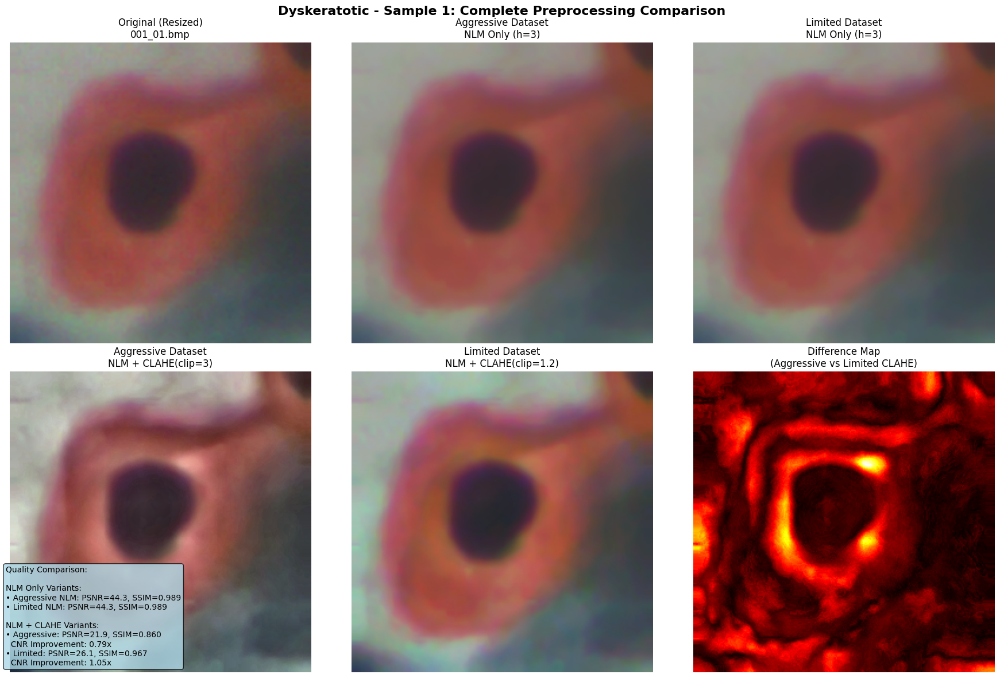

   ✅ Comparison saved: complete_dataset_comparison_im_Dyskeratotic_sample_1.png


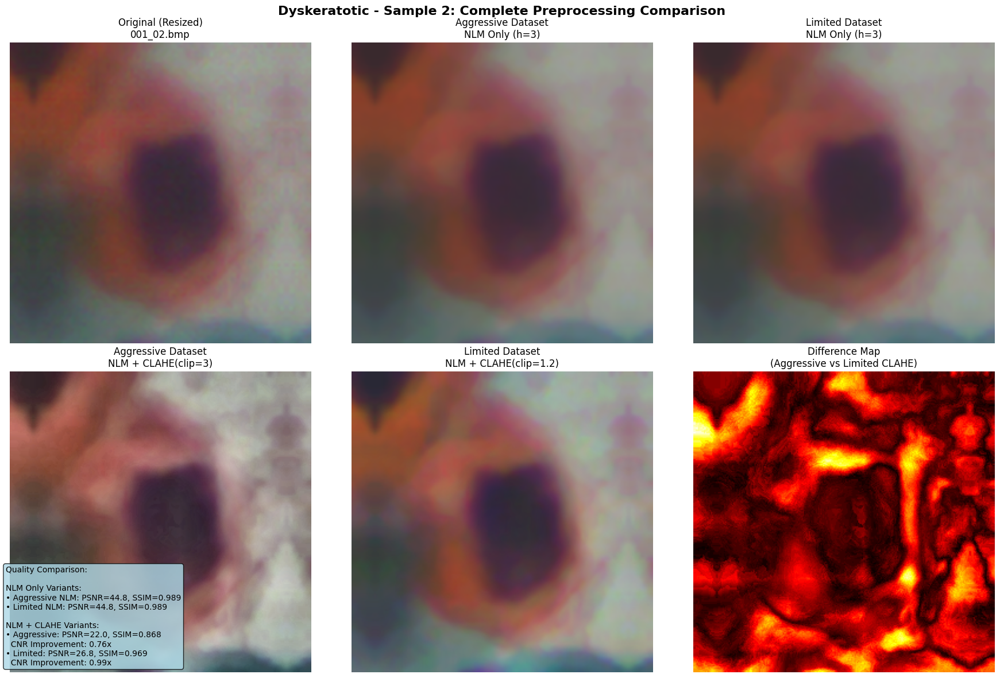

   ✅ Comparison saved: complete_dataset_comparison_im_Dyskeratotic_sample_2.png

Processing im_Koilocytotic visualizations...


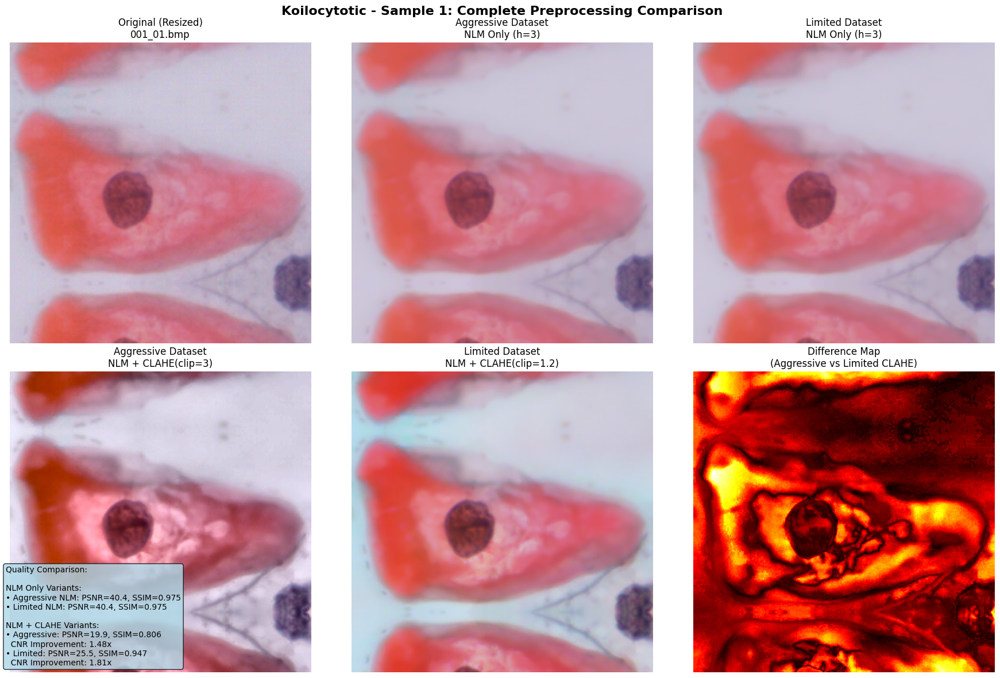

   ✅ Comparison saved: complete_dataset_comparison_im_Koilocytotic_sample_1.png


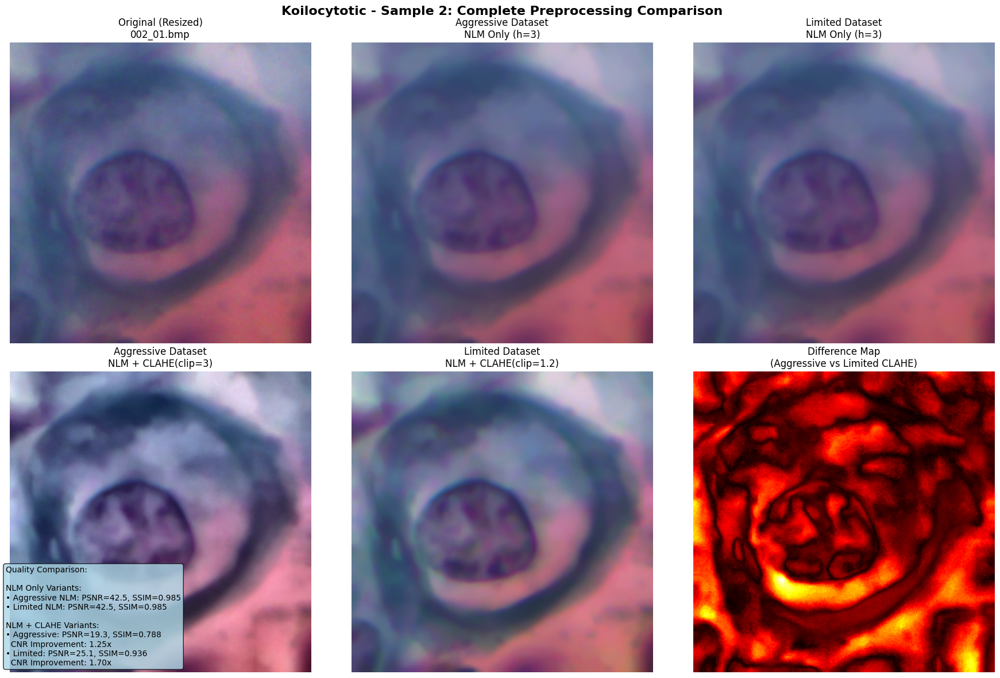

   ✅ Comparison saved: complete_dataset_comparison_im_Koilocytotic_sample_2.png

Processing im_Metaplastic visualizations...


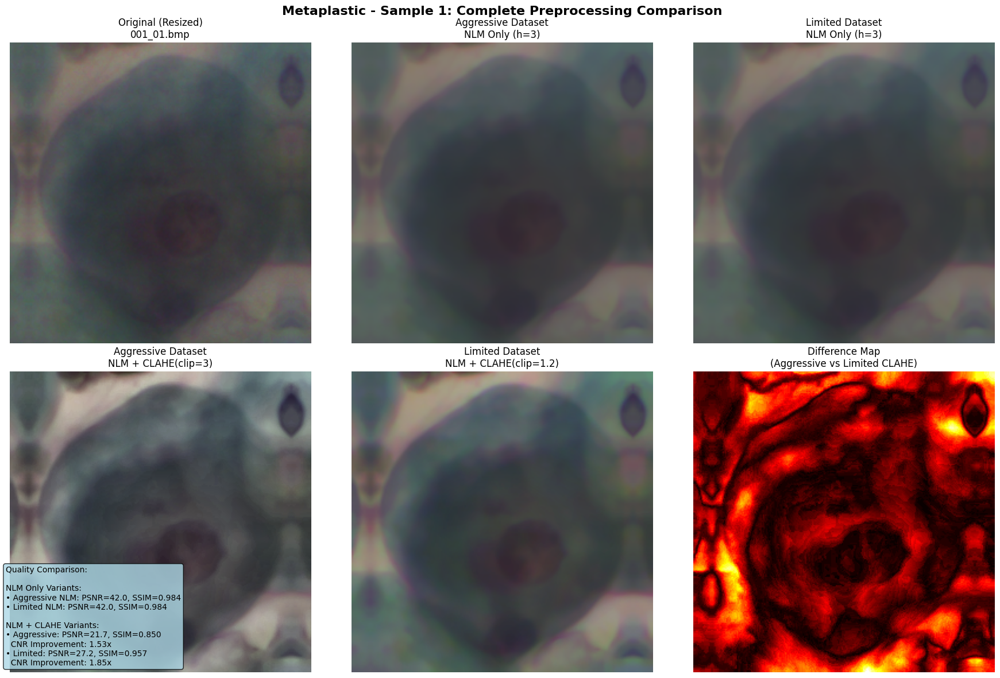

   ✅ Comparison saved: complete_dataset_comparison_im_Metaplastic_sample_1.png


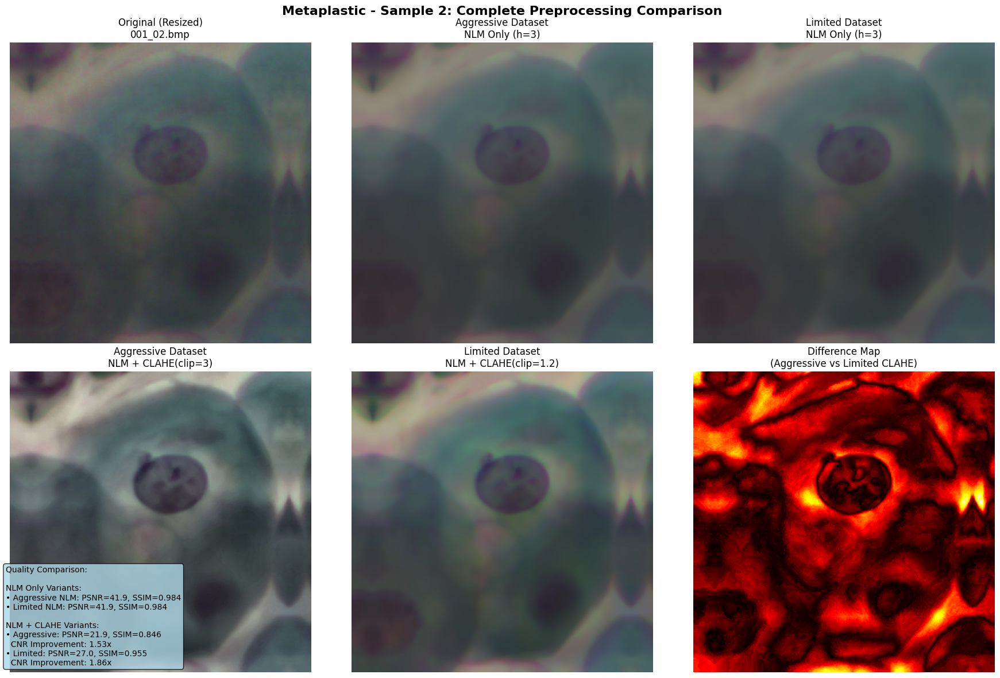

   ✅ Comparison saved: complete_dataset_comparison_im_Metaplastic_sample_2.png

Processing im_Parabasal visualizations...


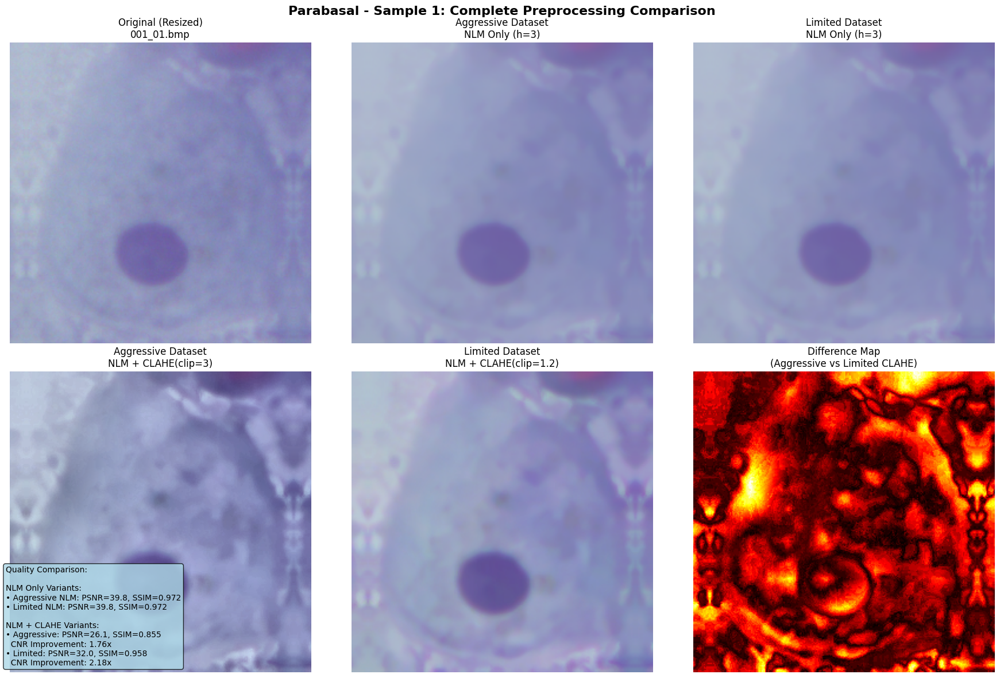

   ✅ Comparison saved: complete_dataset_comparison_im_Parabasal_sample_1.png


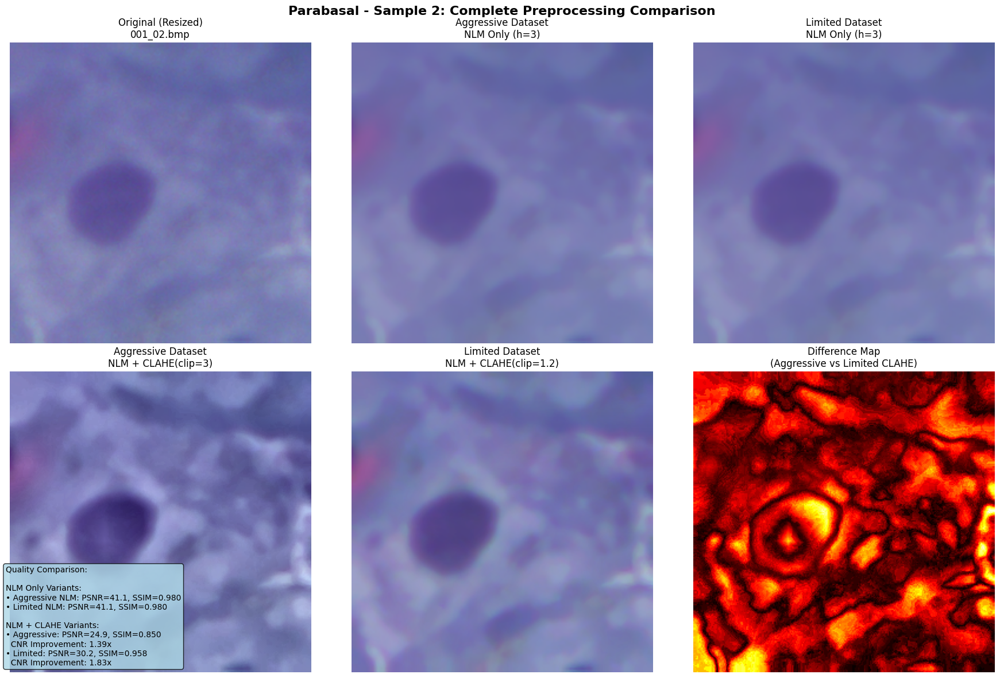

   ✅ Comparison saved: complete_dataset_comparison_im_Parabasal_sample_2.png

Processing im_Superficial-Intermediate visualizations...


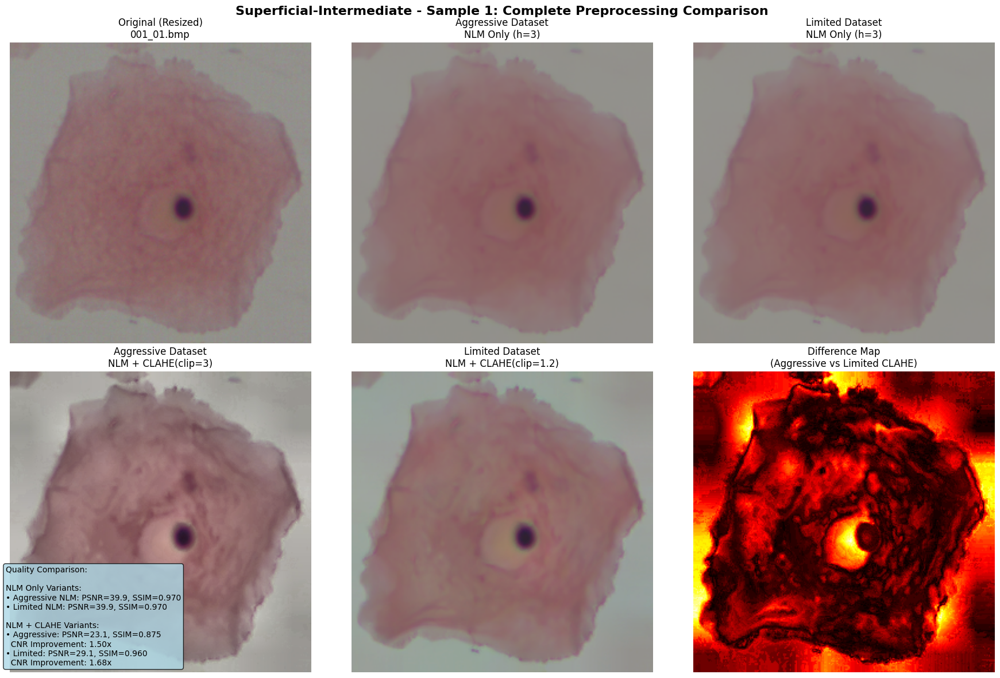

   ✅ Comparison saved: complete_dataset_comparison_im_Superficial-Intermediate_sample_1.png


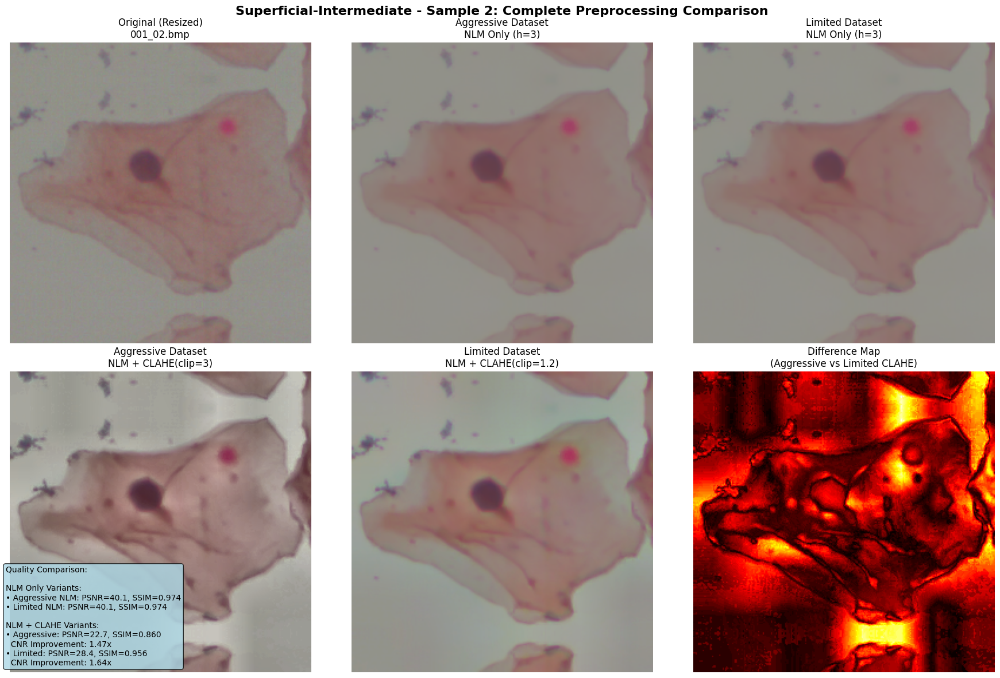

   ✅ Comparison saved: complete_dataset_comparison_im_Superficial-Intermediate_sample_2.png

DATASET STATISTICS ANALYSIS
im_Dyskeratotic:
  Aggressive Dataset: 813 NLM-only, 813 NLM+CLAHE
  Limited Dataset: 813 NLM-only, 813 NLM+CLAHE
im_Koilocytotic:
  Aggressive Dataset: 825 NLM-only, 825 NLM+CLAHE
  Limited Dataset: 825 NLM-only, 825 NLM+CLAHE
im_Metaplastic:
  Aggressive Dataset: 793 NLM-only, 793 NLM+CLAHE
  Limited Dataset: 793 NLM-only, 793 NLM+CLAHE
im_Parabasal:
  Aggressive Dataset: 787 NLM-only, 787 NLM+CLAHE
  Limited Dataset: 787 NLM-only, 787 NLM+CLAHE
im_Superficial-Intermediate:
  Aggressive Dataset: 831 NLM-only, 831 NLM+CLAHE
  Limited Dataset: 831 NLM-only, 831 NLM+CLAHE

📊 OVERALL STATISTICS:
Aggressive Enhancement Dataset:
  • NLM-only images: 4049
  • NLM+CLAHE images: 4049
  • Total: 8098
Limited Enhancement Dataset:
  • NLM-only images: 4049
  • NLM+CLAHE images: 4049
  • Total: 8098
✅ Both datasets have the same number of images (consistent)

AUGMENTED DATASET 

In [76]:
def create_dataset_comparison_visualization(num_samples_per_class=2):
    """
    Create comparison visualizations showing original vs both processed variants.
    """
    print(f"\n{'='*70}")
    print("CREATING DATASET COMPARISON VISUALIZATIONS")
    print(f"{'='*70}")
    
    for class_name in CLASS_NAMES:
        print(f"\nProcessing {class_name} visualizations...")
        
        # Get sample files from each dataset
        original_path = RAW_DATASET_PATH / class_name / class_name / "CROPPED"
        aggressive_nlm_path = AGGRESSIVE_DATASET_DIR / class_name / "NLM_Only"
        aggressive_clahe_path = AGGRESSIVE_DATASET_DIR / class_name / "NLM_CLAHE"
        limited_nlm_path = LIMITED_DATASET_DIR / class_name / "NLM_Only"
        limited_clahe_path = LIMITED_DATASET_DIR / class_name / "NLM_CLAHE"
        
        if not all([original_path.exists(), aggressive_nlm_path.exists(), 
                   aggressive_clahe_path.exists(), limited_nlm_path.exists(), limited_clahe_path.exists()]):
            print(f"   ⚠️  Skipping {class_name} - paths not found")
            continue
        
        # Get corresponding files
        original_files = sorted(list(original_path.glob('*.bmp')))[:num_samples_per_class]
        
        for sample_idx, original_file in enumerate(original_files):
            try:
                # Load original image
                original_img = cv2.imread(str(original_file))
                if original_img is None:
                    continue
                
                # Resize original for comparison
                original_resized, _, _ = resize_with_aspect_ratio_mirroring(original_img, TARGET_SIZE)
                
                # Find corresponding processed files
                base_name = f"{original_file.stem}_processed.bmp"
                aggressive_nlm_file = aggressive_nlm_path / base_name
                aggressive_clahe_file = aggressive_clahe_path / base_name
                limited_nlm_file = limited_nlm_path / base_name
                limited_clahe_file = limited_clahe_path / base_name
                
                if not all([aggressive_nlm_file.exists(), aggressive_clahe_file.exists(),
                           limited_nlm_file.exists(), limited_clahe_file.exists()]):
                    print(f"   ⚠️  Skipping {original_file.name} - processed files not found")
                    continue
                
                # Load processed images
                aggressive_nlm_img = cv2.imread(str(aggressive_nlm_file))
                aggressive_clahe_img = cv2.imread(str(aggressive_clahe_file))
                limited_nlm_img = cv2.imread(str(limited_nlm_file))
                limited_clahe_img = cv2.imread(str(limited_clahe_file))
                
                if any(img is None for img in [aggressive_nlm_img, aggressive_clahe_img, limited_nlm_img, limited_clahe_img]):
                    continue
                
                # Create comparison plot (2x3 grid)
                fig, axes = plt.subplots(2, 3, figsize=(18, 12))
                
                # Convert BGR to RGB for matplotlib
                original_rgb = cv2.cvtColor(original_resized, cv2.COLOR_BGR2RGB)
                aggressive_nlm_rgb = cv2.cvtColor(aggressive_nlm_img, cv2.COLOR_BGR2RGB)
                aggressive_clahe_rgb = cv2.cvtColor(aggressive_clahe_img, cv2.COLOR_BGR2RGB)
                limited_nlm_rgb = cv2.cvtColor(limited_nlm_img, cv2.COLOR_BGR2RGB)
                limited_clahe_rgb = cv2.cvtColor(limited_clahe_img, cv2.COLOR_BGR2RGB)
                
                # First row: Original and NLM variants
                axes[0, 0].imshow(original_rgb)
                axes[0, 0].set_title(f'Original (Resized)\n{original_file.name}', fontsize=12)
                axes[0, 0].axis('off')
                
                axes[0, 1].imshow(aggressive_nlm_rgb)
                axes[0, 1].set_title(f'Aggressive Dataset\nNLM Only (h={NLM_PARAMS["h"]})', fontsize=12)
                axes[0, 1].axis('off')
                
                axes[0, 2].imshow(limited_nlm_rgb)
                axes[0, 2].set_title(f'Limited Dataset\nNLM Only (h={NLM_PARAMS["h"]})', fontsize=12)
                axes[0, 2].axis('off')
                
                # Second row: CLAHE variants and difference
                axes[1, 0].imshow(aggressive_clahe_rgb)
                axes[1, 0].set_title(f'Aggressive Dataset\nNLM + CLAHE(clip={AGGRESSIVE_CLAHE_PARAMS["clip_limit"]})', fontsize=12)
                axes[1, 0].axis('off')
                
                axes[1, 1].imshow(limited_clahe_rgb)
                axes[1, 1].set_title(f'Limited Dataset\nNLM + CLAHE(clip={LIMITED_CLAHE_PARAMS["clip_limit"]})', fontsize=12)
                axes[1, 1].axis('off')
                
                # Difference between aggressive and limited CLAHE
                diff_image = np.abs(aggressive_clahe_rgb.astype(np.float32) - limited_clahe_rgb.astype(np.float32))
                diff_gray = np.mean(diff_image, axis=2).astype(np.uint8)
                axes[1, 2].imshow(diff_gray, cmap='hot')
                axes[1, 2].set_title('Difference Map\n(Aggressive vs Limited CLAHE)', fontsize=12)
                axes[1, 2].axis('off')
                
                # Calculate quality metrics for comparison
                aggressive_nlm_metrics = assess_clahe_quality(original_resized, aggressive_nlm_img)
                aggressive_clahe_metrics = assess_clahe_quality(original_resized, aggressive_clahe_img)
                limited_nlm_metrics = assess_clahe_quality(original_resized, limited_nlm_img)
                limited_clahe_metrics = assess_clahe_quality(original_resized, limited_clahe_img)
                
                # Add metrics text
                metrics_text = f"""Quality Comparison:

NLM Only Variants:
• Aggressive NLM: PSNR={aggressive_nlm_metrics['psnr']:.1f}, SSIM={aggressive_nlm_metrics['ssim']:.3f}
• Limited NLM: PSNR={limited_nlm_metrics['psnr']:.1f}, SSIM={limited_nlm_metrics['ssim']:.3f}

NLM + CLAHE Variants:
• Aggressive: PSNR={aggressive_clahe_metrics['psnr']:.1f}, SSIM={aggressive_clahe_metrics['ssim']:.3f}
  CNR Improvement: {aggressive_clahe_metrics['cnr_improvement']:.2f}x
• Limited: PSNR={limited_clahe_metrics['psnr']:.1f}, SSIM={limited_clahe_metrics['ssim']:.3f}
  CNR Improvement: {limited_clahe_metrics['cnr_improvement']:.2f}x"""
                
                fig.text(0.02, 0.02, metrics_text, fontsize=10, verticalalignment='bottom',
                        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
                
                plt.suptitle(f'{class_name.replace("im_", "")} - Sample {sample_idx + 1}: Complete Preprocessing Comparison', 
                            fontsize=16, fontweight='bold')
                plt.tight_layout()
                
                # Save comparison
                save_name = f'complete_dataset_comparison_{class_name}_sample_{sample_idx + 1}.png'
                comparison_save_path = OUTPUT_DIR / 'visualizations' / save_name
                plt.savefig(comparison_save_path, dpi=300, bbox_inches='tight')
                plt.show()
                
                print(f"   ✅ Comparison saved: {save_name}")
                
            except Exception as e:
                print(f"   ❌ Error creating comparison for {original_file.name}: {e}")

def analyze_dataset_statistics():
    """
    Analyze and compare statistics of both generated datasets with subfolders.
    """
    print(f"\n{'='*70}")
    print("DATASET STATISTICS ANALYSIS")
    print(f"{'='*70}")
    
    stats = {
        'aggressive': {'nlm_only': 0, 'nlm_clahe': 0, 'class_counts': {}},
        'limited': {'nlm_only': 0, 'nlm_clahe': 0, 'class_counts': {}}
    }
    
    for class_name in CLASS_NAMES:
        # Count files in each dataset and subfolder
        aggressive_nlm_files = list((AGGRESSIVE_DATASET_DIR / class_name / "NLM_Only").glob('*_processed.bmp'))
        aggressive_clahe_files = list((AGGRESSIVE_DATASET_DIR / class_name / "NLM_CLAHE").glob('*_processed.bmp'))
        limited_nlm_files = list((LIMITED_DATASET_DIR / class_name / "NLM_Only").glob('*_processed.bmp'))
        limited_clahe_files = list((LIMITED_DATASET_DIR / class_name / "NLM_CLAHE").glob('*_processed.bmp'))
        
        stats['aggressive']['class_counts'][class_name] = {
            'nlm_only': len(aggressive_nlm_files),
            'nlm_clahe': len(aggressive_clahe_files)
        }
        stats['limited']['class_counts'][class_name] = {
            'nlm_only': len(limited_nlm_files),
            'nlm_clahe': len(limited_clahe_files)
        }
        
        stats['aggressive']['nlm_only'] += len(aggressive_nlm_files)
        stats['aggressive']['nlm_clahe'] += len(aggressive_clahe_files)
        stats['limited']['nlm_only'] += len(limited_nlm_files)
        stats['limited']['nlm_clahe'] += len(limited_clahe_files)
        
        print(f"{class_name}:")
        print(f"  Aggressive Dataset: {len(aggressive_nlm_files)} NLM-only, {len(aggressive_clahe_files)} NLM+CLAHE")
        print(f"  Limited Dataset: {len(limited_nlm_files)} NLM-only, {len(limited_clahe_files)} NLM+CLAHE")
    
    print(f"\n📊 OVERALL STATISTICS:")
    print(f"Aggressive Enhancement Dataset:")
    print(f"  • NLM-only images: {stats['aggressive']['nlm_only']}")
    print(f"  • NLM+CLAHE images: {stats['aggressive']['nlm_clahe']}")
    print(f"  • Total: {stats['aggressive']['nlm_only'] + stats['aggressive']['nlm_clahe']}")
    
    print(f"Limited Enhancement Dataset:")
    print(f"  • NLM-only images: {stats['limited']['nlm_only']}")
    print(f"  • NLM+CLAHE images: {stats['limited']['nlm_clahe']}")
    print(f"  • Total: {stats['limited']['nlm_only'] + stats['limited']['nlm_clahe']}")
    
    # Check for consistency
    aggressive_total = stats['aggressive']['nlm_only'] + stats['aggressive']['nlm_clahe']
    limited_total = stats['limited']['nlm_only'] + stats['limited']['nlm_clahe']
    
    if aggressive_total == limited_total:
        print("✅ Both datasets have the same number of images (consistent)")
    else:
        print("⚠️  Datasets have different numbers of images")
    
    return stats

# Generate visualizations and statistics
create_dataset_comparison_visualization(num_samples_per_class=2)
dataset_stats = analyze_dataset_statistics()

print(f"\n{'='*80}")
print("AUGMENTED DATASET GENERATION AND ANALYSIS COMPLETE")
print(f"{'='*80}")
print(f"\n🎯 READY FOR MODEL TRAINING:")
aggressive_total = dataset_stats['aggressive']['nlm_only'] + dataset_stats['aggressive']['nlm_clahe']
limited_total = dataset_stats['limited']['nlm_only'] + dataset_stats['limited']['nlm_clahe']
print(f"✅ Aggressive Enhancement Dataset: {aggressive_total} total images")
print(f"   • {dataset_stats['aggressive']['nlm_only']} NLM-only images")
print(f"   • {dataset_stats['aggressive']['nlm_clahe']} NLM+CLAHE images")
print(f"✅ Limited Enhancement Dataset: {limited_total} total images")
print(f"   • {dataset_stats['limited']['nlm_only']} NLM-only images") 
print(f"   • {dataset_stats['limited']['nlm_clahe']} NLM+CLAHE images")
print(f"✅ Comparison visualizations generated")
print(f"✅ Processing logs saved")
print(f"\n📁 Dataset Locations:")
print(f"  • Aggressive: {AGGRESSIVE_DATASET_DIR}")
print(f"  • Limited: {LIMITED_DATASET_DIR}")
print(f"  • Visualizations: {OUTPUT_DIR / 'visualizations'}")
print(f"\n💡 Dataset Usage Recommendations:")
print(f"  • Use NLM_Only folders for comparing denoising effects")
print(f"  • Use NLM_CLAHE folders for enhanced contrast training")
print(f"  • Compare Aggressive vs Limited datasets for optimal enhancement level")